# Capstone: Predicting Customer Churn

## Problem statement

In this project, we will be focusing on churn for bank's credit card customers. We have been engaged by a bank to analyze data collected from existing customers to predict which customer is likely to churn so that the bank can focus their marketing efforts towards such customers and try to provide better services so as to be able to retain existing customers. 

### Contents:
- [Background](#Background)
- [Project goals](#Project-goals)
- [Datasets](#Datasets)
- [Datasets Import and SQL](#Datasets-Import-and-SQL)
- [Data Cleaning and Exploratory Data Analysis](#Data-Cleaning-and-Exploratory-Data-Analysis)
- [Preprocessing](#Preprocessing)
- [Modeling and Evaluation](#Modeling-and-Evaluation)
- [Feature Importance](#Feature-Importance)
- [Further Evaluation, Conclusion and Recommendations](#Further-Evaluation,-Conclusion-and-Recommendations)

## Background

Customer churn, also known as customer attrition rate, is when a customer chooses to stop using a particular products or services. Customer loyalty is something all brands strive for - understanding and preventing churn is critical to achieving this. Based on research ([Link](https://www.chargebee.com/blog/5-off-beat-lessons-saas-industry-reduce-customer-churn/)), we understand that every year companies lose $1.6 trillion in revenue due to customer churn. Every business deals with churn, and more often than not, it's much easier to keep an existing customer than it is to gain a new customer. It is also much easier to save a customer before they leave than it is to convince the customer to come back. Based on an analysis conducted ([Link](https://startuptalky.com/churn-rate-reducing-strategies/)), acquiring a new customer is 5 times the cost more than retaining an existing customer. Additionally, according to research done by Frederick Reichheld of Bain & Company ([Link](https://media.bain.com/Images/BB_Prescription_cutting_costs.pdf)), in financial services, a 5% increase in customer retention produces more than a 25% increase in profit. Therefore, it would be beneficial to understand and reduce the churn rate as this will impact the revenue of a business.

## Project goals

The goal of the project is to build a classification model to try to predict whether a customer will churn and also to understand the features which are important in predicting the churn of a customer. The classification model will be deployed on streamlit app so that predictions can be made from the trained ML classification model.

For our classification model, the main purpose is to predict whether a customer will churn and therefore, we would be focusing on how well the model predicts a customer will churn when a customer really churns. This would refer to the sensitivity/recall of the model, which is to try to reduce the false negatives. However, to also ensure that we optimize our resources in terms of marketing efforts to retain an existing customer, we would also like to try to reduce the false positives. Therefore, the appropriate success metrics to validate our model would be the F1 score, which evaluates both the model's precision and recall ability. Additionally, as we understand from the documentation provided that the dataset is imbalanced, F1 score would also be appropriate as it provides robust results for imbalanced datasets.

Receiver Operating Characteristic (ROC) Curve plots the True Positive Rate (**sensitivity**) (TPR) vs. False Positive Rate (**1 - specificity**) (FPR) for the range of possible decision thresholds (from 0 to 1). The baseline reference line is depicted to portray how good/bad our model is. If the FPR = TPR, then the model curve (blue line) will lie exactly on the orange line. We want a model that minimizes the FPs and FNs so we can maximize with more TPs and TNs. Thus, we need a higher TPR, at a lower FPR, that is, the blue line must be as far away from the orange line as possible. The area under ROC curve must be as big as possible (closer towards the value of 1).

As both the F1 score and ROC AUC take both false positives and false negatives into account, it will be useful to focus more on these 2 metrics. Therefore, the higher the F1 score and the ROC AUC, the better the model is for our classification problem.

## Datasets

There are 3 datasets that we are using for this project, attrition, customer and card. Attrition consists data on the attrition status of the customers, customer consists mainly of the customer data and card consists mainly of the customer's card data. 

### Datasets dictionary

|Column name (Feature)|Type|Dataset|Description|
|:---|:---|:---|:---|
|CLIENTNUM|int|attrition/customer/card|Client number (Unique identifier for the customer holding the account)|
|Attrition_Flag|object|attrition|Whether the customer has attrited|
|Customer_Age|int|customer|Customer's age in years|
|Gender|object|customer|Gender of the customer|
|Dependent_count|int|customer|Number of Dependents|
|Education_Level|object|customer|Educational Qualification of the account holder|
|Maritial_Status|float|customer|Maritial status of the customer|
|Income_Category|object|customer|Annual Income Category of the account holder|
|Card_Category|object|card|Type of card|
|Months_on_book|int|card|Period of relationship with bank|
|Total_Relationship_Count|int|card|Total number of products held by the customer|
|Months_Inactive_12_mon|int|card|No. of months inactive in the last 12 months|
|Contacts_Count_12_mon|int|card|No. of Contacts in the last 12 months|
|Credit_Limit|float|card|Credit Limit on the Credit Card|
|Total_Revolving_Bal|int|card|Total Revolving Balance on the Credit Card|
|Avg_Open_To_Buy|float|card|Open to Buy Credit Line (Average of last 12 months)|
|Total_Amt_Chng_Q4_Q1|float|card|Change in Transaction Amount (Q4 over Q1)
|Total_Trans_Amt|int|card|Total Transaction Amount (Last 12 months)|
|Total_Trans_Ct|int|card|Total Transaction Count (Last 12 months)|
|Total_Ct_Chng_Q4_Q1 |float|card|Change in Transaction Count (Q4 over Q1)|
|Avg_Utilization_Ratio|float|card|Average Card Utilization Ratio|

In [1]:
# Load libraries
import numpy as np # for mathematical computations
import pandas as pd # for data procesing, analysis
import matplotlib.pyplot as plt # for plotting
import sqlite3
import seaborn as sns
import matplotlib.patches as mpatches
from scipy import stats

from sklearn.feature_selection import chi2
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.pipeline import Pipeline 
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, f1_score, plot_roc_curve, roc_auc_score
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression

In [2]:
#!pip3 install imblearn 

## Datasets Import and SQL

In [3]:
# Importing the datasets
attrition = pd.read_csv('./attrition.csv')
customer = pd.read_csv('./customer.csv')
card = pd.read_csv('./card.csv')

In [4]:
# creating a new sqlite DB file (sqlite is a DB based on files, file-based DB, useful for small on-device data storage)
con = sqlite3.connect('test_db.db')

In [5]:
# To convert all column names to lowercase
attrition = attrition.rename(columns=str.lower)
customer = customer.rename(columns=str.lower)
card = card.rename(columns=str.lower)

In [6]:
# storing the datasets in the test_db db
attrition.to_sql(name='attrition',con=con, index=False, if_exists='replace')
customer.to_sql(name='customer',con=con, index=False, if_exists='replace')
card.to_sql(name='card',con=con, index=False, if_exists='replace')

10127

In [7]:
# To read the datasets
sql_query = '''
SELECT * 
FROM attrition
'''
pd.read_sql(sql_query,con)

,clientnum,attrition_flag
0,768805383,Existing Customer
1,818770008,Existing Customer
2,713982108,Existing Customer
3,769911858,Existing Customer
4,709106358,Existing Customer
...,...,...
10122,772366833,Existing Customer
10123,710638233,Attrited Customer
10124,716506083,Attrited Customer
10125,717406983,Attrited Customer


In [8]:
sql_query = '''
SELECT * 
FROM customer
'''
pd.read_sql(sql_query,con)

,clientnum,customer_age,gender,dependent_count,education_level,marital_status,income_category
0,768805383,45,M,3,High School,Married,$60K - $80K
1,818770008,49,F,5,Graduate,Single,Less than $40K
2,713982108,51,M,3,Graduate,Married,$80K - $120K
3,769911858,40,F,4,High School,Unknown,Less than $40K
4,709106358,40,M,3,Uneducated,Married,$60K - $80K
...,...,...,...,...,...,...,...
10122,772366833,50,M,2,Graduate,Single,$40K - $60K
10123,710638233,41,M,2,Unknown,Divorced,$40K - $60K
10124,716506083,44,F,1,High School,Married,Less than $40K
10125,717406983,30,M,2,Graduate,Unknown,$40K - $60K


In [9]:
sql_query = '''
SELECT * 
FROM card
'''
pd.read_sql(sql_query,con)

,clientnum,card_category,months_on_book,total_relationship_count,months_inactive_12_mon,contacts_count_12_mon,credit_limit,total_revolving_bal,avg_open_to_buy,total_amt_chng_q4_q1,total_trans_amt,total_trans_ct,total_ct_chng_q4_q1,avg_utilization_ratio
0,768805383,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,772366833,Blue,40,3,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462
10123,710638233,Blue,25,4,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511
10124,716506083,Blue,36,5,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000
10125,717406983,Blue,36,4,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000


Based on the above, we noted that the column 'clientnum' overlaps in all 3 datasets. We will merge it into 1 combined dataset later on for further project analysis and modeling.

In [10]:
sql_query = '''
SELECT COUNT(*) 
FROM attrition
'''
pd.read_sql(sql_query,con)

,COUNT(*)
0,10127


In [11]:
sql_query = '''
SELECT COUNT(*) 
FROM customer
'''
pd.read_sql(sql_query,con)

,COUNT(*)
0,10127


In [12]:
sql_query = '''
SELECT COUNT(*) 
FROM card
'''
pd.read_sql(sql_query,con)

,COUNT(*)
0,10127


For all 3 datasets, there are 10127 rows of data in each dataset

In [13]:
sql_query = '''
SELECT COUNT(DISTINCT clientnum) as DistinctClient
FROM attrition
'''
pd.read_sql(sql_query,con)

,DistinctClient
0,10127


In [14]:
# To determine the number of existing and attrited customers in the dataset
sql_query = '''
SELECT sum(case when attrition_flag = 'Existing Customer' then 1 else 0 end) AS ExistCount,
    sum(case when attrition_flag = 'Attrited Customer' then 1 else 0 end) AS AttriteCount
FROM attrition
'''
pd.read_sql(sql_query,con)

,ExistCount,AttriteCount
0,8500,1627


In [15]:
# To determine the percentage of attrited customers in the dataset
sql_query = '''
SELECT round(COUNT(attrition_flag)*100.0 / (SELECT COUNT(*) from attrition),2) AS AttritedPercentage
FROM attrition
WHERE attrition_flag = 'Attrited Customer'
'''
pd.read_sql(sql_query,con)

,AttritedPercentage
0,16.07


Based on the values obtained above, we understand that our dataset is imbalanced in terms of the number of existing and attrited customers. Our dataset only has around 16% attrited customers. We will have to deal with this imbalance when modeling our data.

In [16]:
# Based on the documentation provided, we understand that there are 'Unknown' values in the education level, marital status and income category columns
sql_query = '''
SELECT sum(case when Education_Level = 'Unknown' then 1 else 0 end) AS EducationUnknown,
    sum(case when Marital_Status = 'Unknown' then 1 else 0 end) AS MaritalUnknown,
    sum(case when Income_Category = 'Unknown' then 1 else 0 end) AS IncomeUnknown
FROM customer
'''
pd.read_sql(sql_query,con)

,EducationUnknown,MaritalUnknown,IncomeUnknown
0,1519,749,1112


We noted that there are quite a number of rows of data in which 'unknown' values were indicated for the education level, marital status and income category columns. We will keep these rows of data as we understand that in real-life, there might be cases in which such information might not be provided by the customer.

In [17]:
# To understand the average of the credit limits based on the card category
sql_query = '''
SELECT Card_Category, AVG(Credit_Limit) as AvgLimit
FROM card
GROUP BY Card_Category
ORDER BY AvgLimit ASC
'''
pd.read_sql(sql_query,con)

,card_category,AvgLimit
0,Blue,7363.780002
1,Silver,25277.836036
2,Gold,28416.370690
3,Platinum,30283.450000


In [18]:
# To understand the average of the transaction amount based on the card category
sql_query = '''
SELECT Card_Category, AVG(Total_Trans_Amt) as AvgAmt
FROM card
GROUP BY Card_Category
ORDER BY AvgAmt ASC
'''
pd.read_sql(sql_query,con)

,card_category,AvgAmt
0,Blue,4225.406740
1,Silver,6590.482883
2,Gold,7685.612069
3,Platinum,8999.750000


In [19]:
# To merge all datasets together using clientnum
sql_query = '''
SELECT * 
FROM attrition 
INNER JOIN customer
      ON attrition.clientnum = customer.clientnum
INNER JOIN card
      ON attrition.clientnum = card.clientnum
'''
combined_data = pd.read_sql(sql_query,con)

In [20]:
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 23 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   clientnum                 10127 non-null  int64  
 1   attrition_flag            10127 non-null  object 
 2   clientnum                 10127 non-null  int64  
 3   customer_age              10127 non-null  int64  
 4   gender                    10127 non-null  object 
 5   dependent_count           10127 non-null  int64  
 6   education_level           10127 non-null  object 
 7   marital_status            10127 non-null  object 
 8   income_category           10127 non-null  object 
 9   clientnum                 10127 non-null  int64  
 10  card_category             10127 non-null  object 
 11  months_on_book            10127 non-null  int64  
 12  total_relationship_count  10127 non-null  int64  
 13  months_inactive_12_mon    10127 non-null  int64  
 14  contac

We noted that there is a duplicate of the clientnum columns and we will have to remove the duplicate columns. We also noted that there are still 10127 rows of data, which means that the 3 datasets have the same unique client numbers.

In [21]:
# To drop the clientnum duplicate columns
combined_data = combined_data.drop(combined_data.columns[[0, 2, 9]],axis = 1)

In [22]:
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   attrition_flag            10127 non-null  object 
 1   customer_age              10127 non-null  int64  
 2   gender                    10127 non-null  object 
 3   dependent_count           10127 non-null  int64  
 4   education_level           10127 non-null  object 
 5   marital_status            10127 non-null  object 
 6   income_category           10127 non-null  object 
 7   card_category             10127 non-null  object 
 8   months_on_book            10127 non-null  int64  
 9   total_relationship_count  10127 non-null  int64  
 10  months_inactive_12_mon    10127 non-null  int64  
 11  contacts_count_12_mon     10127 non-null  int64  
 12  credit_limit              10127 non-null  float64
 13  total_revolving_bal       10127 non-null  int64  
 14  avg_op

In [23]:
combined_data.to_csv('combined_data.csv', index=False)

## Data Cleaning and Exploratory Data Analysis

In [24]:
combined_data.info()
print(combined_data.shape)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   attrition_flag            10127 non-null  object 
 1   customer_age              10127 non-null  int64  
 2   gender                    10127 non-null  object 
 3   dependent_count           10127 non-null  int64  
 4   education_level           10127 non-null  object 
 5   marital_status            10127 non-null  object 
 6   income_category           10127 non-null  object 
 7   card_category             10127 non-null  object 
 8   months_on_book            10127 non-null  int64  
 9   total_relationship_count  10127 non-null  int64  
 10  months_inactive_12_mon    10127 non-null  int64  
 11  contacts_count_12_mon     10127 non-null  int64  
 12  credit_limit              10127 non-null  float64
 13  total_revolving_bal       10127 non-null  int64  
 14  avg_op

In [25]:
# To check for missing data
combined_data.isnull().sum()

attrition_flag              0
customer_age                0
gender                      0
dependent_count             0
education_level             0
marital_status              0
income_category             0
card_category               0
months_on_book              0
total_relationship_count    0
months_inactive_12_mon      0
contacts_count_12_mon       0
credit_limit                0
total_revolving_bal         0
avg_open_to_buy             0
total_amt_chng_q4_q1        0
total_trans_amt             0
total_trans_ct              0
total_ct_chng_q4_q1         0
avg_utilization_ratio       0
dtype: int64

Based on the above, there are no missing values in our dateset. We will continue to do exploratory data analysis.

### Numerical features

In [26]:
numerical_features = [feature for feature in combined_data.columns if combined_data[feature].dtypes != 'object']

In [27]:
numerical_features

['customer_age',
 'dependent_count',
 'months_on_book',
 'total_relationship_count',
 'months_inactive_12_mon',
 'contacts_count_12_mon',
 'credit_limit',
 'total_revolving_bal',
 'avg_open_to_buy',
 'total_amt_chng_q4_q1',
 'total_trans_amt',
 'total_trans_ct',
 'total_ct_chng_q4_q1',
 'avg_utilization_ratio']

In [28]:
def plothist(feature):
    sns.histplot(data=combined_data,x=feature).set(title= f"Histogram plot of {feature}")

In [29]:
def plotbyattrition_continuous(feature):
    fig, axes = plt.subplots(1,2, figsize=(25, 25))
    plt.subplot(1,2,1)
    sns.histplot(data=combined_data,x=feature,hue='attrition_flag').set(title= f"Histogram plot of {feature} by attrition status");
    
    plt.subplot(1,2,2)
    sns.boxplot(x='attrition_flag',y=feature,data=combined_data).set(title= f"Boxplot of {feature} by attrition status");

In [30]:
def plotbyattrition_discrete_bar(feature):
    plt.rcParams["figure.figsize"] = [50, 50]
    plt.rcParams.update({'font.size': 22})
    x_var, y_var = feature, "attrition_flag"
    combined_data_grouped = combined_data.groupby(x_var)[y_var].value_counts(normalize=True).unstack(y_var)
    combined_data_grouped.plot.barh(stacked=True)
    plt.legend(
        bbox_to_anchor=(0.5, 1.02),
        loc="lower center",
        borderaxespad=0,
        frameon=False,
        ncol=3,
    )
    for ix, row in combined_data_grouped.reset_index(drop=True).iterrows():
        cumulative = 0
        for element in row:
            if element > 0.05:
                plt.text(
                    cumulative + element / 2,
                    ix,
                    f"{int(element * 100)} %",
                    va="center",
                    ha="center",
                )
            cumulative += element
    plt.tight_layout()
    plt.title(f"Percentage of {feature} by attrition status")

In [31]:
def plotbyattrition_discrete_box(feature):
    sns.boxplot(x='attrition_flag',y=feature,data=combined_data).set(title= f"Boxplot of {feature} by attrition status");

#### Customer Age

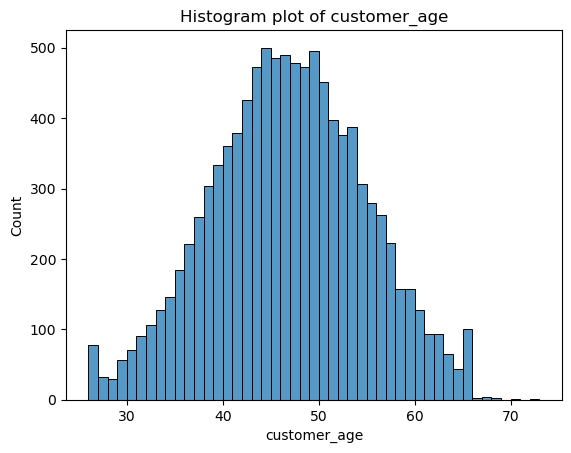

In [32]:
plothist('customer_age')

Based on the histogram above, we can see that most of the customers are within the age range of 35 to 55 years old. It also seems that the distribution of customer age follows a normal distribution. 

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values


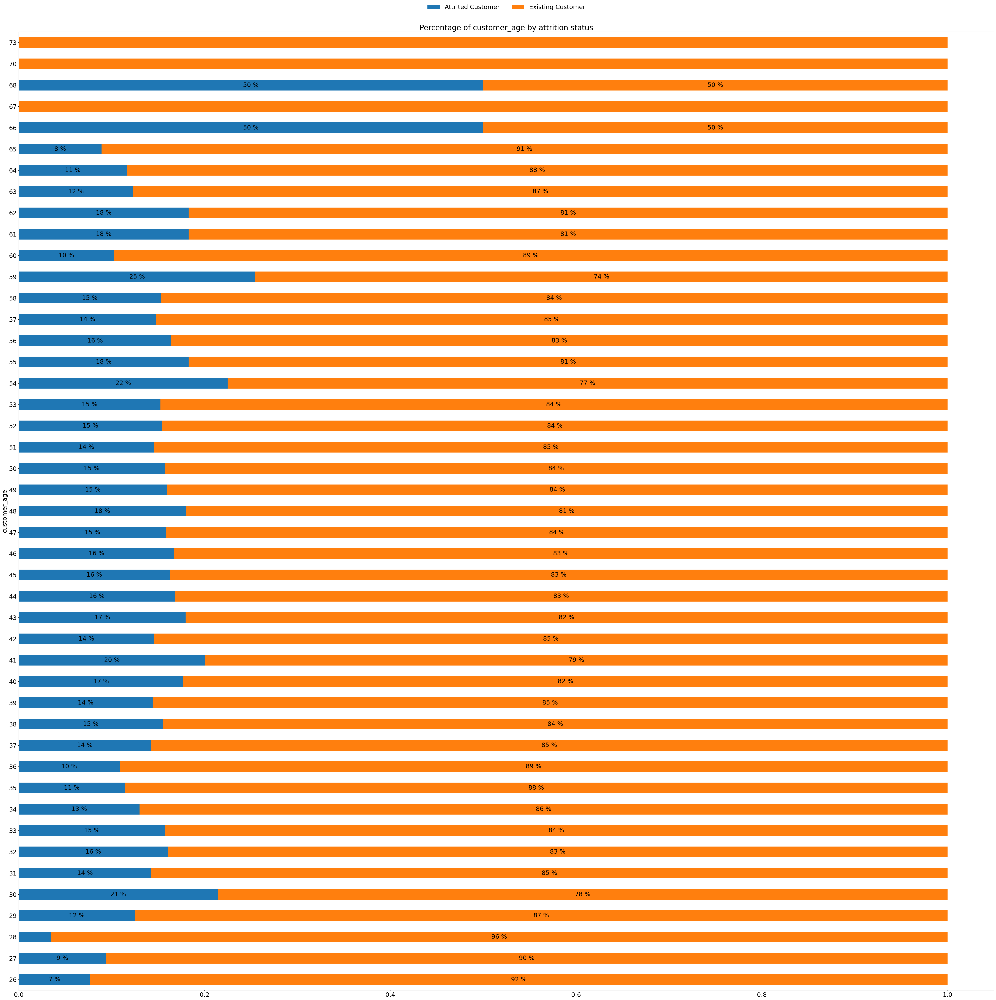

In [33]:
plotbyattrition_discrete_bar('customer_age')

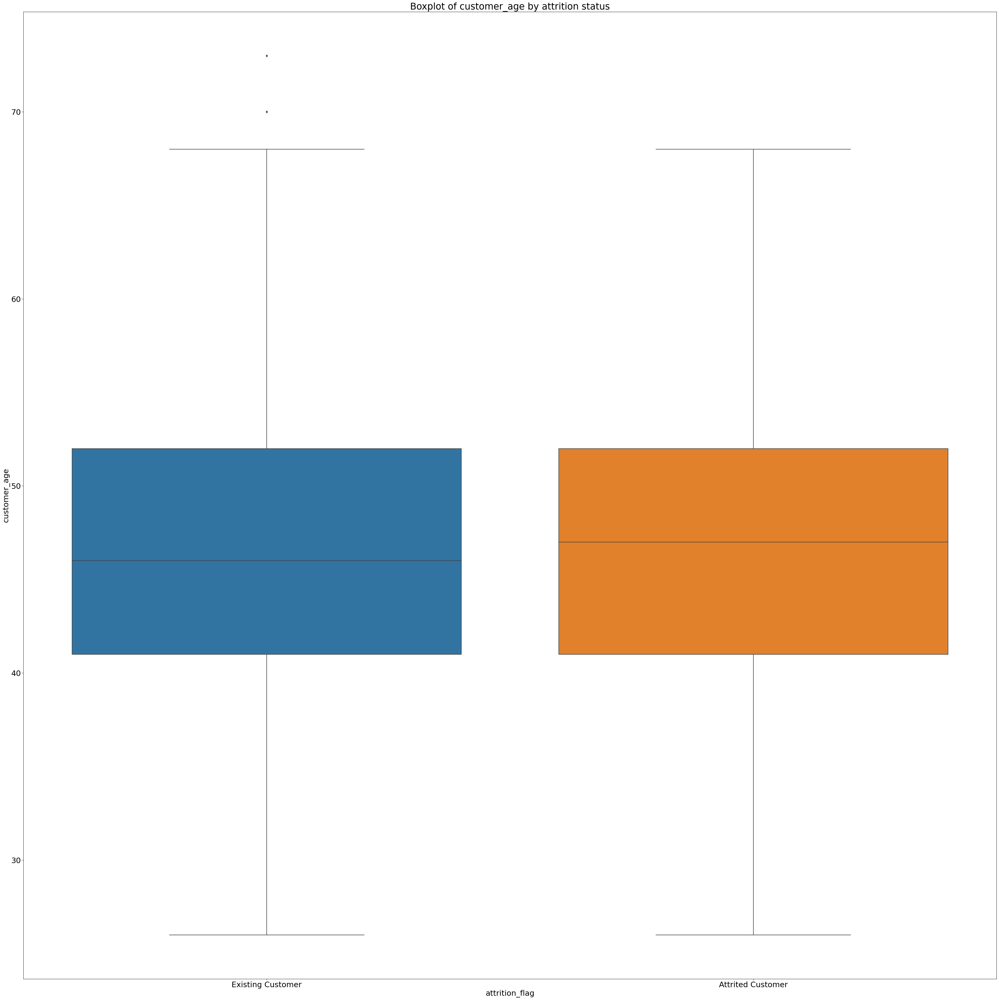

In [34]:
plotbyattrition_discrete_box('customer_age')

#### Dependent count

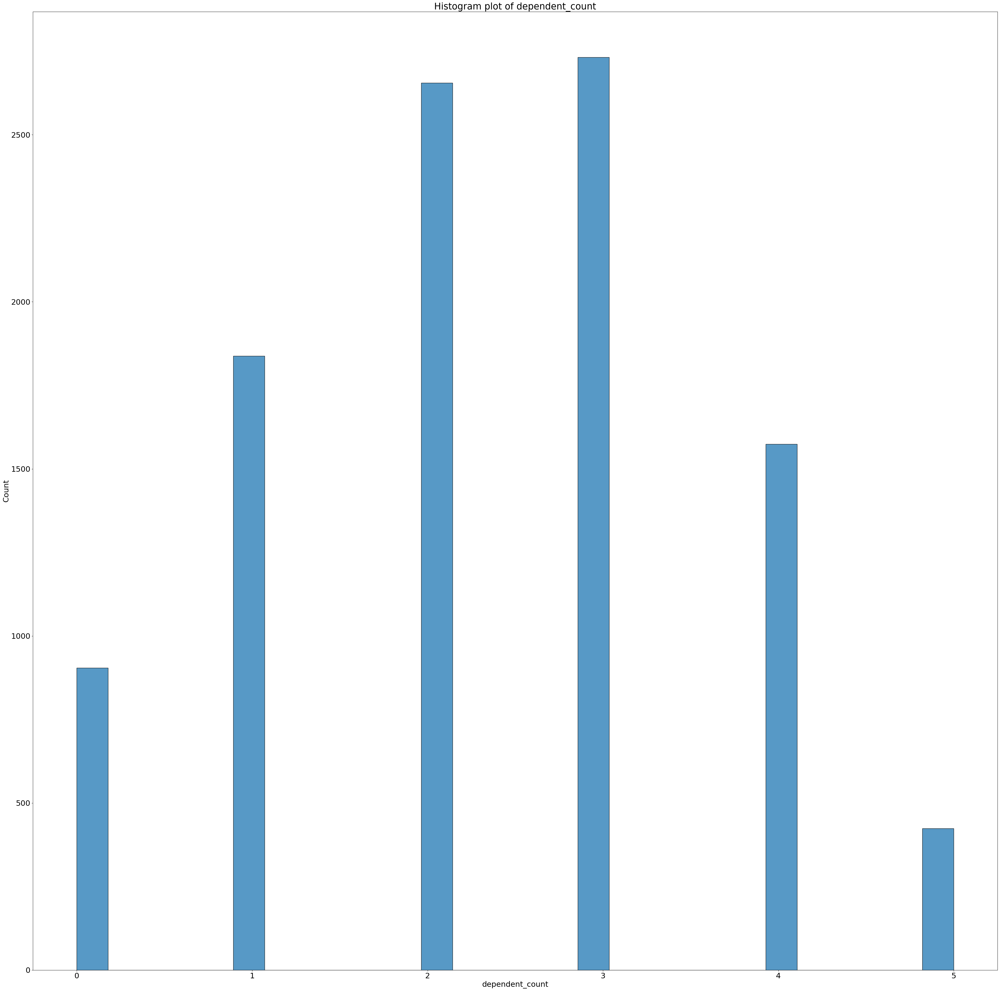

In [35]:
plothist('dependent_count')

Based on the histogram above, we noted that most of the customers have around 1 to 4 dependents. 

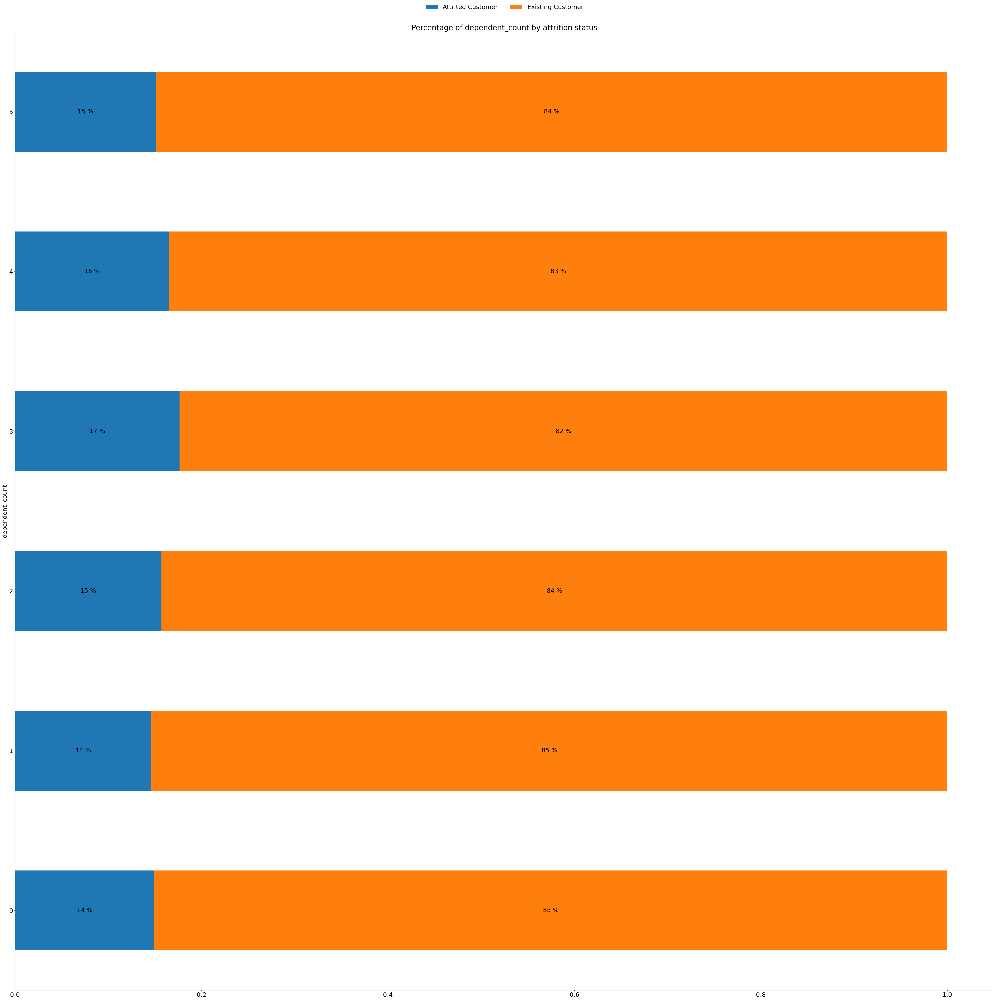

In [36]:
plotbyattrition_discrete_bar('dependent_count')

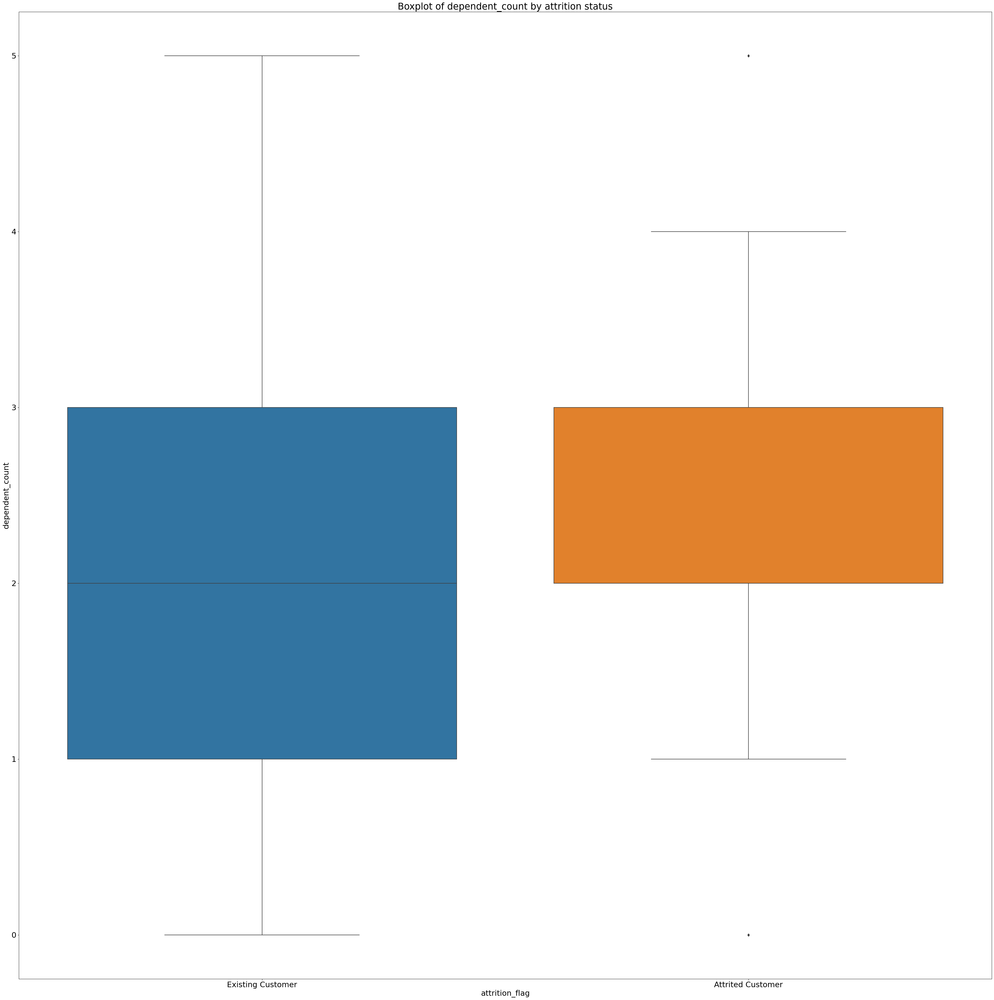

In [37]:
plotbyattrition_discrete_box('dependent_count')

#### Months on book

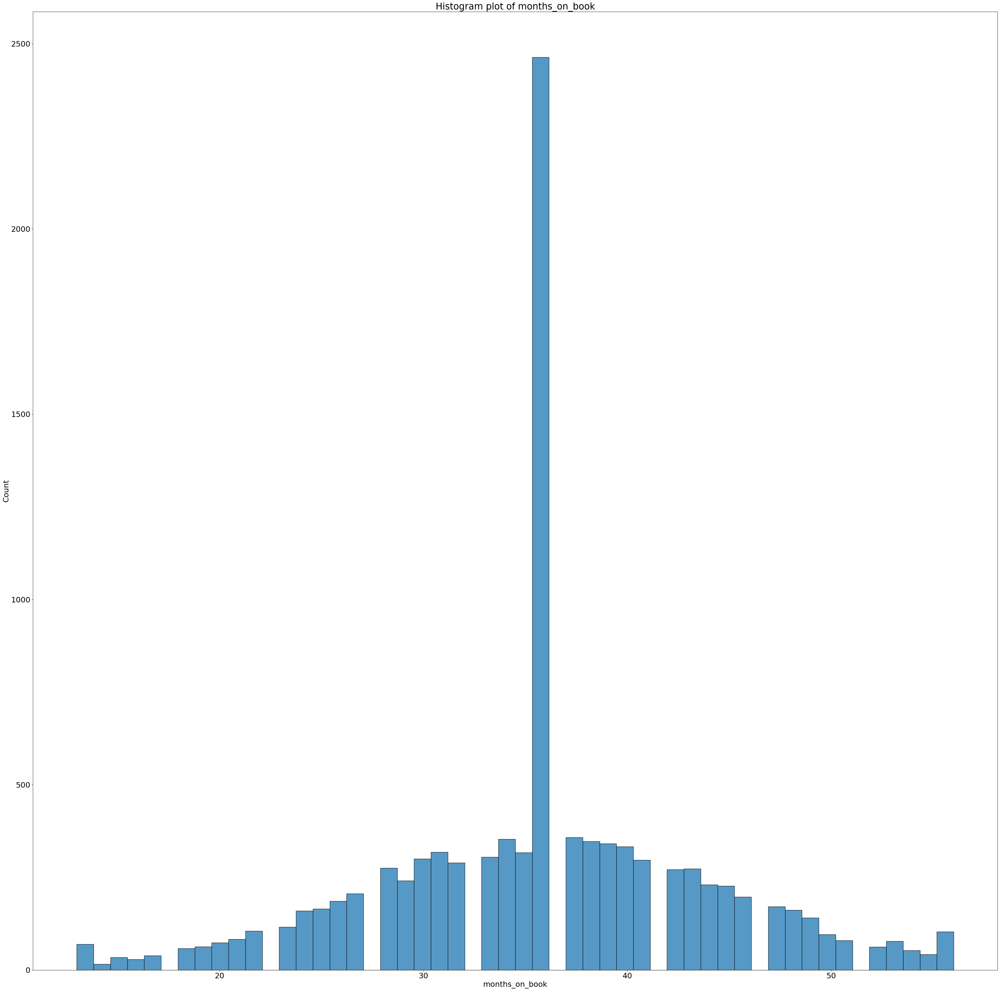

In [38]:
plothist('months_on_book')

Based on the histogram above, we noted that there are a large amount of customers who have been with the bank for 36 months (around 3 years).

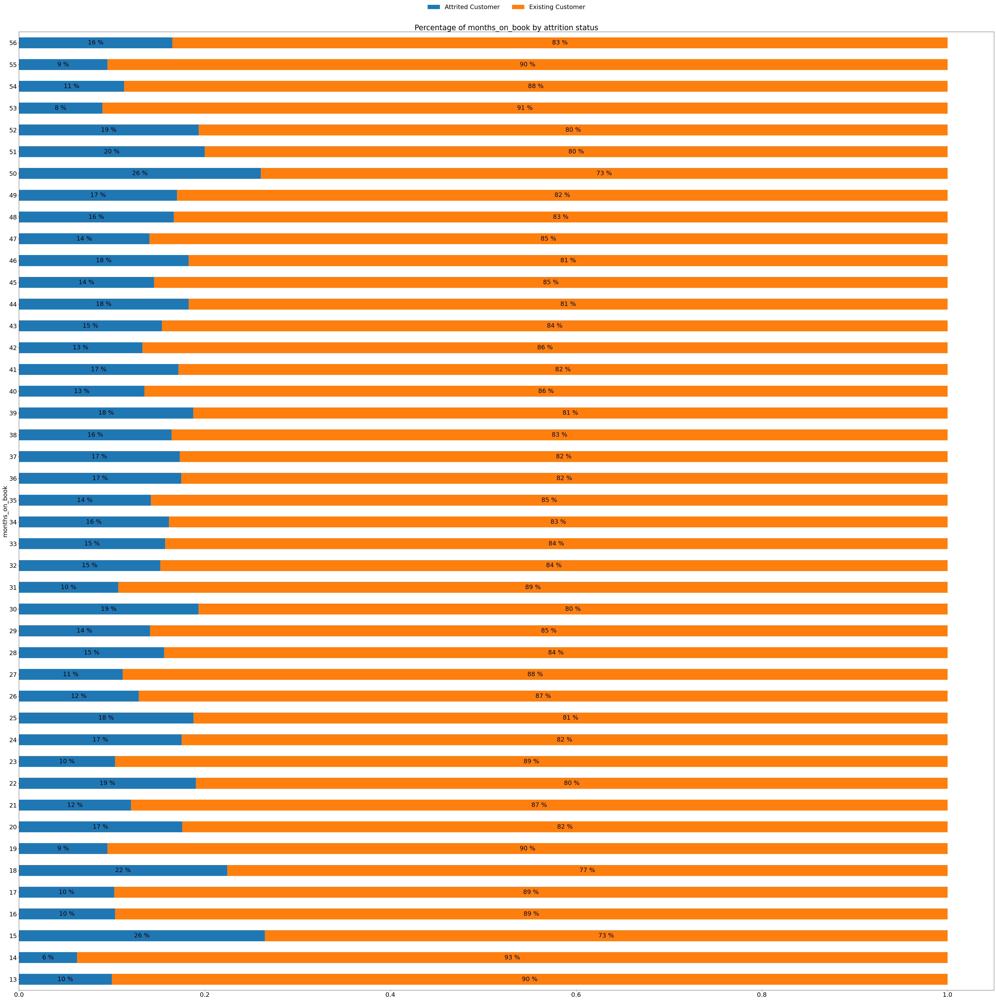

In [39]:
plotbyattrition_discrete_bar('months_on_book')

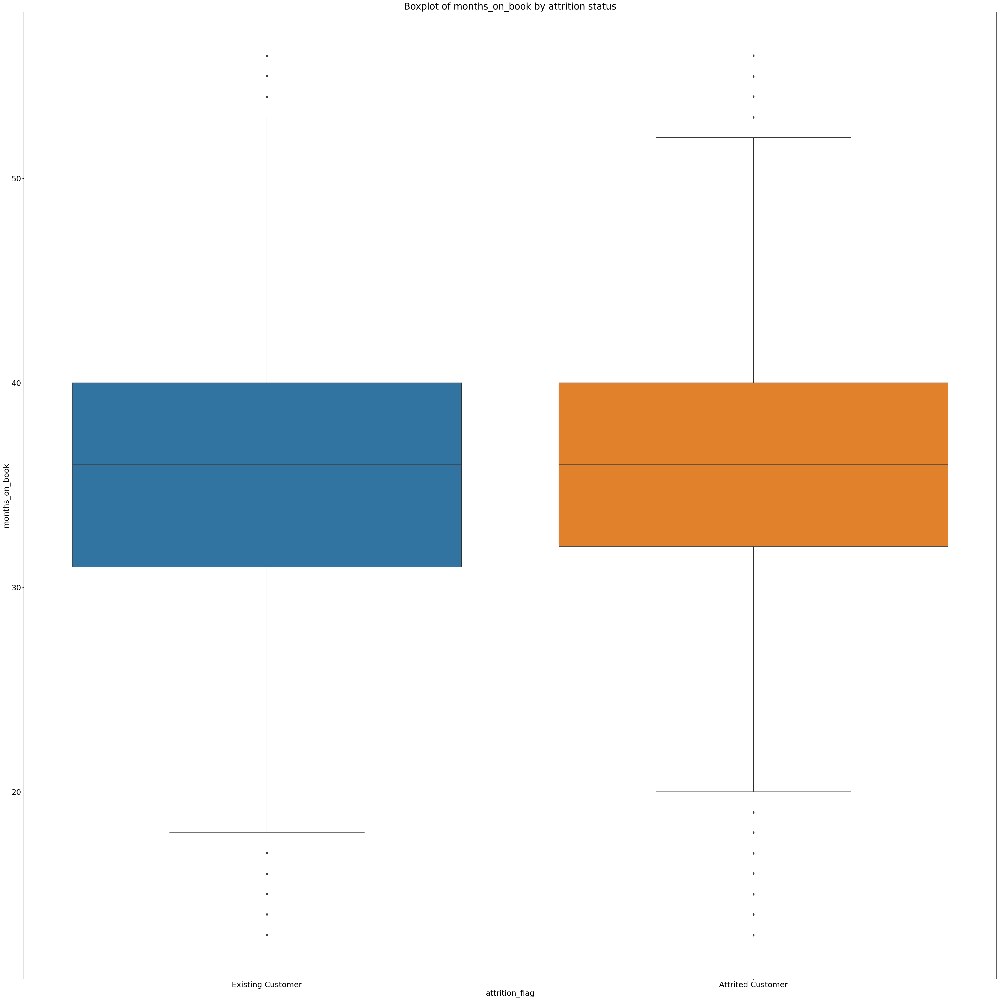

In [40]:
plotbyattrition_discrete_box('months_on_book')

#### Total Relationship count

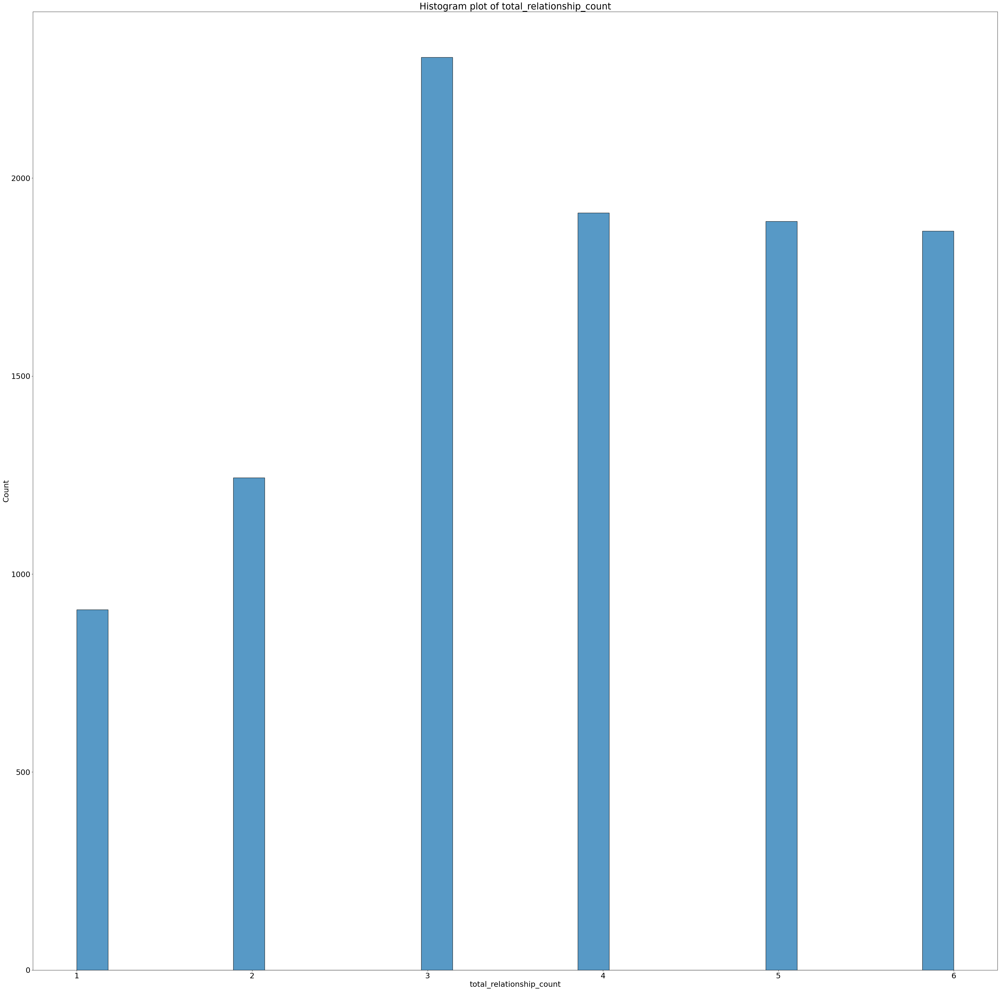

In [41]:
plothist('total_relationship_count')

Based on the histogram above, we noted that most of the customers have more than 3 products with the bank. 

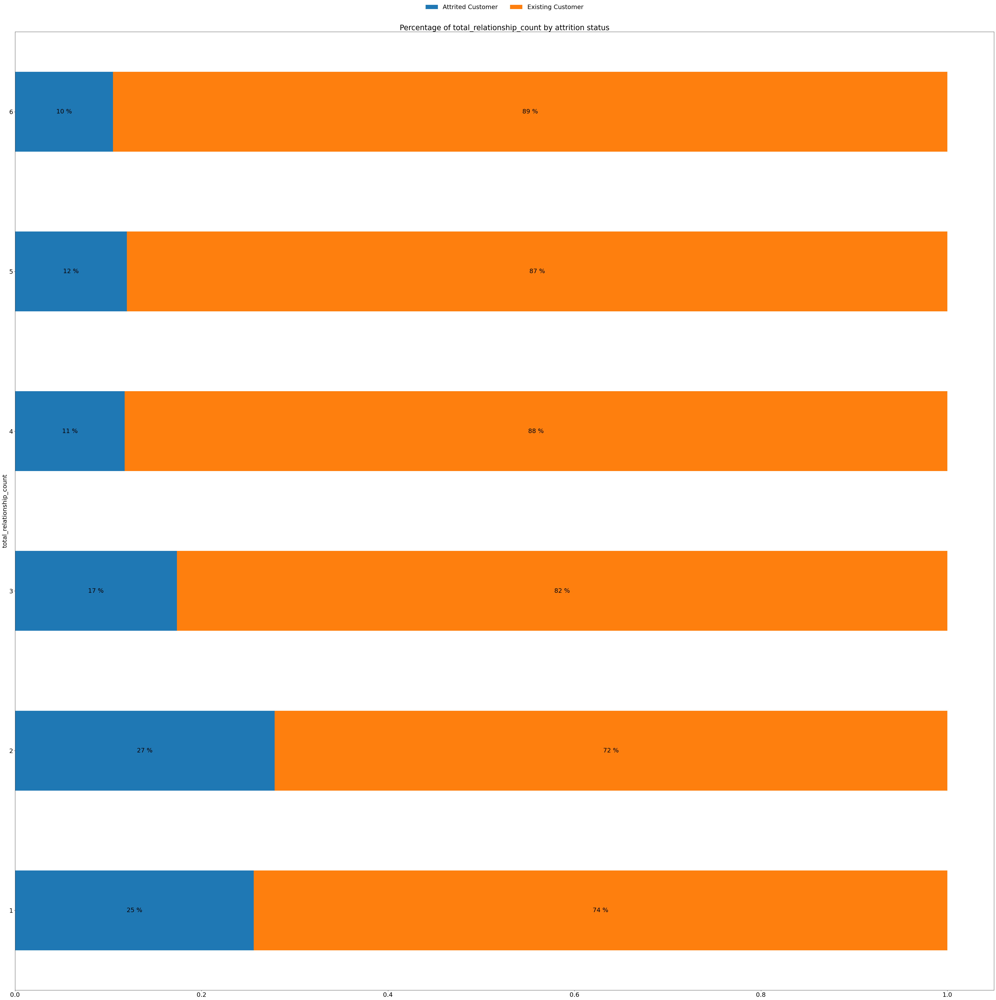

In [42]:
plotbyattrition_discrete_bar('total_relationship_count')

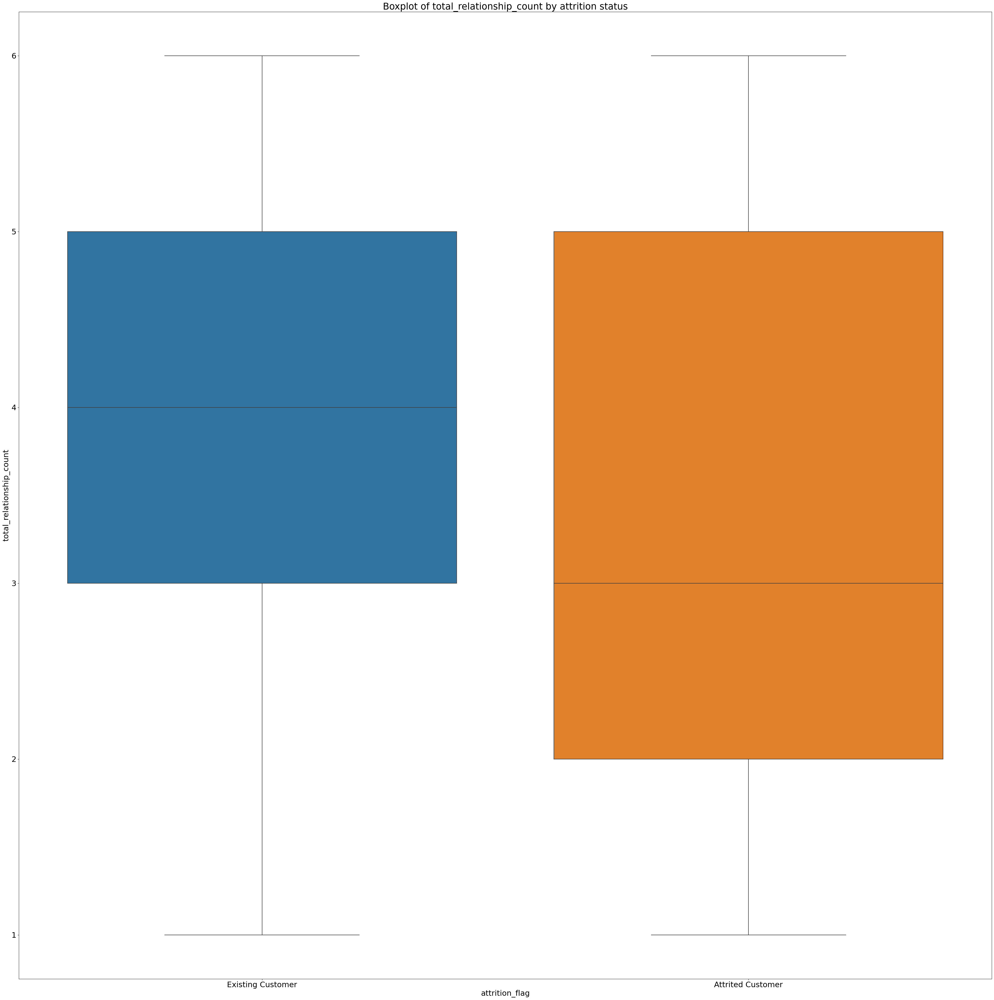

In [43]:
plotbyattrition_discrete_box('total_relationship_count')

#### Months inactive in 12 months

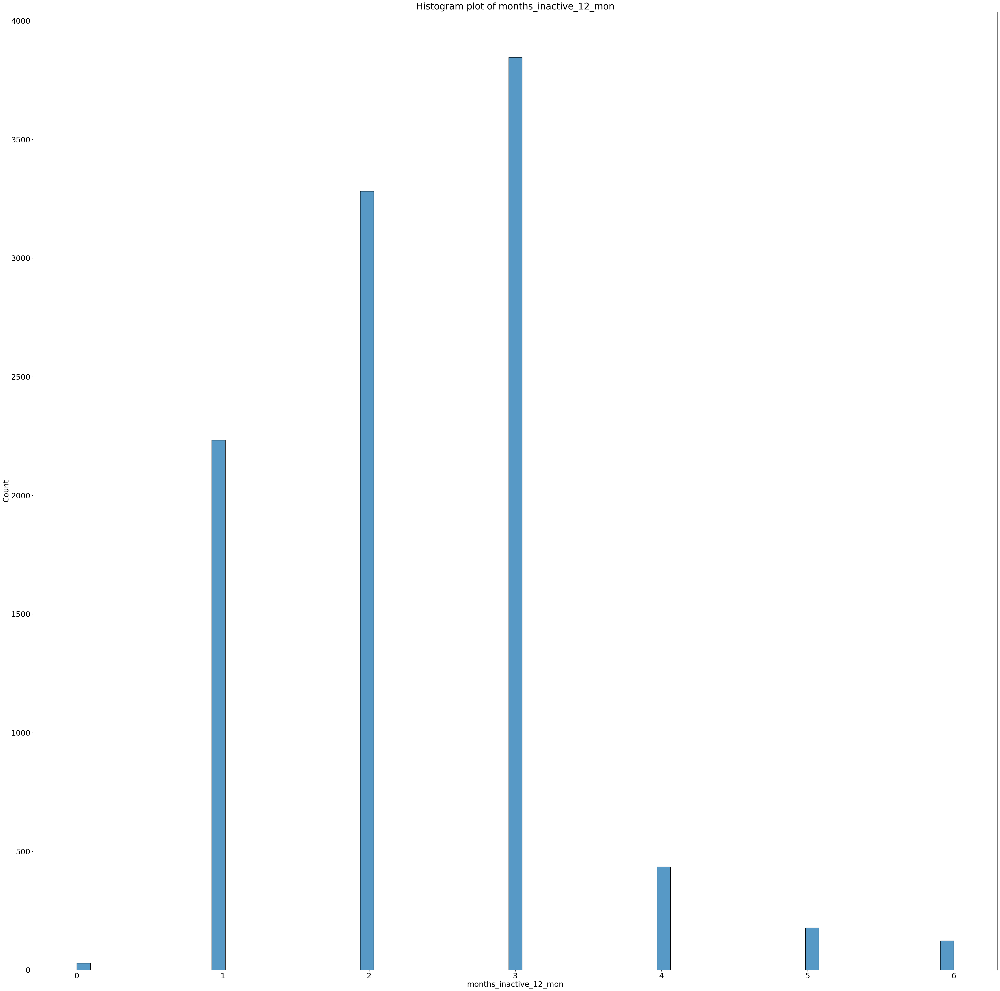

In [44]:
plothist('months_inactive_12_mon')

Based on the histrogram above, we noted that the number of months inactive in a year is from 0 to 6, with 3 months being the highest number of customers.

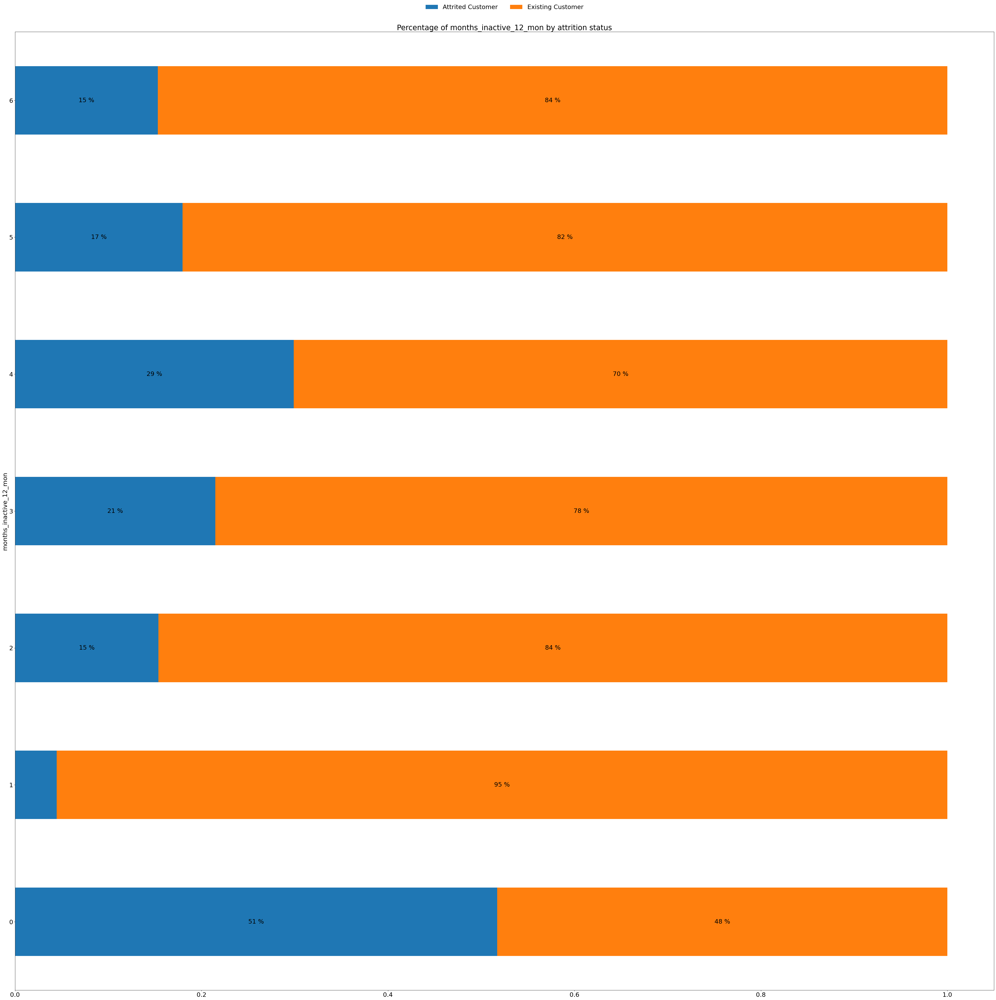

In [45]:
plotbyattrition_discrete_bar('months_inactive_12_mon')

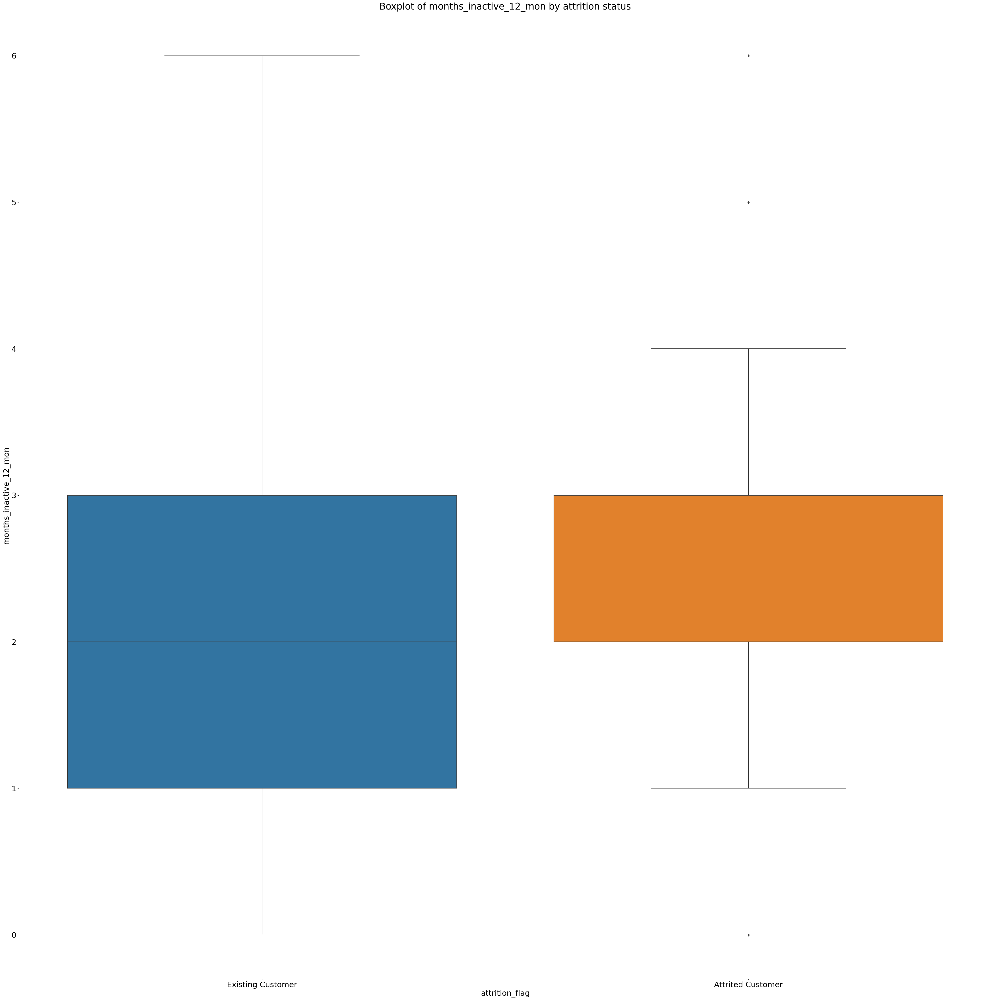

In [46]:
plotbyattrition_discrete_box('months_inactive_12_mon')

#### Number of contacts in 12 months

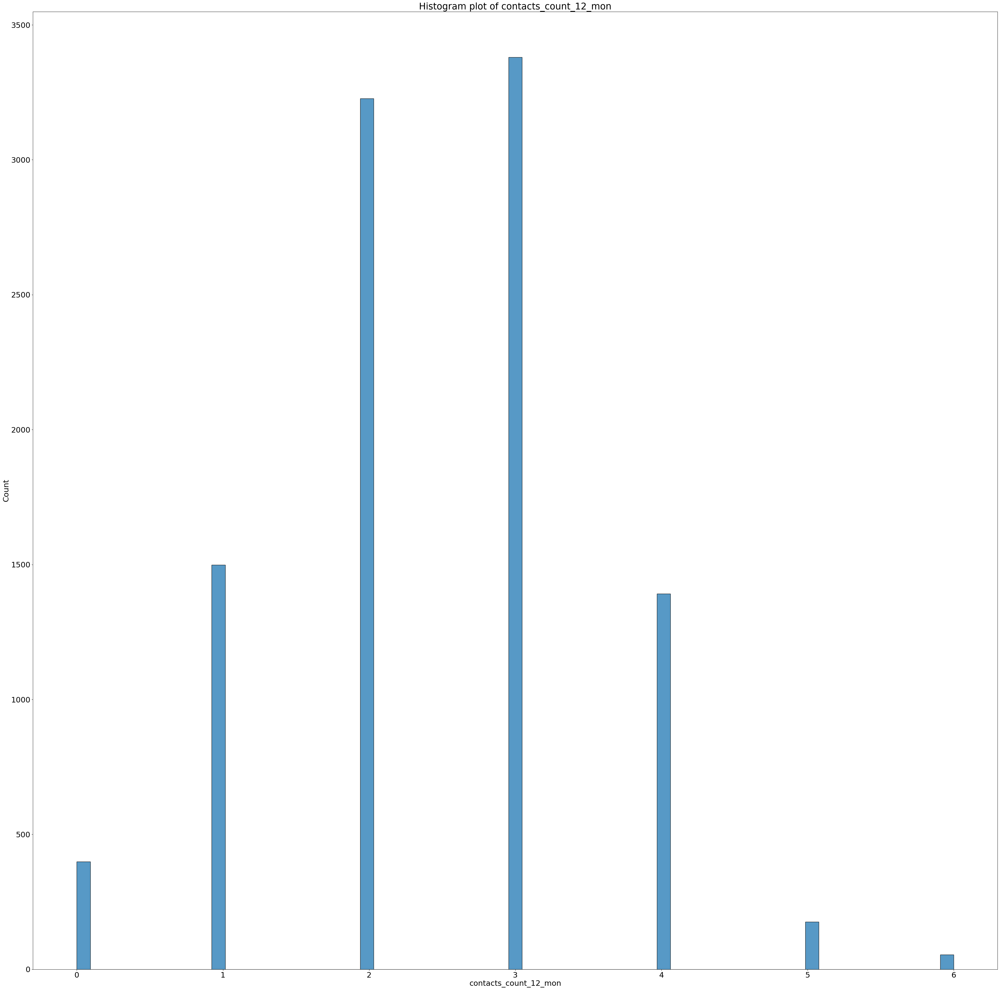

In [47]:
plothist('contacts_count_12_mon')

Based on the histrogram above, the number of contacts in the last 12 months ranges from 0 to 6, with 3 contacts being the highest number of customers.

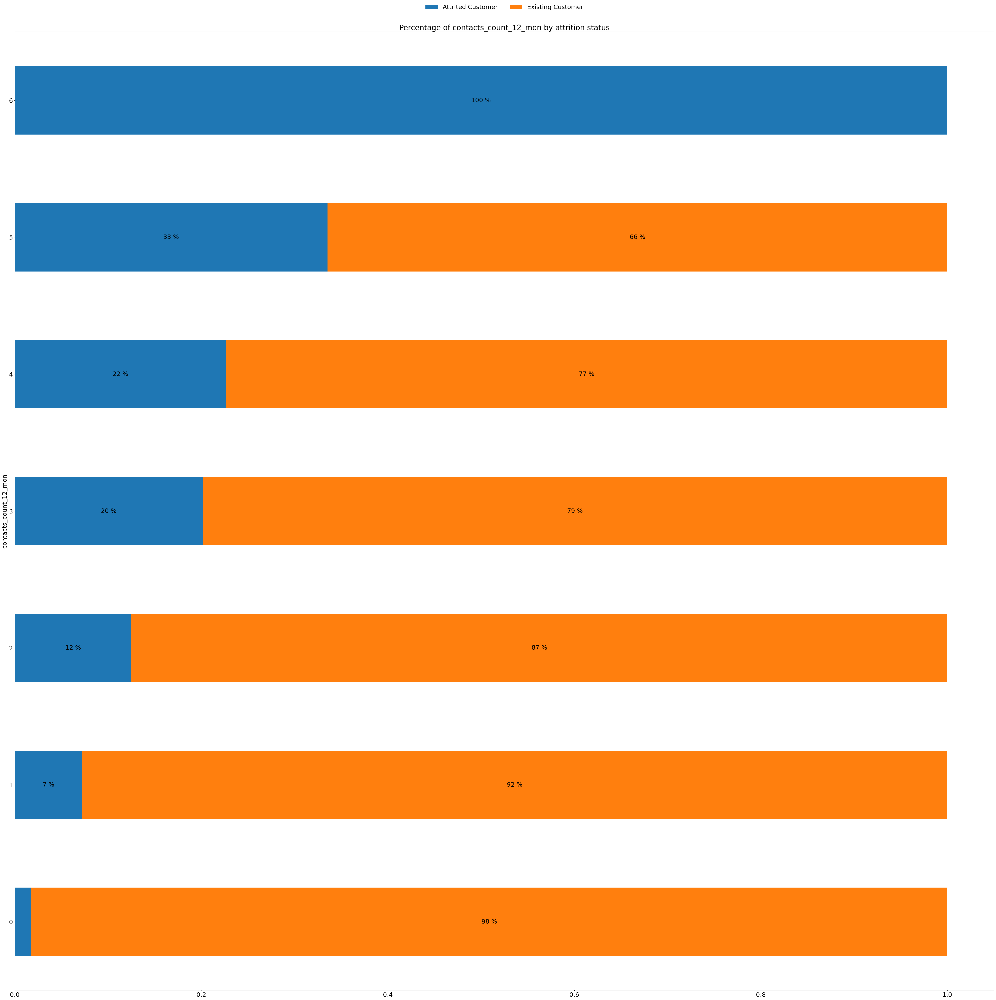

In [48]:
plotbyattrition_discrete_bar('contacts_count_12_mon')

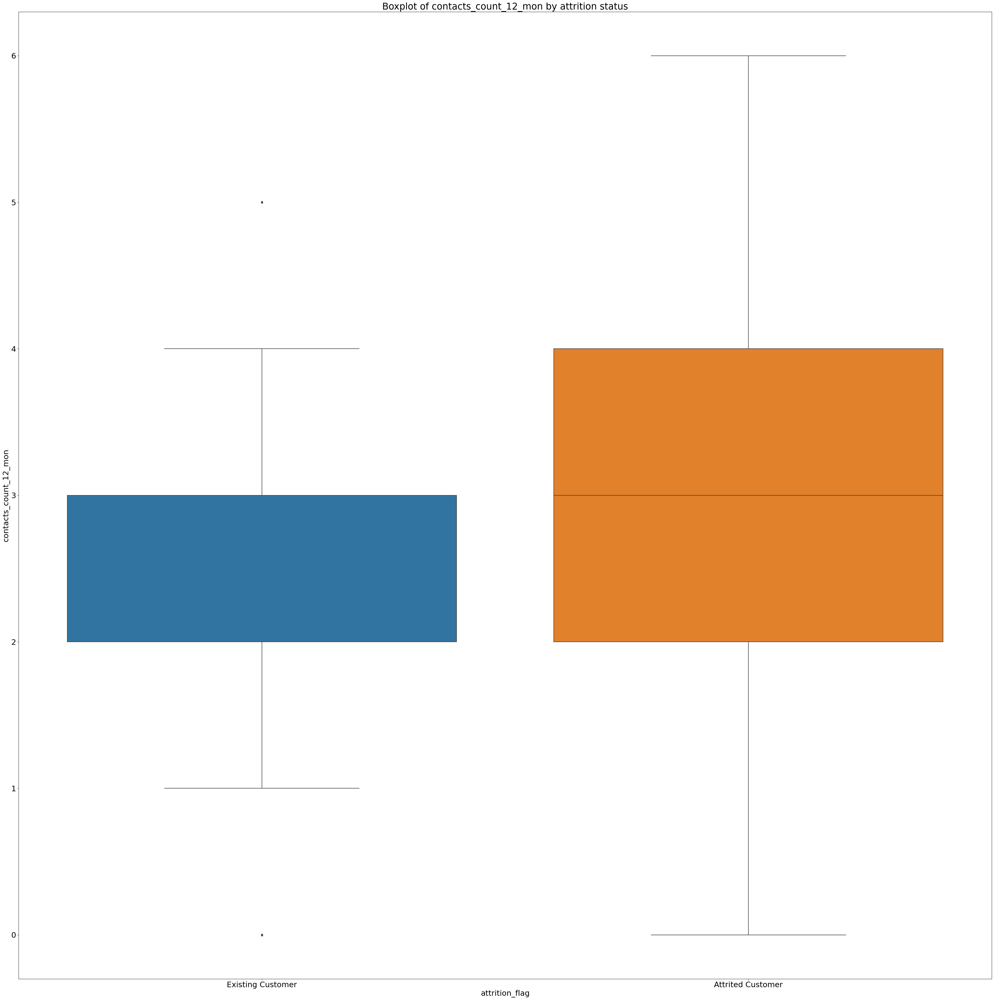

In [49]:
plotbyattrition_discrete_box('contacts_count_12_mon')

#### Credit Limit

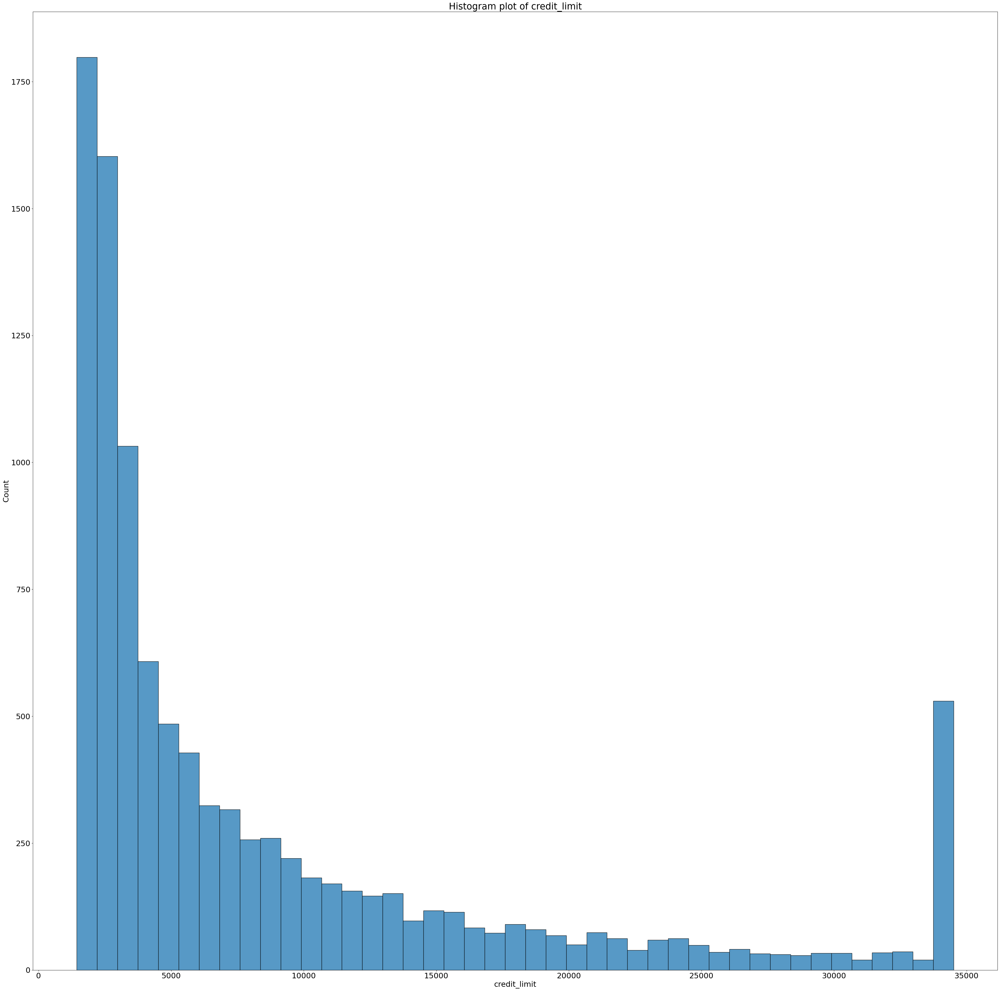

In [50]:
plothist('credit_limit')

Based on the histogram above, we noted that most of the customers have a credit limit of around 1000 to 5000. We also noted that there are quite a fair number of customers with a credit limit of above 30000.

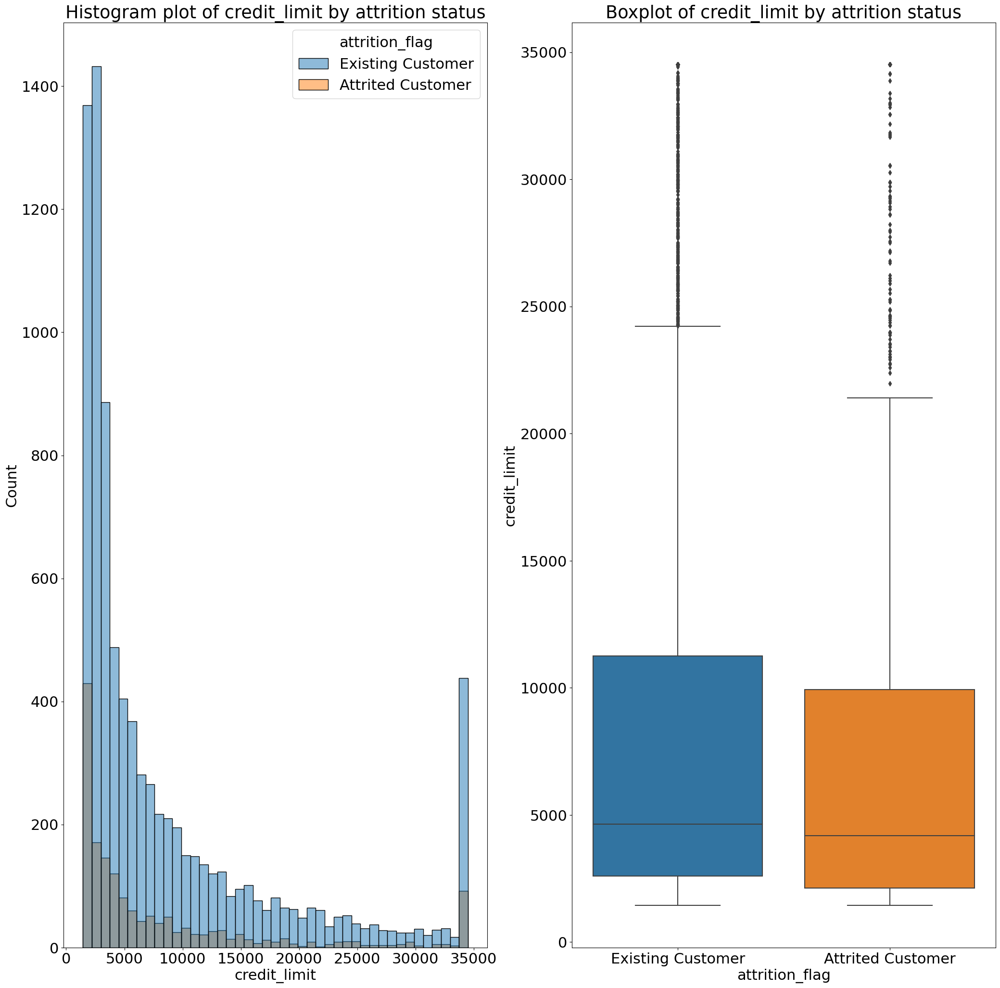

In [51]:
plotbyattrition_continuous('credit_limit')

#### Total Revolving Balance

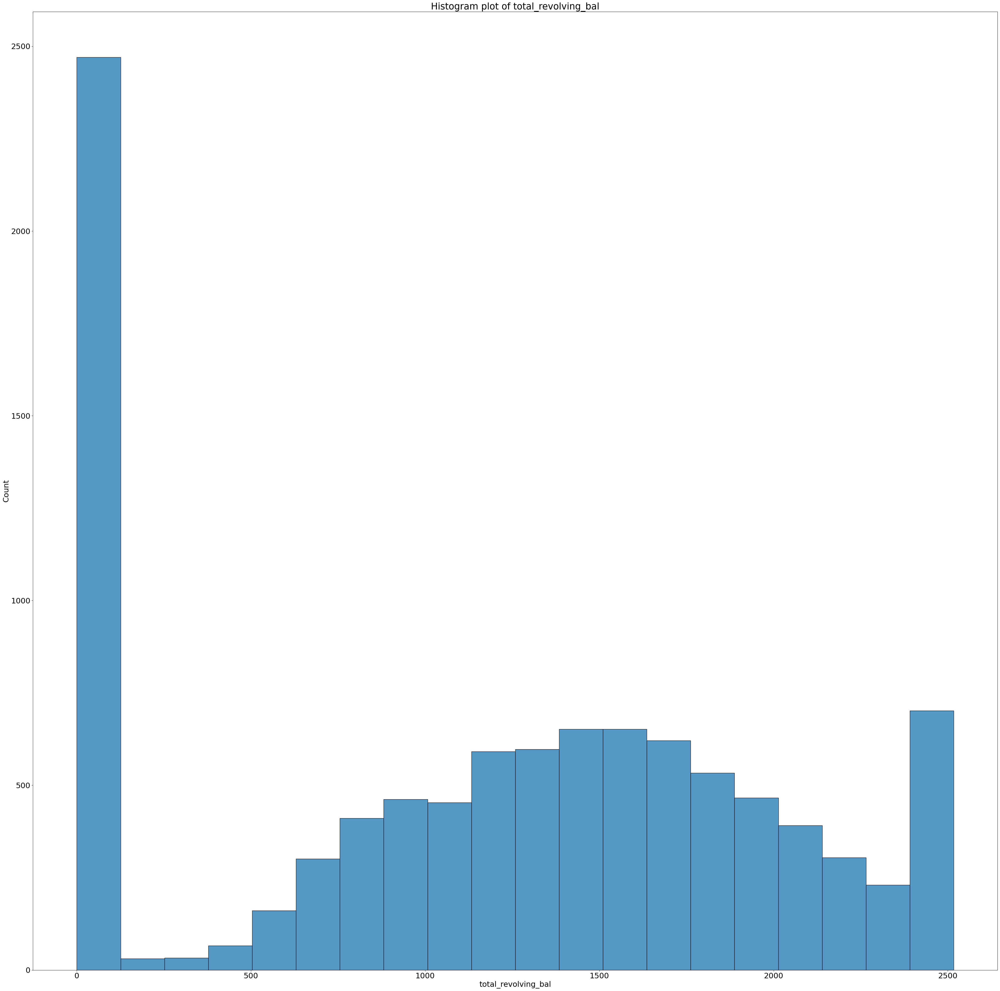

In [52]:
plothist('total_revolving_bal')

Based on the histogram above, we noted that the total revolving balance ranges from 0 to 2500 and the highest count of customers are in the range of 0 to 200.

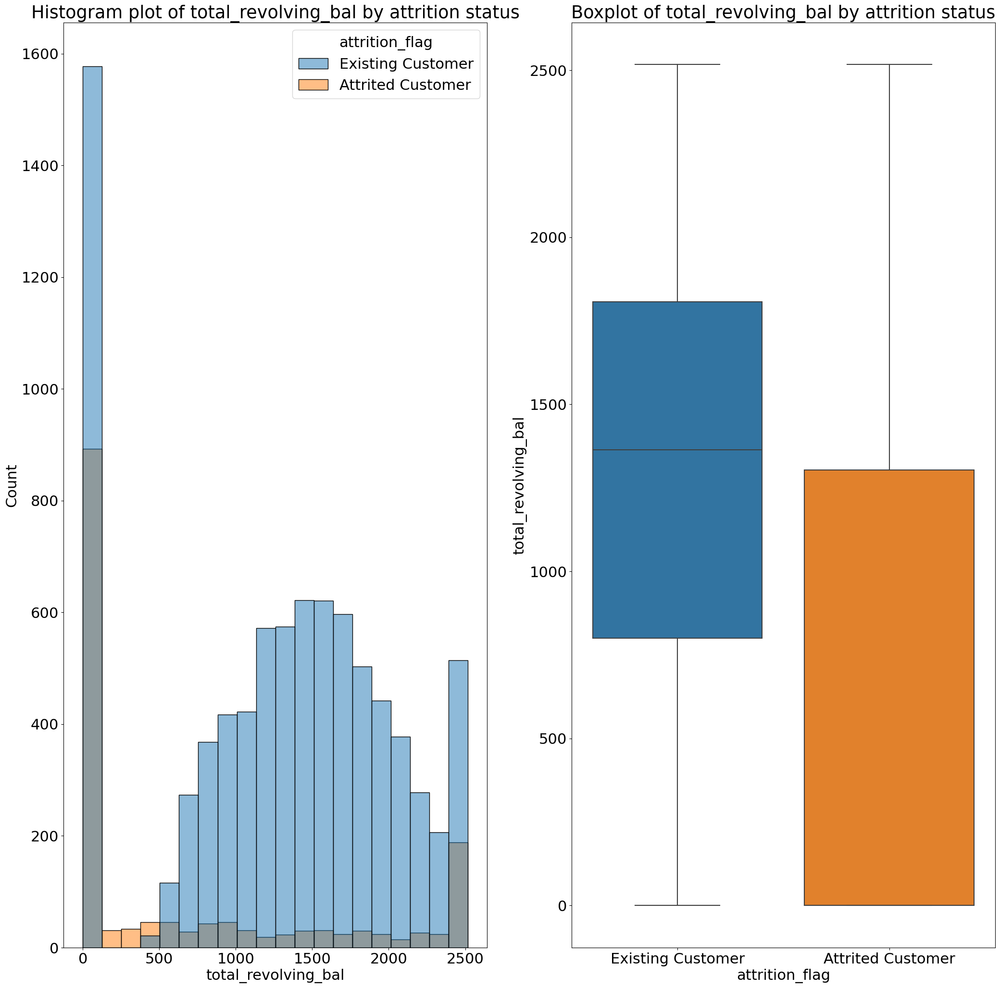

In [53]:
plotbyattrition_continuous('total_revolving_bal')

#### Open to Buy Credit Line

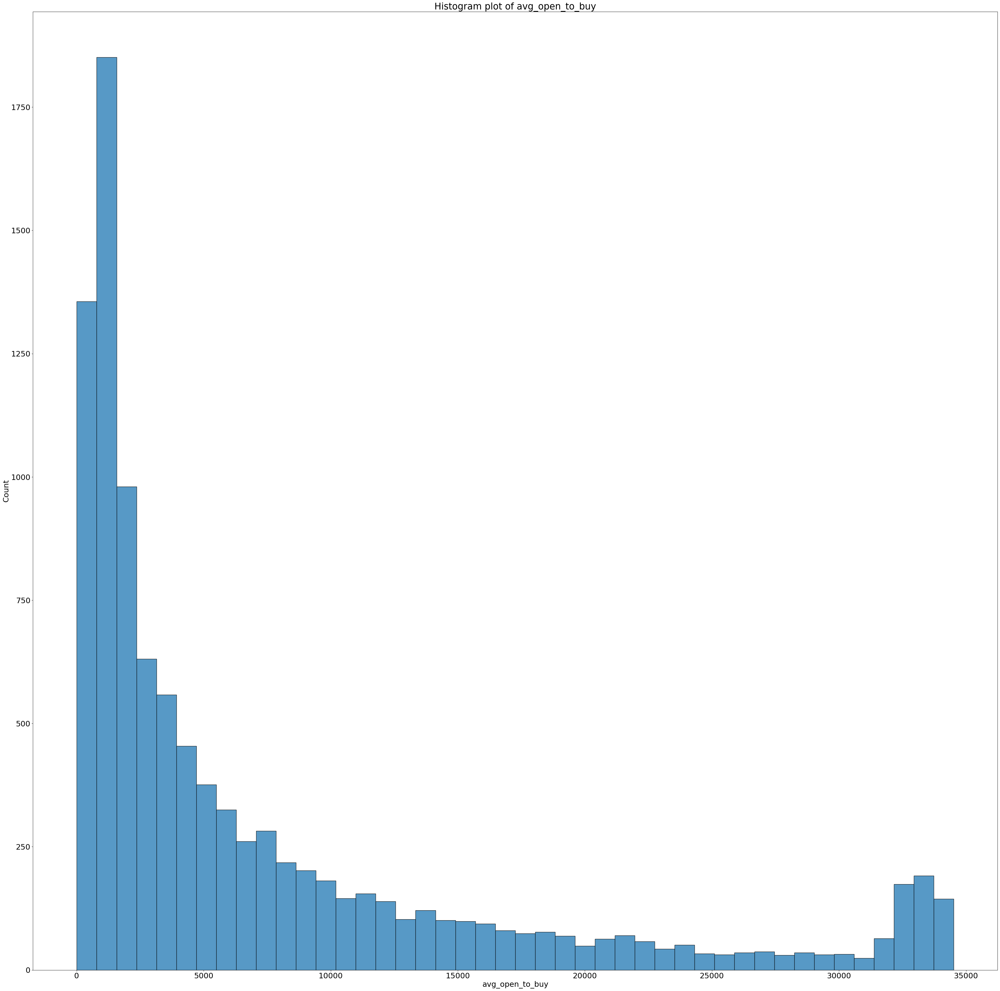

In [54]:
plothist('avg_open_to_buy')

Based on the histrogram above, we noted that the Open to Buy Credit Line (Average of last 12 months) ranges from 0 to 35000, with most of the customers between the range of 0 to 5000.

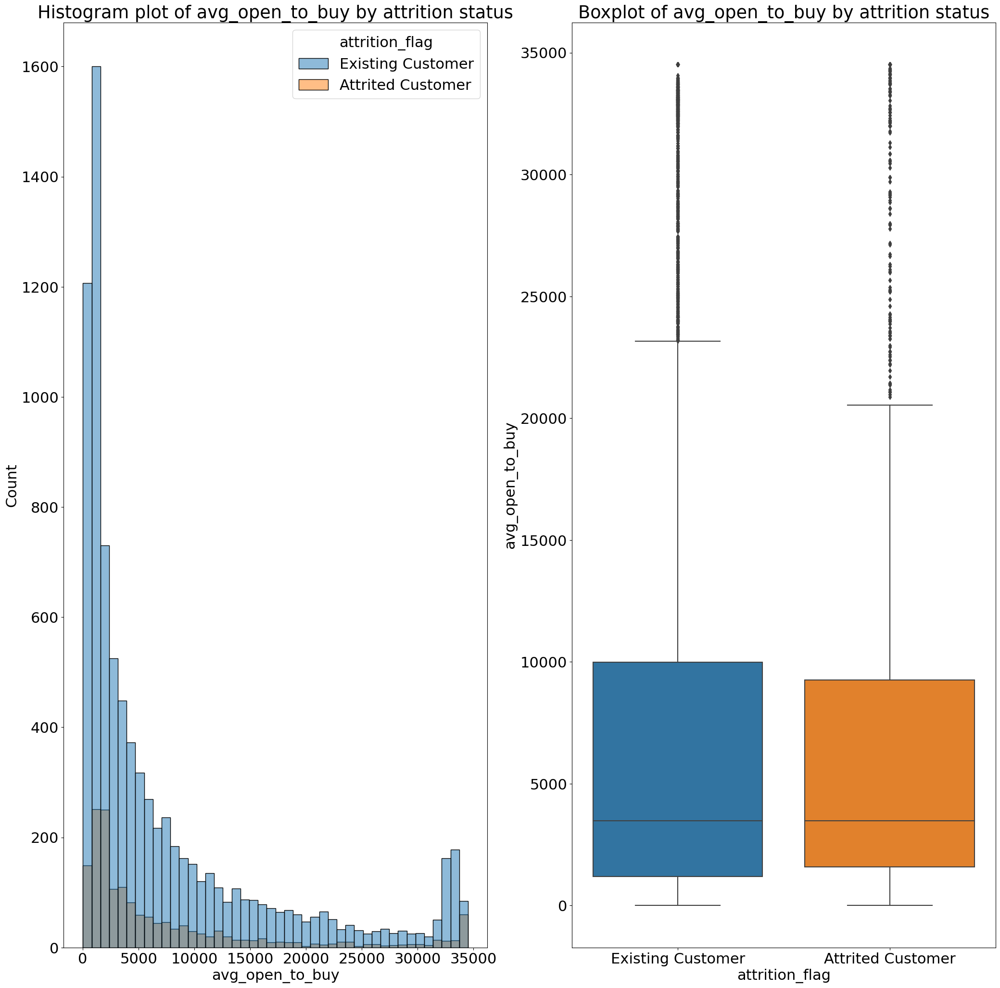

In [55]:
plotbyattrition_continuous('avg_open_to_buy')

#### Change in Transaction Amount (Q4 over Q1)

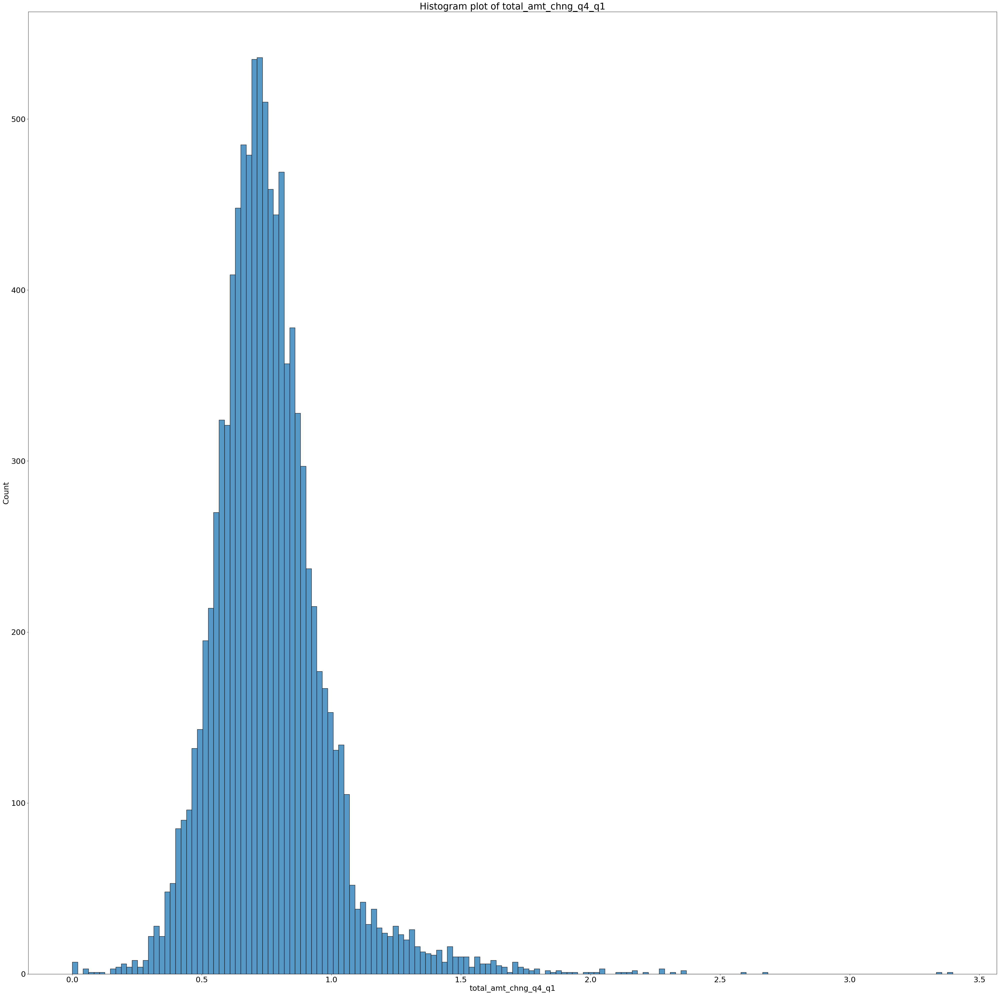

In [56]:
plothist('total_amt_chng_q4_q1')

Based on the histogram above, we noted that the total amount change (Q4 over Q1) ranges from 0.0 to 3.5. Most of the customers fall within the range of 0.5 to 1.

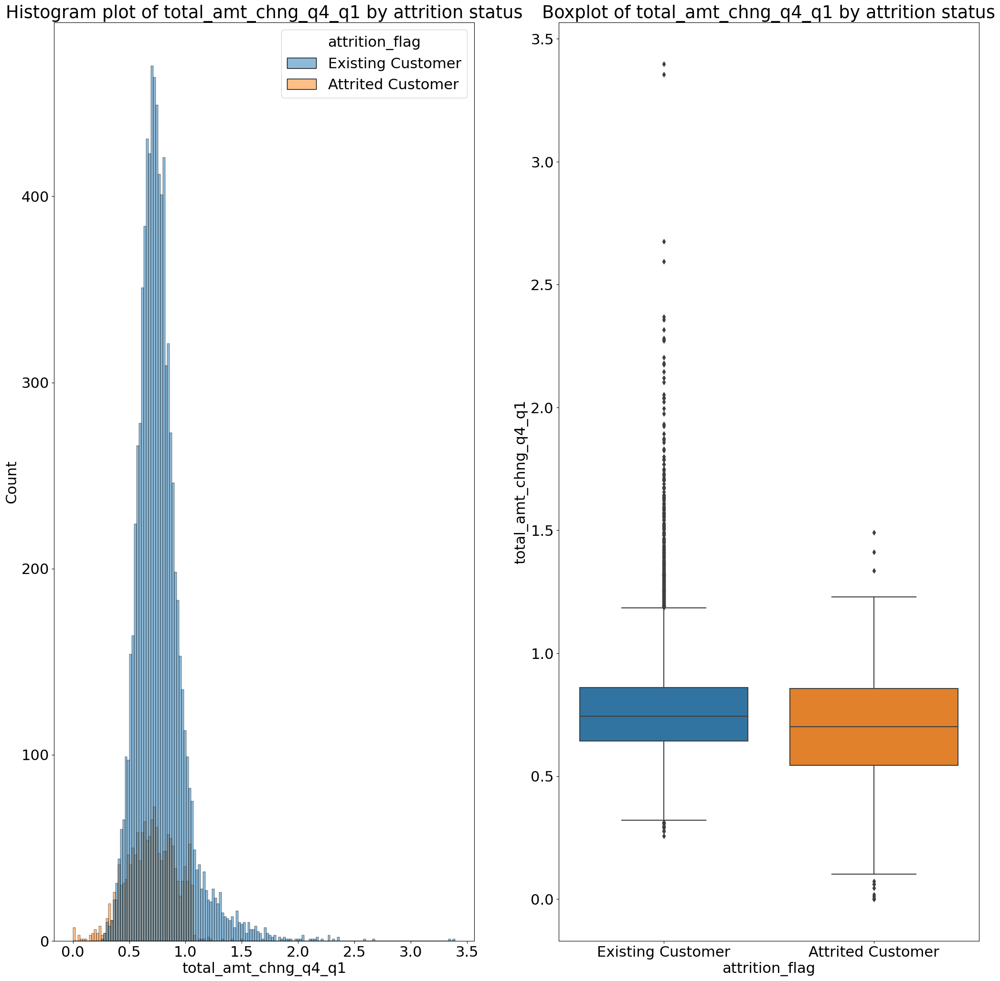

In [57]:
plotbyattrition_continuous('total_amt_chng_q4_q1')

#### Total Transaction Amount (Last 12 months)

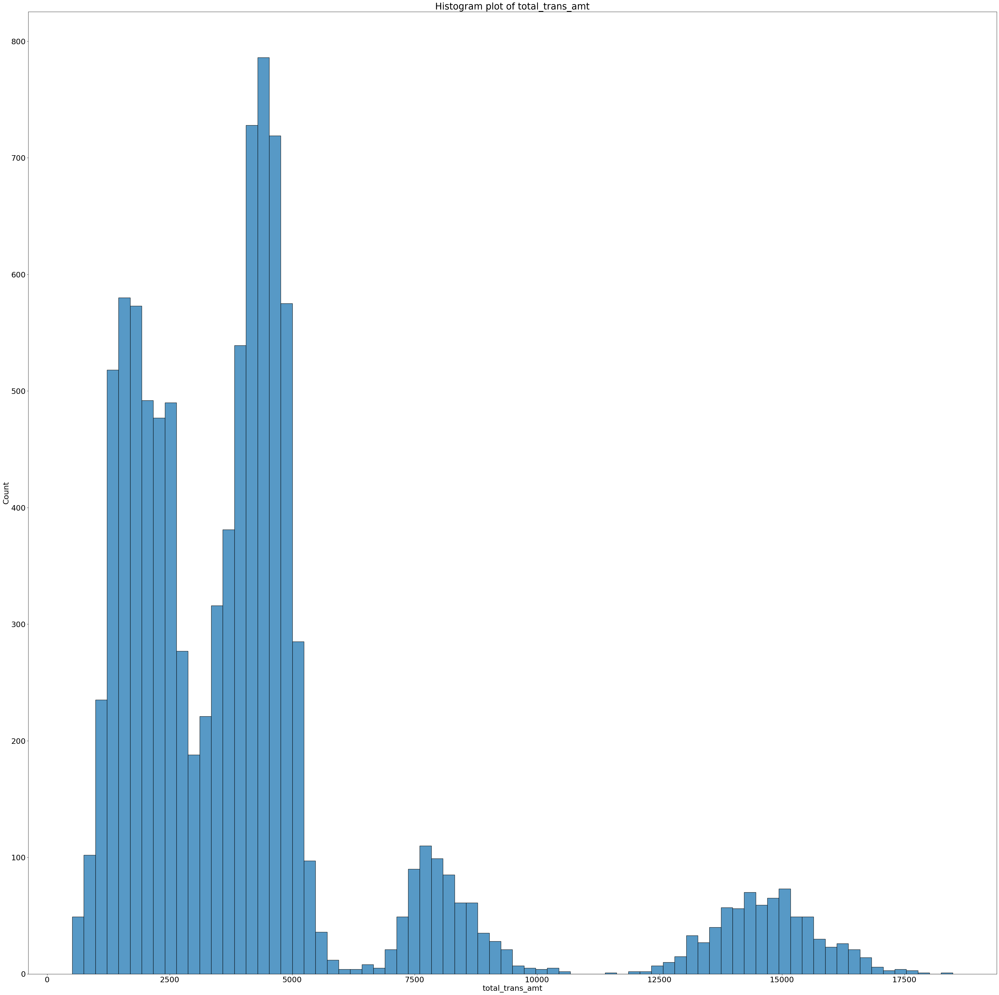

In [58]:
plothist('total_trans_amt')

Based on the histogram above, we noted that the total transaction amount for most of the customers are within the range of 1000 to 5000.

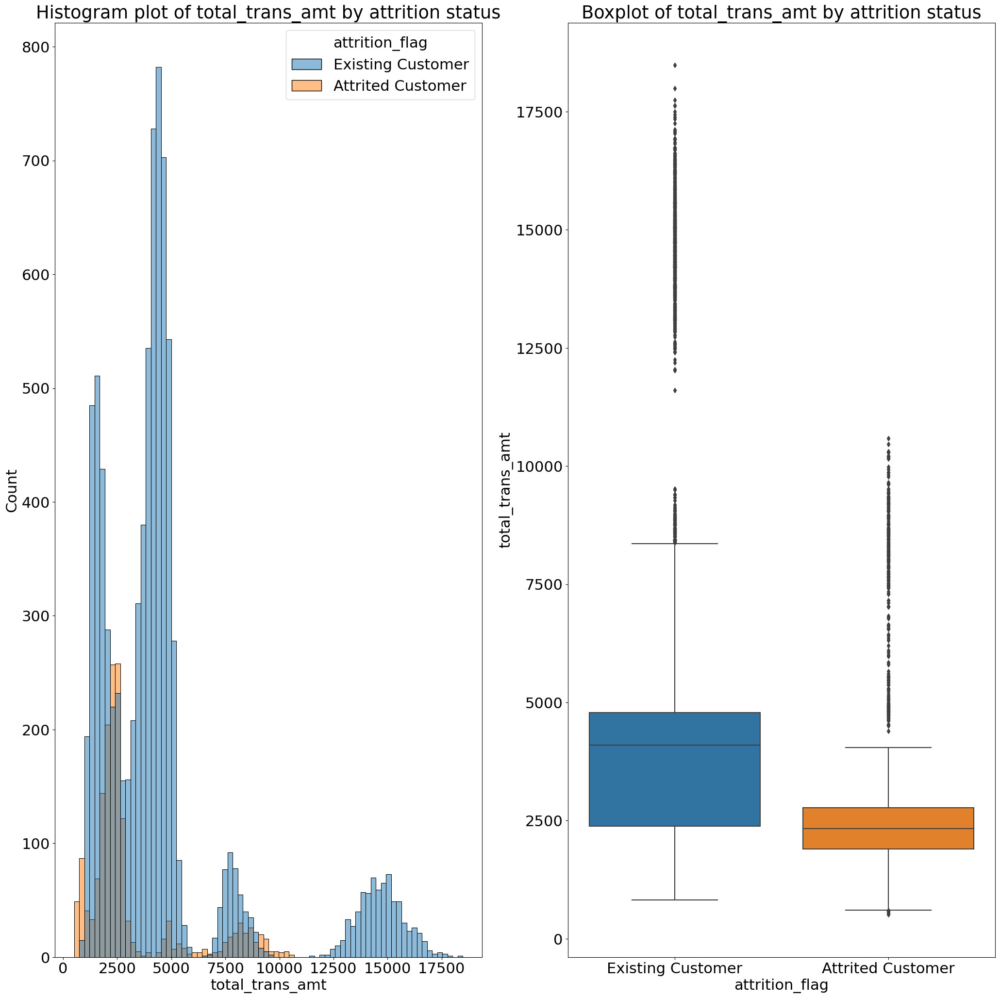

In [59]:
plotbyattrition_continuous('total_trans_amt')

#### Total Transaction Count (Last 12 months)

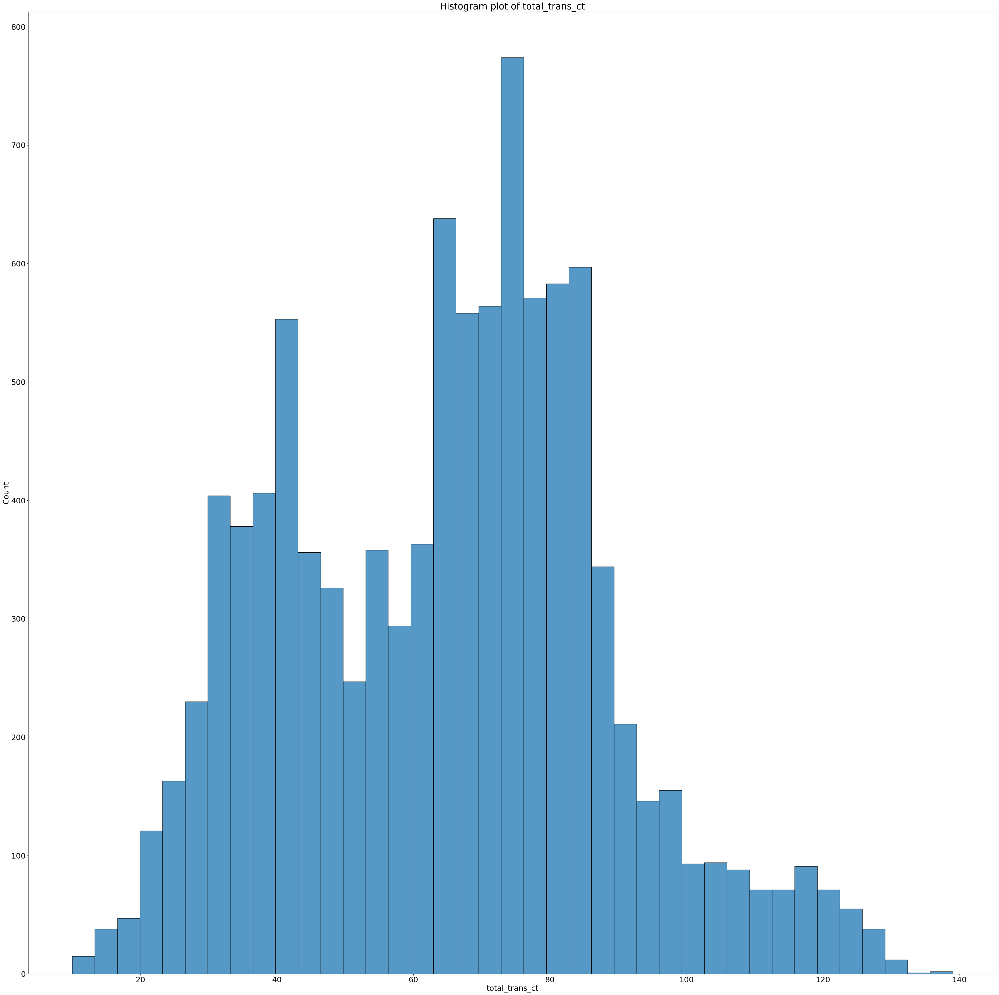

In [60]:
plothist('total_trans_ct')

Based on the histogram above, we noted that the total transaction count for most of the customers is within the range of 30 to 90. 

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and pos

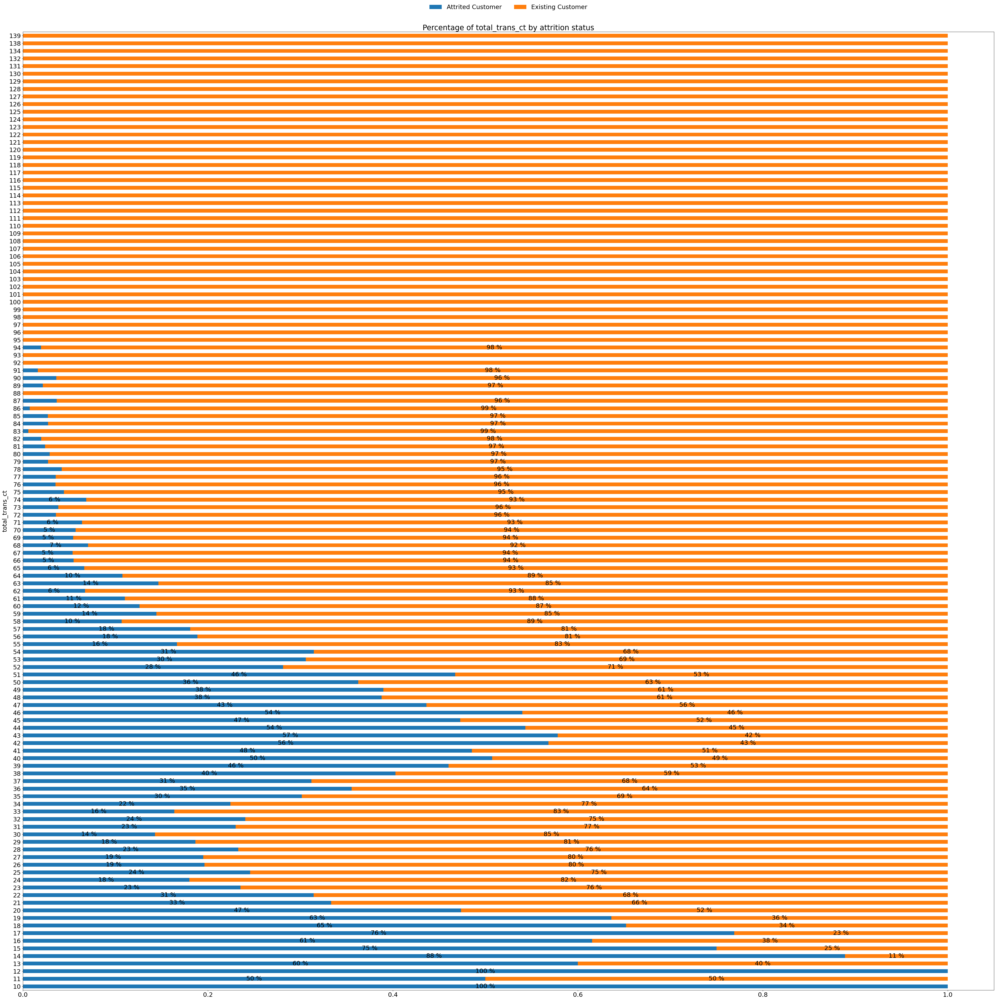

In [61]:
plotbyattrition_discrete_bar('total_trans_ct')

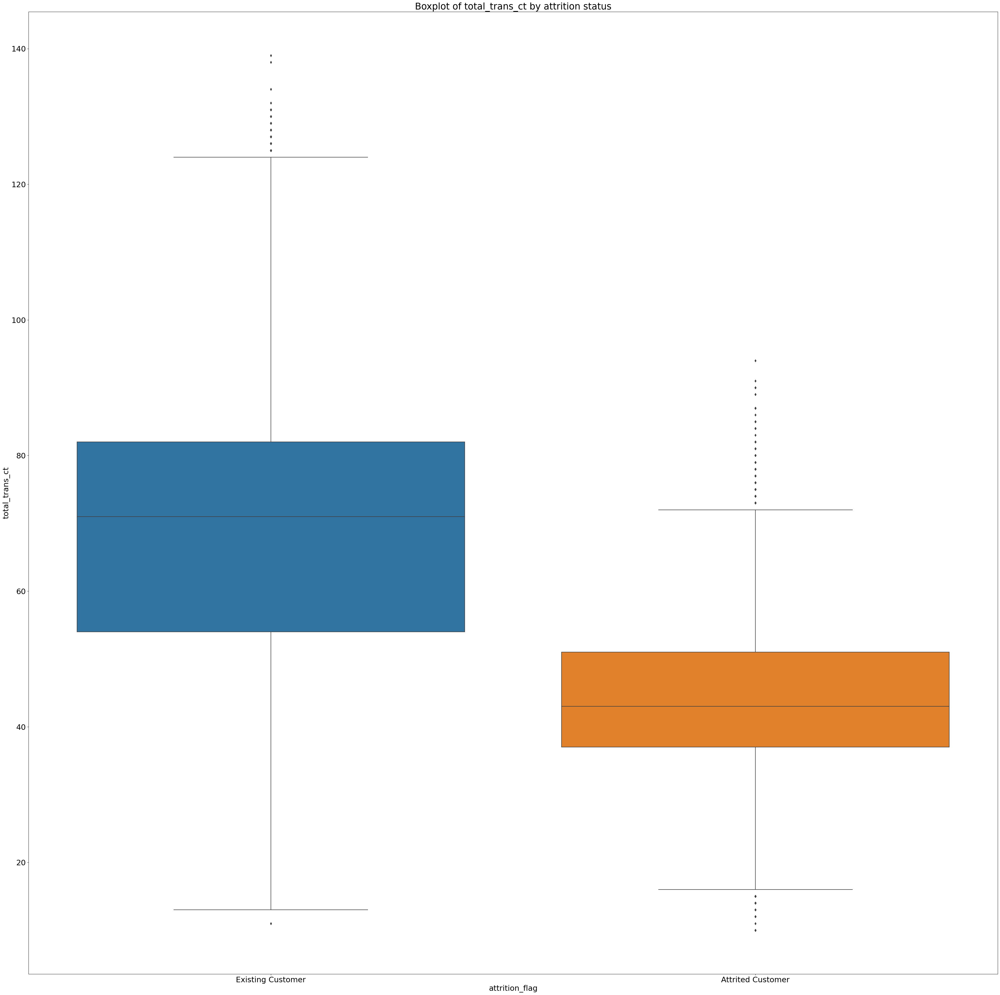

In [62]:
plotbyattrition_discrete_box('total_trans_ct')

#### Change in Transaction Count (Q4 over Q1)

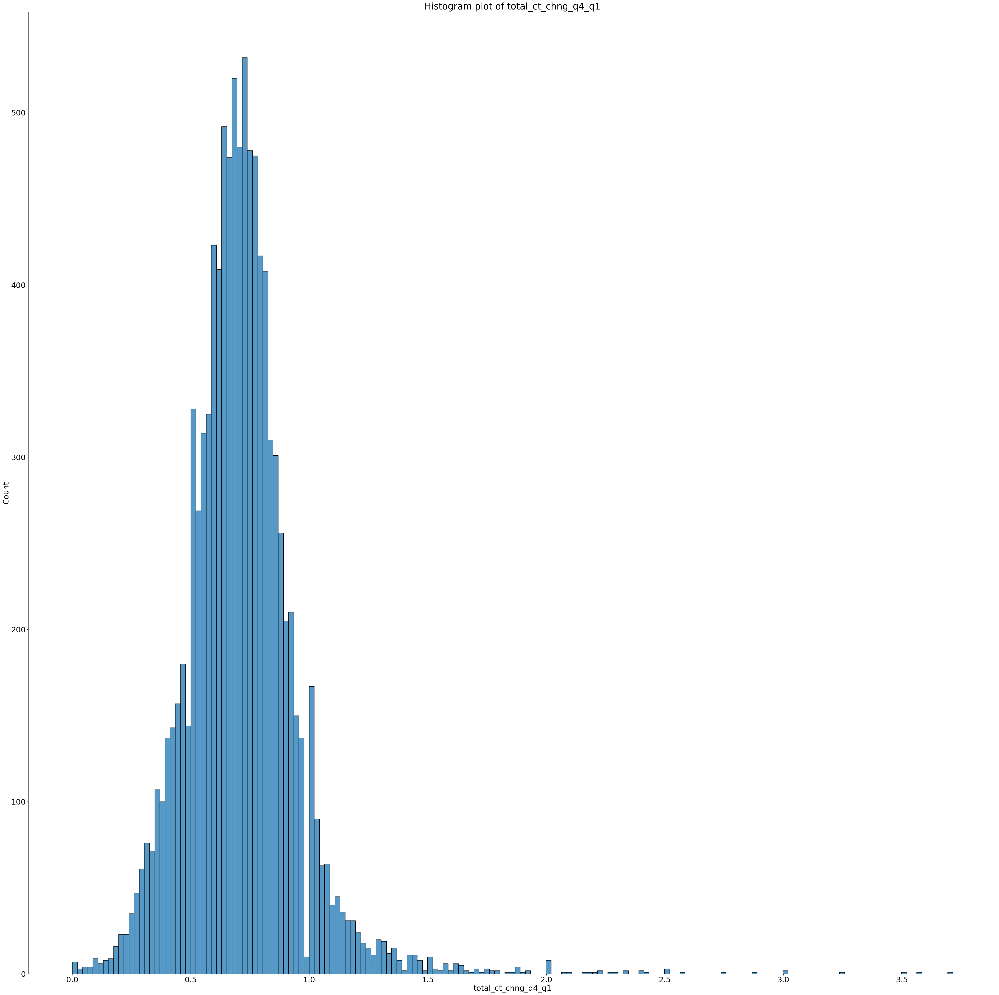

In [63]:
plothist('total_ct_chng_q4_q1')

Based on the histogram above, we noted that the total count change (Q4 over Q1) for most of the customers is within the range of 0.5 to 1. 

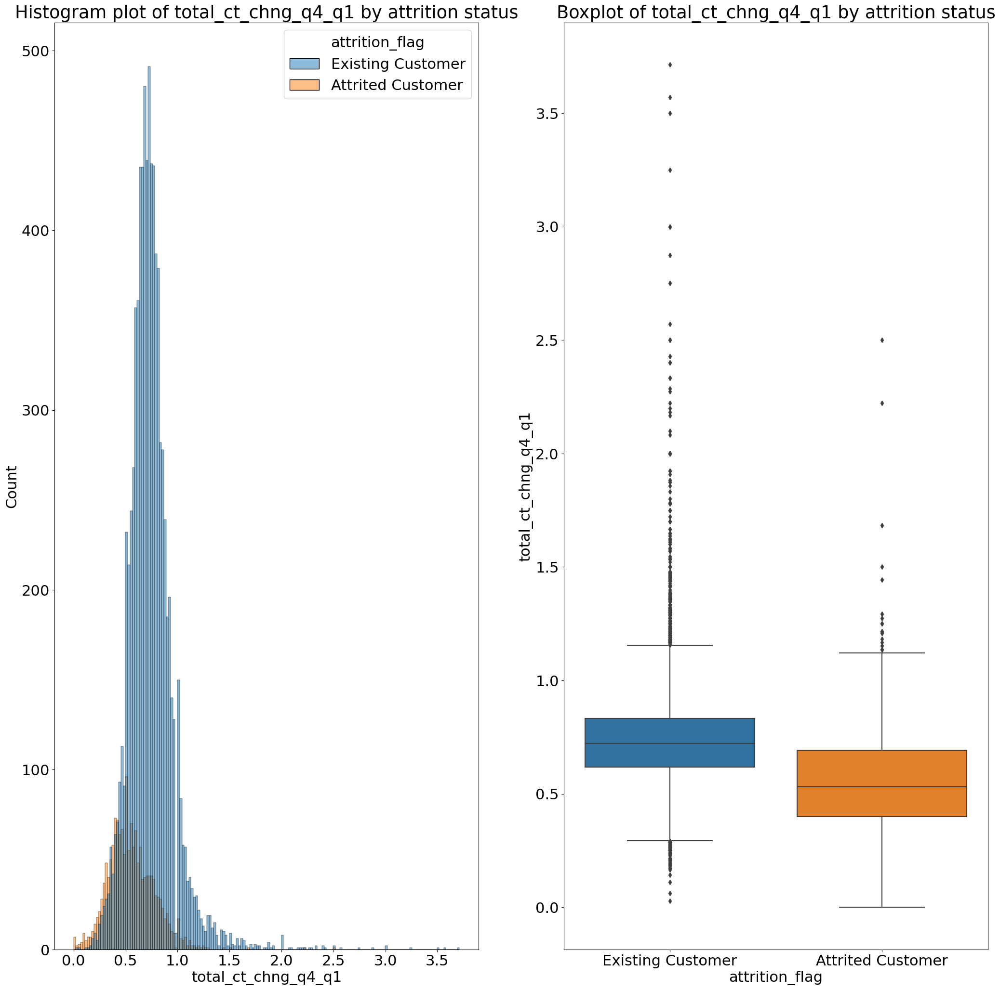

In [64]:
plotbyattrition_continuous('total_ct_chng_q4_q1')

#### Average utilization card ratio

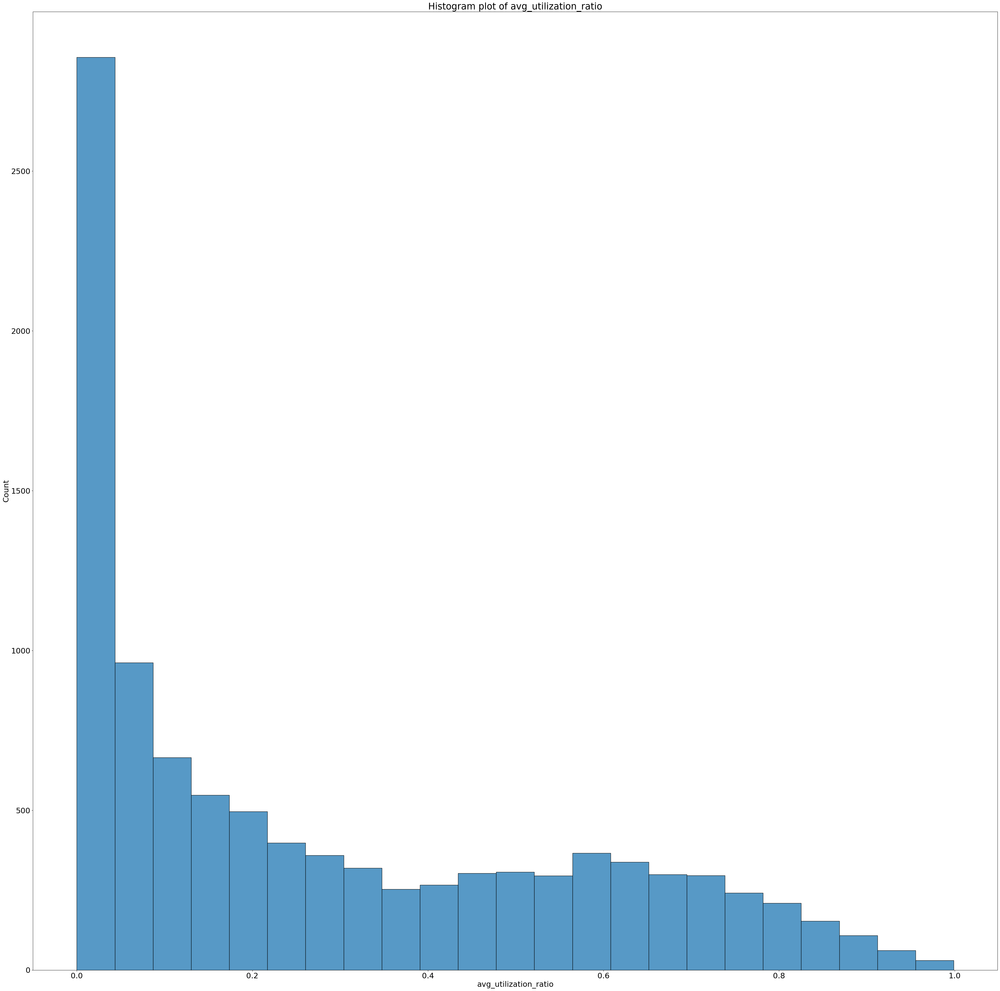

In [65]:
plothist('avg_utilization_ratio')

Based on the histogram above, we noted that the average utilization ratio for most of the customers is within the range of 0.0 to 0.2.

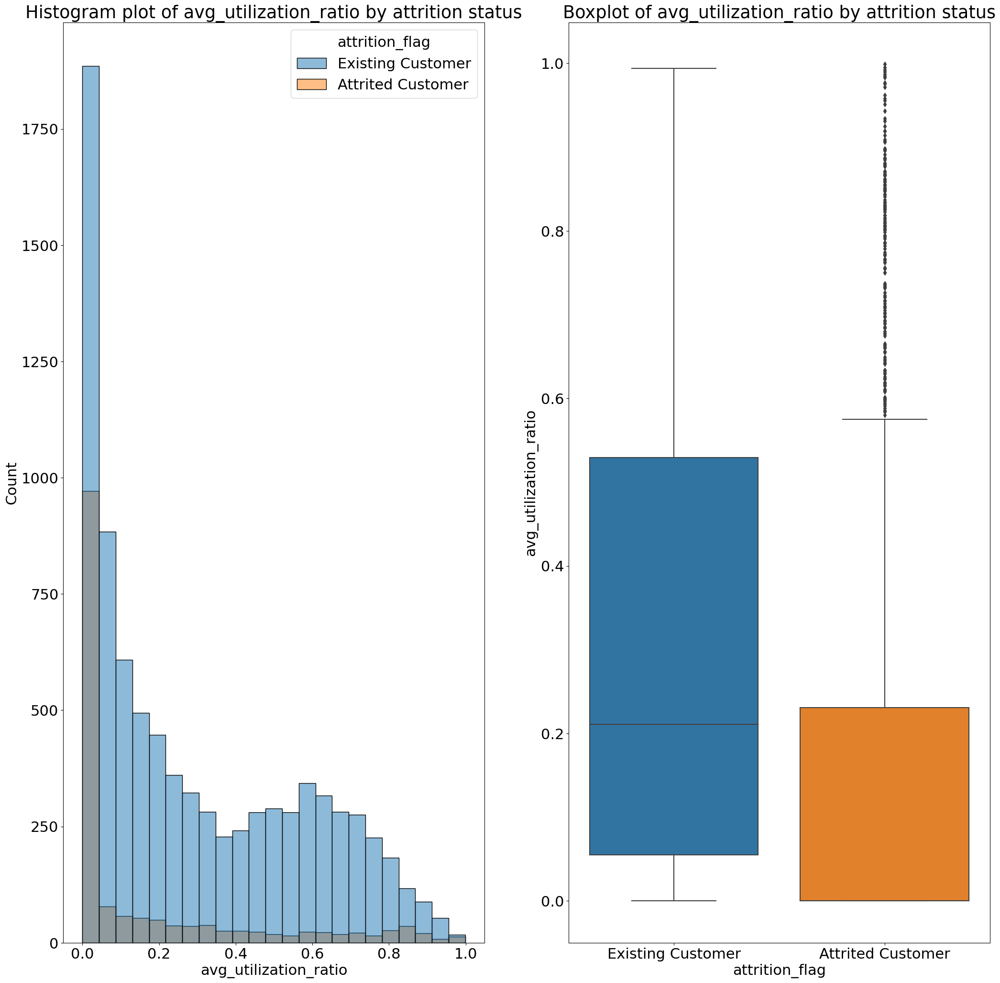

In [66]:
plotbyattrition_continuous('avg_utilization_ratio')

Based on histogram plots, bar plots and boxplots which were generated above for all features plotted by attrition status, it seems that the following features might have an influence on the attrition status of a customer.
- Total relationship count
- Months inactive in the past 12 months
- Contacts count in the past 12 months
- Total revolving balance
- Total amount change (Q4 over Q1)
- Total transaction amount 
- Total transaction count
- Transaction count change (Q4 over Q1)
- Average card utilization ratio

However, we would like to examine and verify it further by conducting the statistical significance test on numberical variables. 

#### Statistical significance test on numerical variables

In [67]:
# defining function to run statistical significance test on numerical variables
def num_stat_sig_test(df,col):
    # defining function for normality + statistical significance check
    # Step 1: normality test
    stat, p_value = stats.normaltest(df[col].values)
    
    # Step 2: filter series    
    existing = df[df['attrition_flag']=='Existing Customer'][col].values
    attrited = df[df['attrition_flag']=='Attrited Customer'][col].values
    
    # Step 3: determining appropriate statistical significance test based on normality
    if p_value>0.01:
        distribution = 'normal distribution'
        test = 'Anova test'
        stat, p_value = stats.f_oneway(existing, attrited)
    
    else:
        distribution = 'non-normal distribution'
        test = 'KS test'
        stat, p_value = stats.ks_2samp(existing, attrited)
    
    # Step 4: conclude on statistical significance
    if p_value>0.05:
        sig = 'not statistically significant'
    else:
        sig = 'statistically significant'

    print(f'{col} has {distribution}: running {test}. result: {sig}')
    return p_value

In [68]:
results_dict = {col:num_stat_sig_test(combined_data,col) for col in numerical_features}

customer_age has non-normal distribution: running KS test. result: not statistically significant
dependent_count has non-normal distribution: running KS test. result: not statistically significant
months_on_book has non-normal distribution: running KS test. result: not statistically significant
total_relationship_count has non-normal distribution: running KS test. result: statistically significant
months_inactive_12_mon has non-normal distribution: running KS test. result: statistically significant
contacts_count_12_mon has normal distribution: running Anova test. result: statistically significant
credit_limit has non-normal distribution: running KS test. result: statistically significant
total_revolving_bal has non-normal distribution: running KS test. result: statistically significant
avg_open_to_buy has non-normal distribution: running KS test. result: statistically significant
total_amt_chng_q4_q1 has non-normal distribution: running KS test. result: statistically significant
total

Based on the results of the statistical tests, there were 3 variables (customer age, dependent count and months on book) which were not statistically significant. Therefore, we will drop these 3 variables and not include them in our modeling.

In [69]:
del numerical_features[0]

In [70]:
numerical_features

['dependent_count',
 'months_on_book',
 'total_relationship_count',
 'months_inactive_12_mon',
 'contacts_count_12_mon',
 'credit_limit',
 'total_revolving_bal',
 'avg_open_to_buy',
 'total_amt_chng_q4_q1',
 'total_trans_amt',
 'total_trans_ct',
 'total_ct_chng_q4_q1',
 'avg_utilization_ratio']

In [71]:
del numerical_features[0]

In [72]:
numerical_features

['months_on_book',
 'total_relationship_count',
 'months_inactive_12_mon',
 'contacts_count_12_mon',
 'credit_limit',
 'total_revolving_bal',
 'avg_open_to_buy',
 'total_amt_chng_q4_q1',
 'total_trans_amt',
 'total_trans_ct',
 'total_ct_chng_q4_q1',
 'avg_utilization_ratio']

In [73]:
del numerical_features[0]

In [74]:
numerical_features

['total_relationship_count',
 'months_inactive_12_mon',
 'contacts_count_12_mon',
 'credit_limit',
 'total_revolving_bal',
 'avg_open_to_buy',
 'total_amt_chng_q4_q1',
 'total_trans_amt',
 'total_trans_ct',
 'total_ct_chng_q4_q1',
 'avg_utilization_ratio']

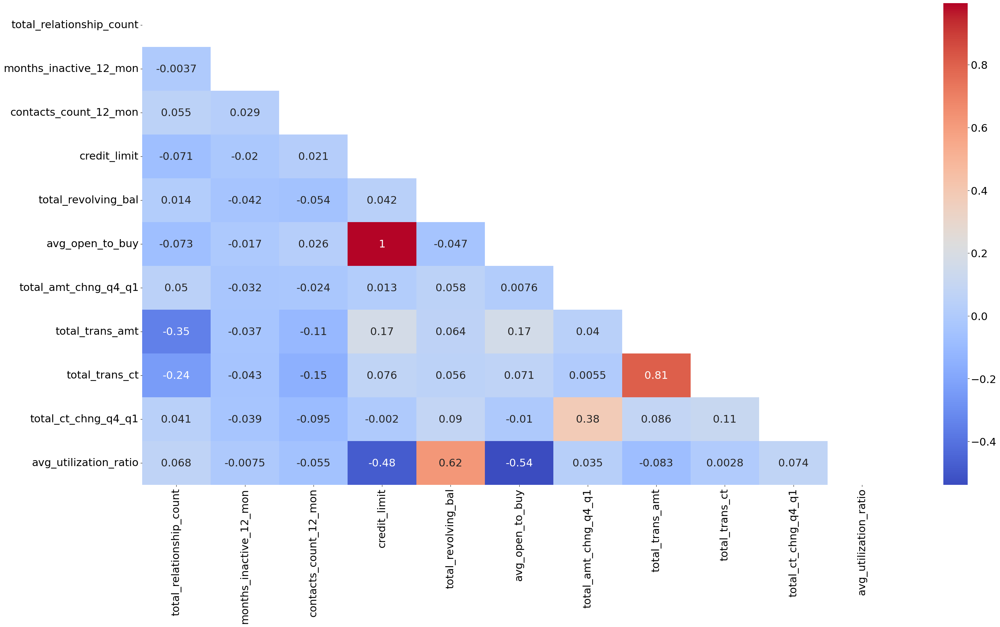

In [75]:
# To investigate on the correlation between the numeric variables 
plt.figure(figsize=(35, 18))
mask = np.zeros_like(combined_data[numerical_features].corr())
mask[np.triu_indices_from(mask)] = True
sns.heatmap(combined_data[numerical_features].corr(), annot=True, cmap='coolwarm', mask = mask);

Based on outside research ([Link](https://www.andrews.edu/~calkins/math/edrm611/edrm05.htm)), correlation coefficients values between the range of 0.9 and 1.0 can be considered very highly correlated. Therefore, we will use the threshold of 0.9 to filter out features that are highly correlated. Based on the correlation coefficient heatmap, we can see that credit limit and average open to buy features are perfectly correlated (correlation coefficient of 1). We will keep the credit limit feature and remove the average open to buy feature for our modeling.

In [76]:
del numerical_features[5]

#### Numerical features to be used for modeling

In [77]:
numerical_features

['total_relationship_count',
 'months_inactive_12_mon',
 'contacts_count_12_mon',
 'credit_limit',
 'total_revolving_bal',
 'total_amt_chng_q4_q1',
 'total_trans_amt',
 'total_trans_ct',
 'total_ct_chng_q4_q1',
 'avg_utilization_ratio']

### Categorical features

In [78]:
categorical_features = [feature for feature in combined_data.columns if combined_data[feature].dtypes == 'object']

In [79]:
categorical_features

['attrition_flag',
 'gender',
 'education_level',
 'marital_status',
 'income_category',
 'card_category']

In [80]:
def plotcount(feature):
    plt.rcParams["figure.figsize"] = [18, 10]
    plt.rcParams.update({'font.size': 22})
    sns.countplot(data=combined_data,x=feature).set(title= f"Countplot of {feature}")

In [81]:
def plotbyattrition_categorical_bar(feature):
    plt.rcParams["figure.figsize"] = [18, 15]
    plt.rcParams.update({'font.size': 22})
    x_var, y_var = feature, "attrition_flag"
    combined_data_grouped = combined_data.groupby(x_var)[y_var].value_counts(normalize=True).unstack(y_var)
    combined_data_grouped.plot.bar(stacked=True)
    plt.legend(loc="upper center",borderaxespad=0,frameon=False,ncol=3)
    
    for ix, row in combined_data_grouped.reset_index(drop=True).iterrows():
        cumulative = 0
        for element in row:
            if element > 0.1:
                plt.text(
                    ix,
                    cumulative + element / 2,
                    f"{int(element * 100)} %",
                    va="center",
                    ha="center",
                )
            cumulative += element
    plt.tight_layout()
    plt.title(f"Percentage of {feature} by attrition status")

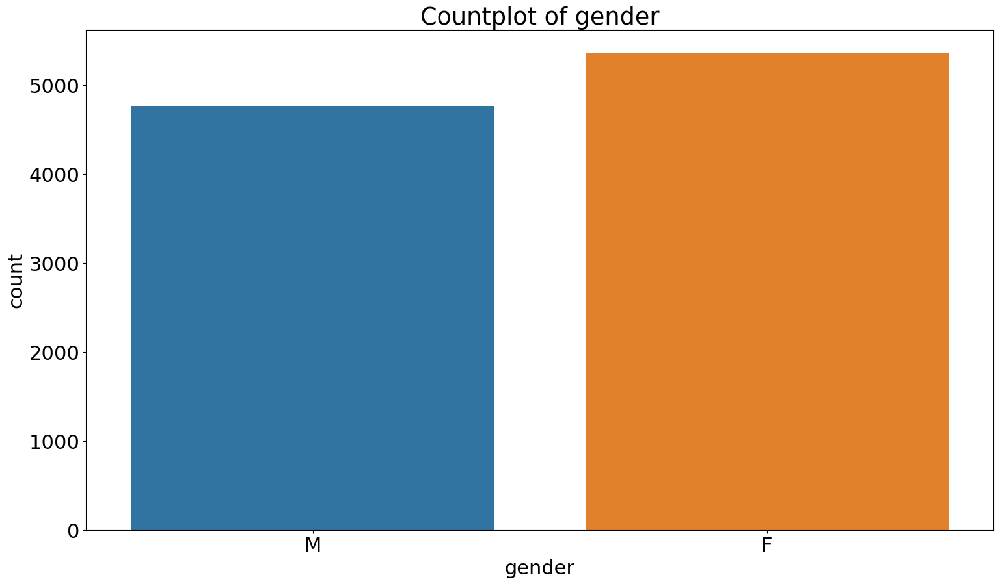

In [82]:
plotcount('gender')

Based on the countplot above, we noted that there is slightly more female customers as compared to male customers.

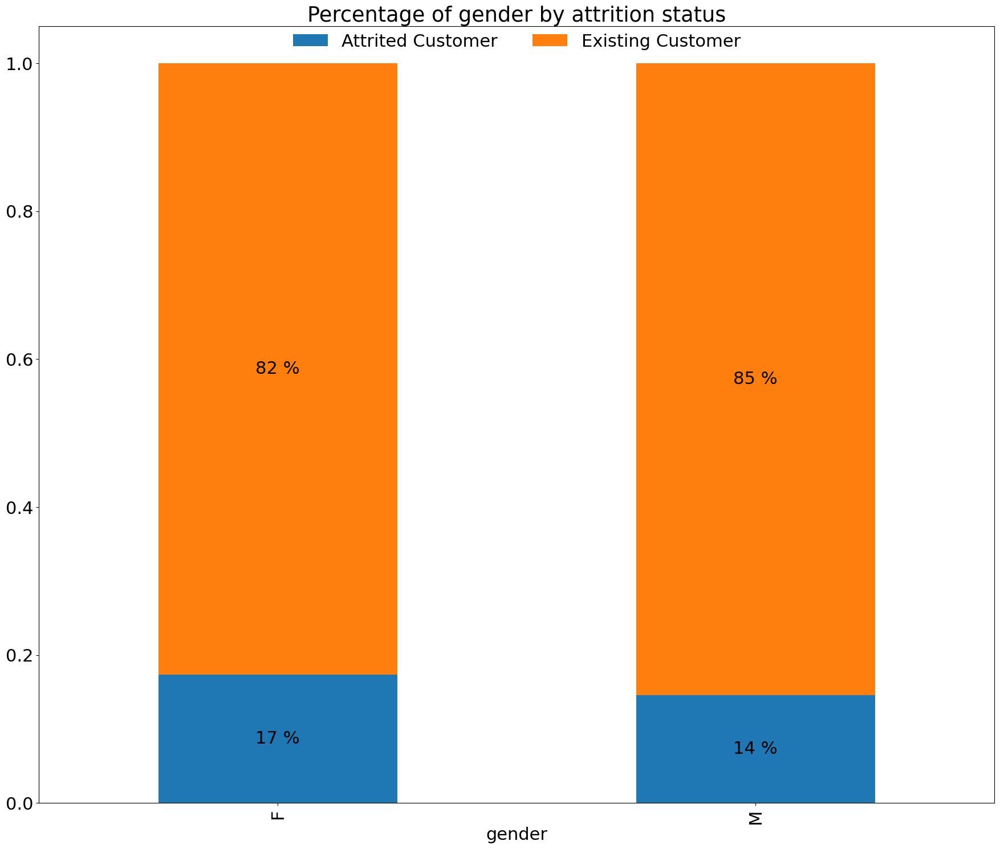

In [83]:
plotbyattrition_categorical_bar('gender')

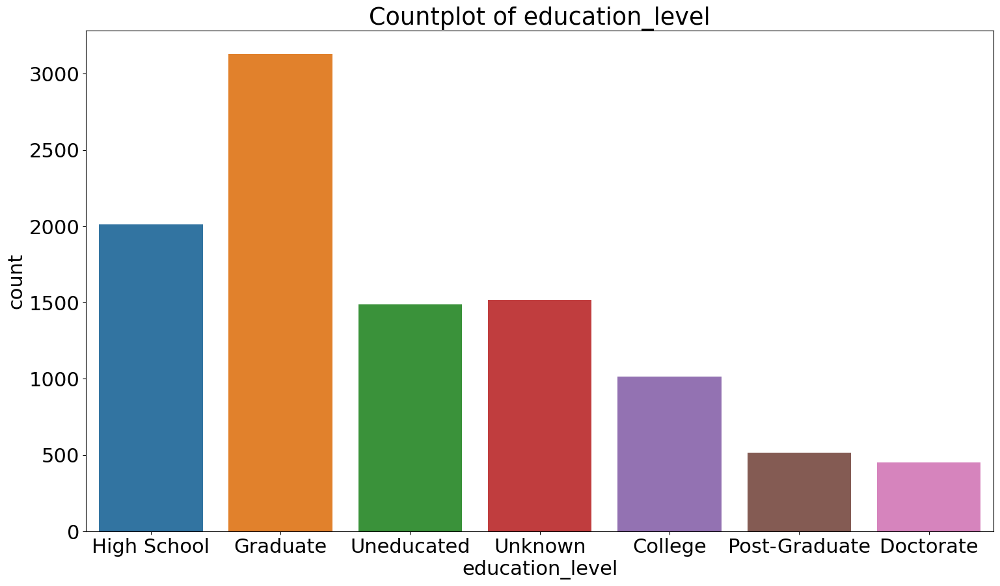

In [84]:
plotcount('education_level')

Based on the countplot above, we noted that the highest number of customers are graduates and the lowest number of customers are doctorate.

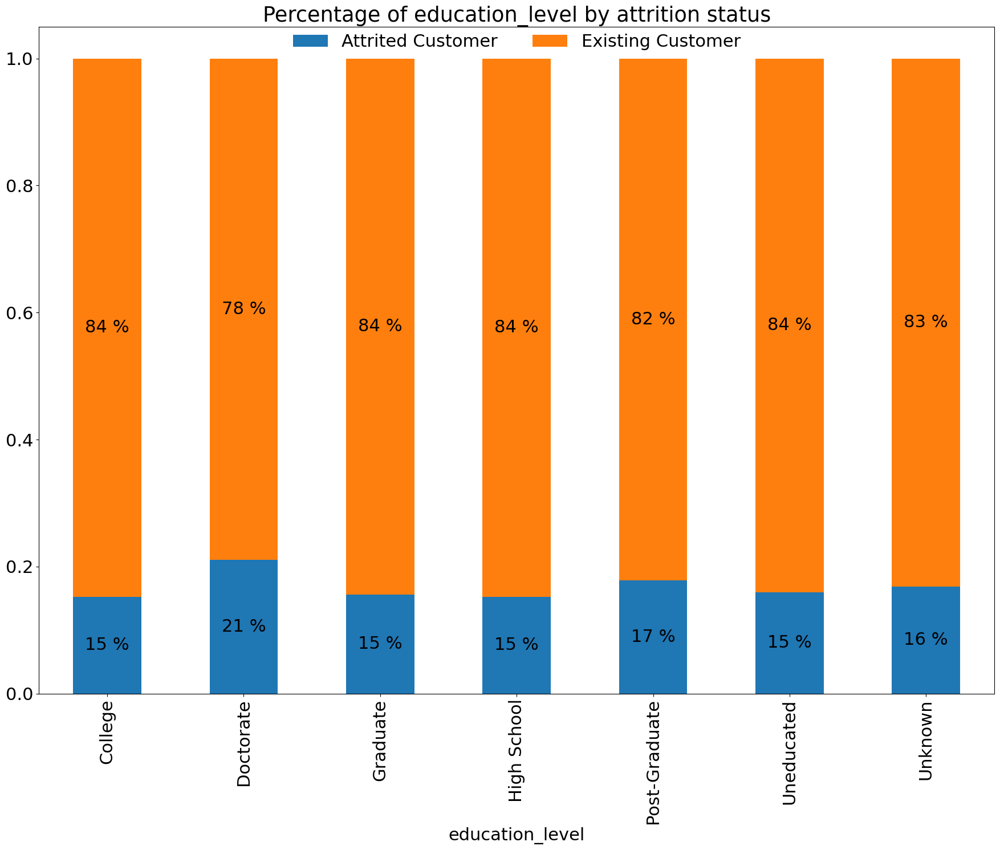

In [85]:
plotbyattrition_categorical_bar('education_level')

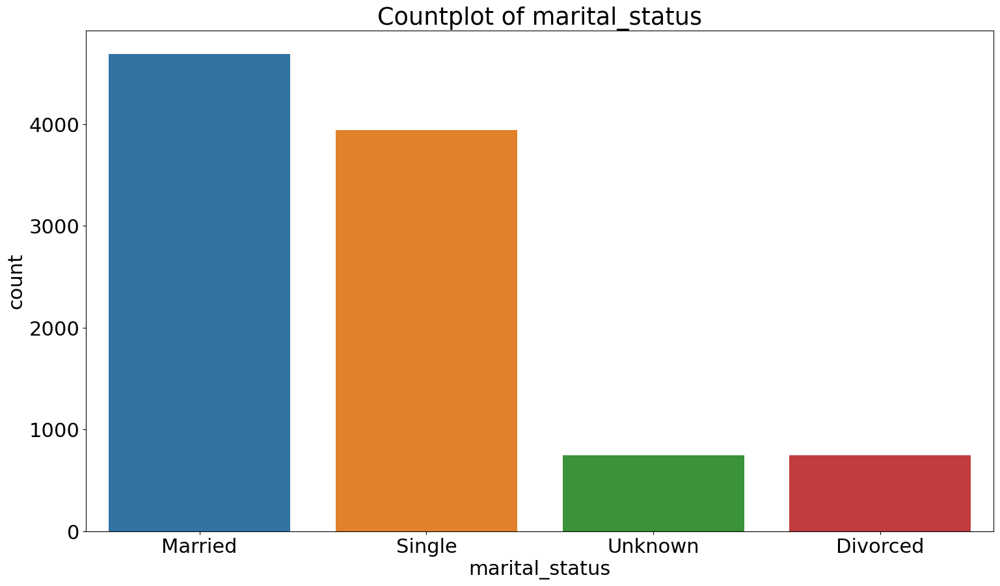

In [86]:
plotcount('marital_status')

Based on the countplot above, we noted that the highest number of customers are married. 

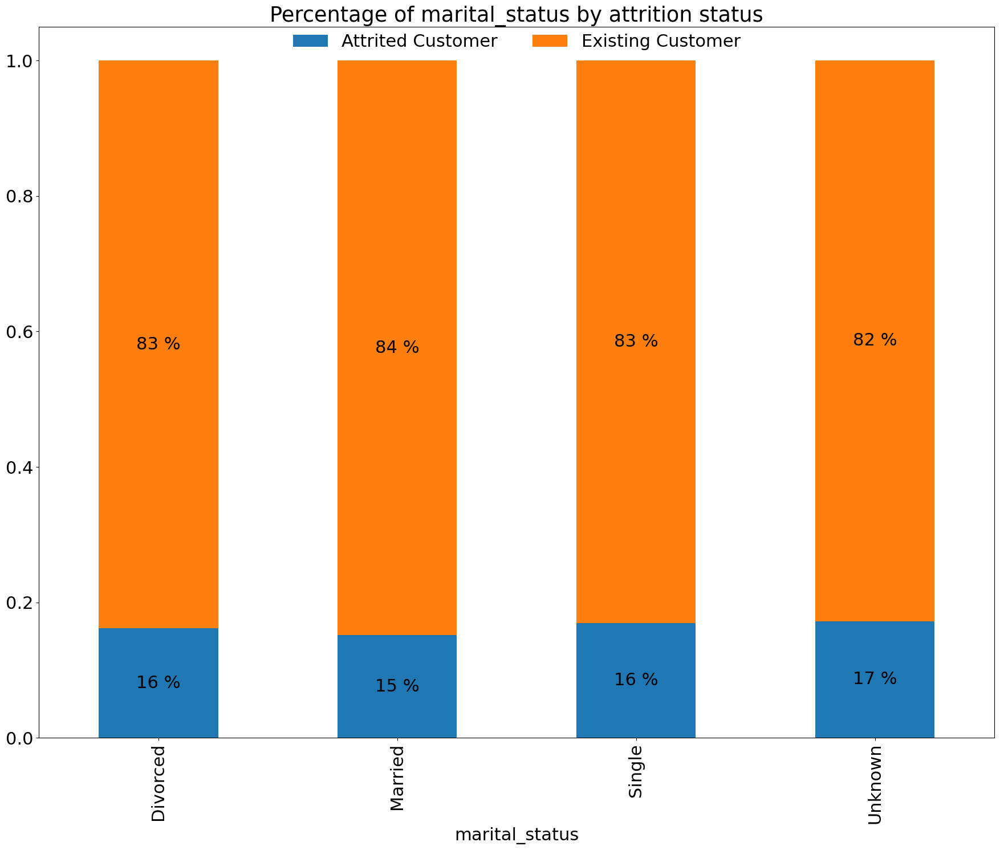

In [87]:
plotbyattrition_categorical_bar('marital_status')

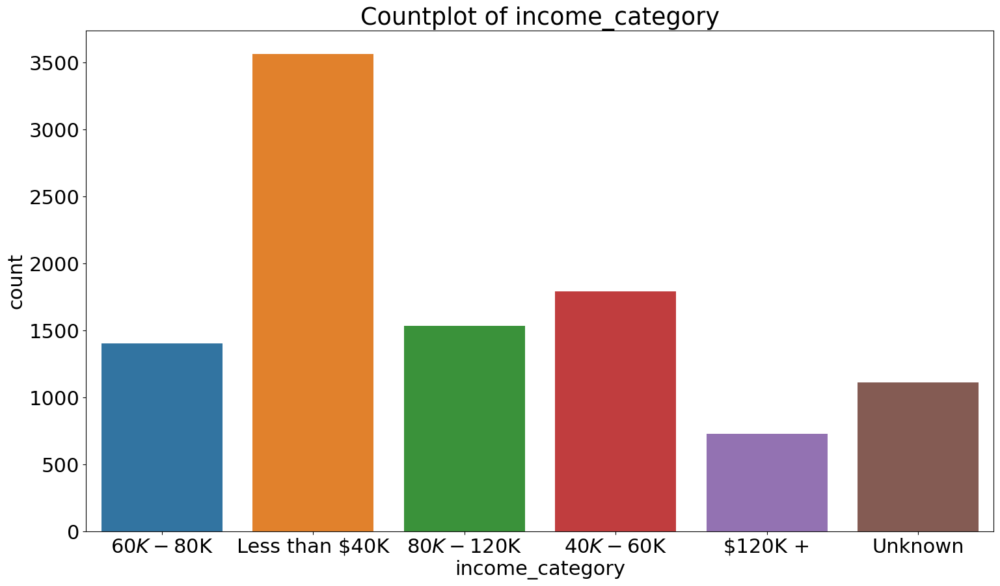

In [88]:
plotcount('income_category')

Based on the countplot above, we noted that the highest number of customers are in the income category of less than 40000.

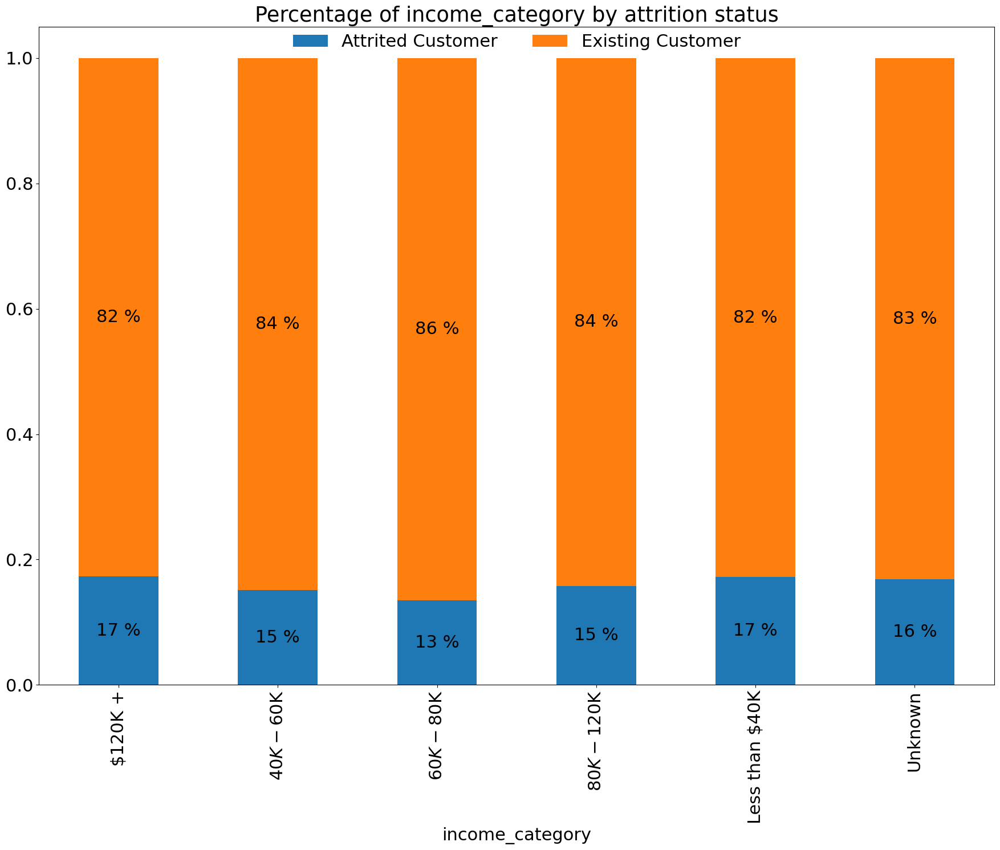

In [89]:
plotbyattrition_categorical_bar('income_category')

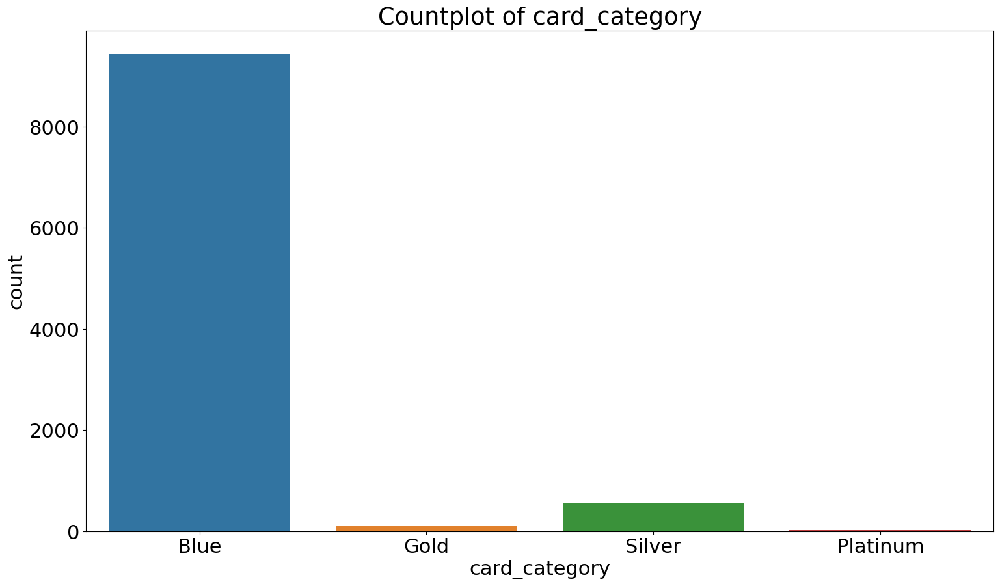

In [90]:
plotcount('card_category')

Based on the countplot above, we noted that most of the customers are in the blue card category.

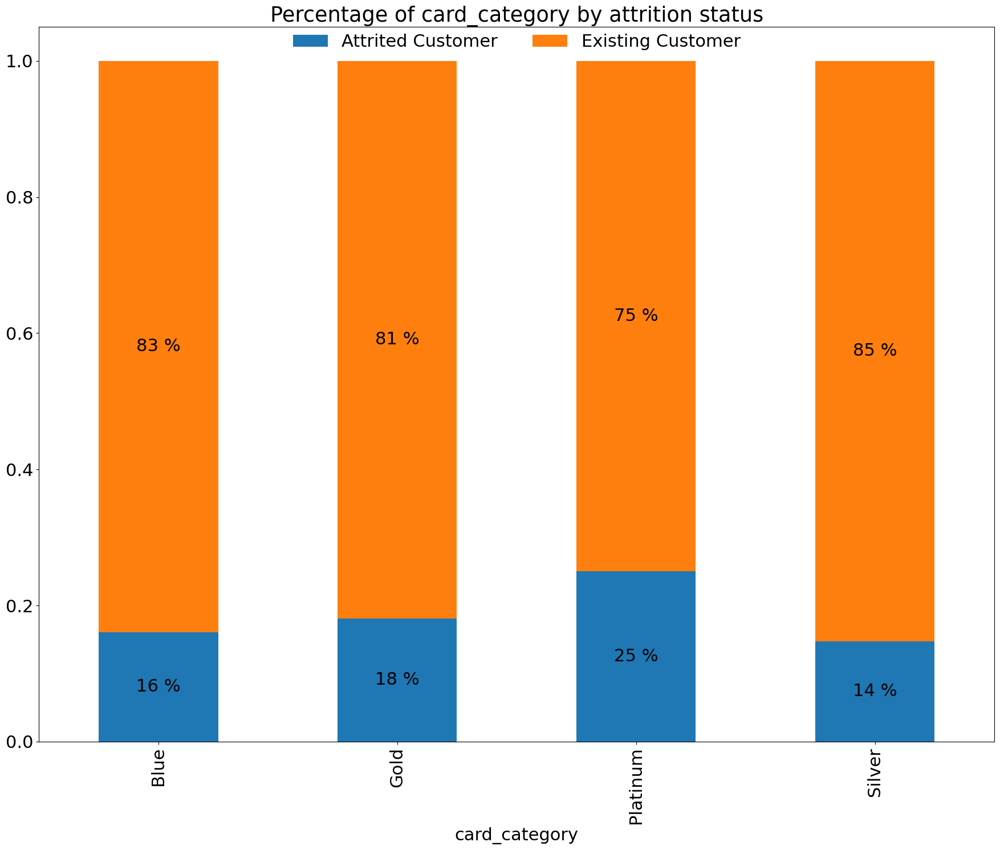

In [91]:
plotbyattrition_categorical_bar('card_category')

Based on the bar plots which we have plotted for the categorical features by attrition status, it does not seem that any feature might have an influence on the attrition status of a customer. However, we would like to examine and verify it further by conducting the chisquare test on categorical variables. 

#### Chisquare test to see if there is any relationship between categorical variables

In [92]:
# Before applying chi-square test, we have to label encode our categorical variables.
categorical_variable_data = combined_data[['attrition_flag', 'gender', 'education_level', 'marital_status', 
                                      'income_category', 'card_category']]

In [93]:
categorical_variable_data.head()

,attrition_flag,gender,education_level,marital_status,income_category,card_category
0,Existing Customer,M,High School,Married,$60K - $80K,Blue
1,Existing Customer,F,Graduate,Single,Less than $40K,Blue
2,Existing Customer,M,Graduate,Married,$80K - $120K,Blue
3,Existing Customer,F,High School,Unknown,Less than $40K,Blue
4,Existing Customer,M,Uneducated,Married,$60K - $80K,Blue


In [94]:
label_encoder = LabelEncoder()

In [95]:
for col in categorical_features:
    categorical_variable_data.loc[:, col] = label_encoder.fit_transform(categorical_variable_data.loc[:, col])

/var/folders/x1/w5lxj75d58v8mgvlvpm2_fjr0000gn/T/ipykernel_3851/2185364139.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  categorical_variable_data.loc[:, col] = label_encoder.fit_transform(categorical_variable_data.loc[:, col])


In [96]:
categorical_variable_data.head()

,attrition_flag,gender,education_level,marital_status,income_category,card_category
0,1,1,3,1,2,0
1,1,0,2,2,4,0
2,1,1,2,1,3,0
3,1,0,3,3,4,0
4,1,1,5,1,2,0


In [97]:
from sklearn.feature_selection import chi2

In [98]:
X = categorical_variable_data.drop('attrition_flag',axis=1)
y = categorical_variable_data['attrition_flag']

In [99]:
chi_scores = chi2(X,y)

In [100]:
p_values = pd.Series(chi_scores[1],index = X.columns)
p_values.sort_values(ascending = False , inplace = True)

In [101]:
p_values

education_level    0.560273
card_category      0.320692
marital_status     0.253711
income_category    0.115657
gender             0.006368
dtype: float64

We noted that only gender has a p-value of less than 0.05 (0.006368). Therefore, we will drop the other categorical variables and include gender as one of the features for our modeling.

#### Combining numerical, categorical variables and the target variable for modeling

In [102]:
sig_features = ['attrition_flag', 'gender']

In [103]:
for index, item in list(enumerate(numerical_features)):
        sig_features.append(item)

In [104]:
print(sig_features)

['attrition_flag', 'gender', 'total_relationship_count', 'months_inactive_12_mon', 'contacts_count_12_mon', 'credit_limit', 'total_revolving_bal', 'total_amt_chng_q4_q1', 'total_trans_amt', 'total_trans_ct', 'total_ct_chng_q4_q1', 'avg_utilization_ratio']


In [105]:
combined_data_sig_features = combined_data.loc[:,sig_features]

In [106]:
combined_data_sig_features.head()

,attrition_flag,gender,total_relationship_count,months_inactive_12_mon,contacts_count_12_mon,credit_limit,total_revolving_bal,total_amt_chng_q4_q1,total_trans_amt,total_trans_ct,total_ct_chng_q4_q1,avg_utilization_ratio
0,Existing Customer,M,5,1,3,12691.0,777,1.335,1144,42,1.625,0.061
1,Existing Customer,F,6,1,2,8256.0,864,1.541,1291,33,3.714,0.105
2,Existing Customer,M,4,1,0,3418.0,0,2.594,1887,20,2.333,0.000
3,Existing Customer,F,3,4,1,3313.0,2517,1.405,1171,20,2.333,0.760
4,Existing Customer,M,5,1,0,4716.0,0,2.175,816,28,2.500,0.000


### Preprocessing

#### Filtered dataset

In [107]:
# We will have to label encode the attrition_flag and gender columns for the modeling phase.
combined_data_sig_features['attrition_flag'] = combined_data_sig_features['attrition_flag'].apply(lambda str: 0 if str == 'Existing Customer' else 1)
combined_data_sig_features['gender'] = combined_data_sig_features['gender'].apply(lambda str: 0 if str == 'M' else 1)

In [108]:
combined_data_sig_features.head()

,attrition_flag,gender,total_relationship_count,months_inactive_12_mon,contacts_count_12_mon,credit_limit,total_revolving_bal,total_amt_chng_q4_q1,total_trans_amt,total_trans_ct,total_ct_chng_q4_q1,avg_utilization_ratio
0,0,0,5,1,3,12691.0,777,1.335,1144,42,1.625,0.061
1,0,1,6,1,2,8256.0,864,1.541,1291,33,3.714,0.105
2,0,0,4,1,0,3418.0,0,2.594,1887,20,2.333,0.000
3,0,1,3,4,1,3313.0,2517,1.405,1171,20,2.333,0.760
4,0,0,5,1,0,4716.0,0,2.175,816,28,2.500,0.000


In [109]:
X = combined_data_sig_features.drop('attrition_flag', axis=1)
y = combined_data_sig_features['attrition_flag']

In [110]:
y.value_counts()

0    8500
1    1627
Name: attrition_flag, dtype: int64

In [111]:
y.value_counts(normalize = True)

0    0.83934
1    0.16066
Name: attrition_flag, dtype: float64

As confirmed what we have noted from the EDA section, our dataset is imbalanced. Therefore, we will  use stratify in splitting our dataset.

In [112]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,stratify=y,random_state=42)

### Baseline accuracy

- We need to calculate baseline accuracy in order to tell if our model is better than null model (blindly predicting everything as the majority class - 0, Existing Customer).
- In this case, predicting everything as the majority class will give us `83.93% accuracy`.

### Standardization of data
- Before we start modeling our data, we have to standardize our data. 
- This is because if we don't standardize our data, then features that have larger spreads (e.g. higher ranges or higher standard deviations) will have a disproportionate influence on our model.<br>

In [113]:
# Instantiate.
ss = StandardScaler()

# Fit and transform train.
X_train_sc = ss.fit_transform(X_train)

# Transform test.
X_test_sc = ss.transform(X_test)

#### Original dataset (to compare with the filtered dataset)

In [114]:
combined_data.head()

,attrition_flag,customer_age,gender,dependent_count,education_level,marital_status,income_category,card_category,months_on_book,total_relationship_count,months_inactive_12_mon,contacts_count_12_mon,credit_limit,total_revolving_bal,avg_open_to_buy,total_amt_chng_q4_q1,total_trans_amt,total_trans_ct,total_ct_chng_q4_q1,avg_utilization_ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [115]:
# We will have to convert categorical variables in our original dataset for the modeling phase.
combined_data['attrition_flag'] = combined_data['attrition_flag'].apply(lambda str: 0 if str == 'Existing Customer' else 1)
combined_data['gender'] = combined_data['gender'].apply(lambda str: 0 if str == 'M' else 1)

In [116]:
combined_data.head()

,attrition_flag,customer_age,gender,dependent_count,education_level,marital_status,income_category,card_category,months_on_book,total_relationship_count,months_inactive_12_mon,contacts_count_12_mon,credit_limit,total_revolving_bal,avg_open_to_buy,total_amt_chng_q4_q1,total_trans_amt,total_trans_ct,total_ct_chng_q4_q1,avg_utilization_ratio
0,0,45,0,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,0,49,1,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,0,51,0,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,0,40,1,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,0,40,0,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [117]:
X_ori = combined_data.drop('attrition_flag', axis=1)
y_ori = combined_data['attrition_flag']

In [118]:
X_ori = pd.get_dummies(X_ori, columns=['education_level', 'marital_status', 'income_category', 'card_category'])

In [119]:
X_train_ori, X_test_ori, y_train_ori, y_test_ori = train_test_split(X_ori,y_ori,test_size=0.2,stratify=y_ori,random_state=42)

In [120]:
# Instantiate.
ss = StandardScaler()

# Fit and transform train.
X_train_ori_sc = ss.fit_transform(X_train_ori)

# Transform test.
X_test_ori_sc = ss.transform(X_test_ori)

## Modeling and Evaluation

We will be using the following 5 models to train our data on both the original and filtered datasets and identify the best model based on their performance.

1) K-nearest neighbor <br>
2) Bagging Classifier <br>
3) Random Forest <br>
4) Ada Boost Classifier <br>
5) Support Vector Model <br>

### K-nearest neighbor

In [121]:
knn_params = {
    'n_neighbors': range(1, 51, 5),
    'metric': ['euclidean', 'manhattan']
}

In [122]:
knn_gridsearch = GridSearchCV(KNeighborsClassifier(), # estimator: What is the model we want to fit?
                              knn_params, # param_grid: What is the dictionary of hyperparameters?
                              cv=5, # What number of folds in CV will we use?
                              verbose=1, # Display limited output post grid searching
                              n_jobs=-1 # Use all CPU cores on your computer to speed up the fit
                             )

#### Original dataset

In [123]:
knn_gridsearch.fit(X_train_ori_sc, y_train_ori);

Fitting 5 folds for each of 20 candidates, totalling 100 fits


In [124]:
knn_gridsearch.score(X_train_ori_sc, y_train_ori)

0.8969263053943958

In [125]:
knn_gridsearch.score(X_test_ori_sc, y_test_ori)

0.8756169792694966

In [126]:
print(knn_gridsearch.best_score_)

0.8828540529013488


In [127]:
knn_gridsearch.best_params_

{'metric': 'manhattan', 'n_neighbors': 11}

In [128]:
preds = knn_gridsearch.predict(X_test_ori_sc)

In [129]:
confusion_matrix(y_test_ori, preds) 

array([[1683,   18],
       [ 234,   91]])

In [130]:
tn, fp, fn, tp = confusion_matrix(y_test_ori, preds).ravel()

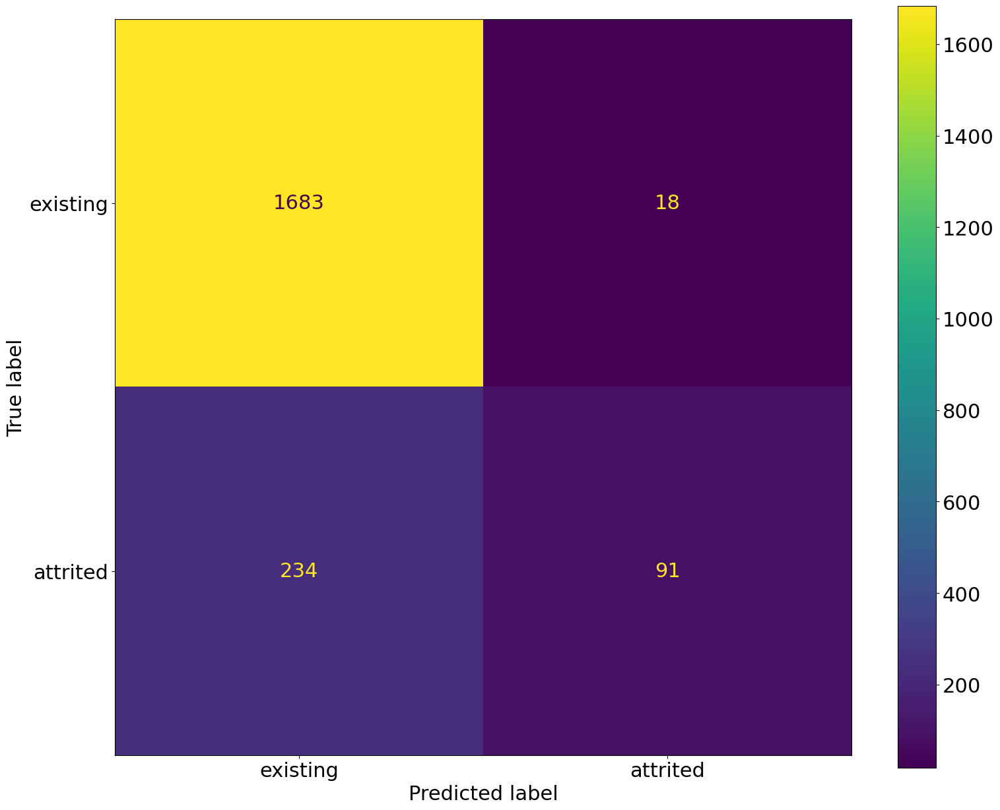

In [131]:
cm = confusion_matrix(y_test_ori, preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['existing', 'attrited'])
disp.plot();

In [132]:
f1_score(y_train_ori, knn_gridsearch.predict(X_train_ori_sc))

0.5537145911277391

In [133]:
f1_score(y_test_ori, preds)

0.4193548387096775

/Users/jerometan/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


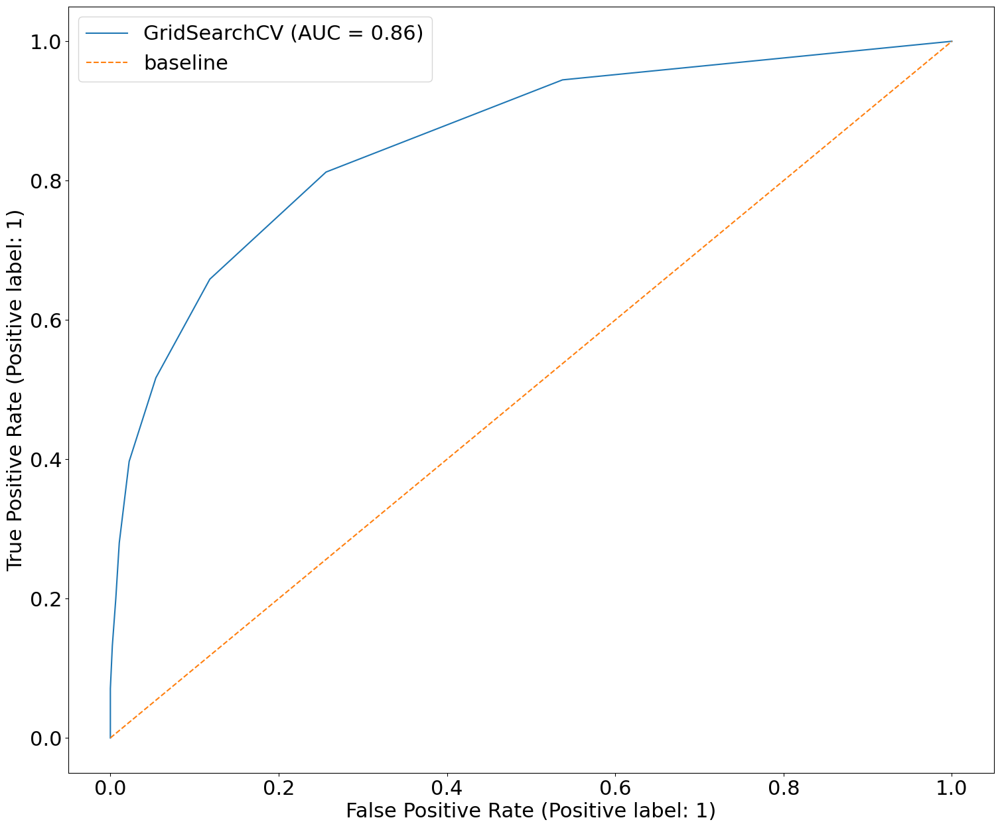

In [134]:
# from sklearn metrics
plot_roc_curve(knn_gridsearch, X_test_ori_sc, y_test_ori)
plt.plot([0, 1], [0, 1],
         label='baseline', linestyle='--') # to simulate prediction of constant class of data points 
plt.legend();

In [135]:
roc_auc_score(y_test_ori, knn_gridsearch.predict_proba(X_test_ori_sc)[:,1])

0.856365034142812

#### Filtered dataset

In [136]:
knn_gridsearch.fit(X_train_sc, y_train);

Fitting 5 folds for each of 20 candidates, totalling 100 fits


In [137]:
knn_gridsearch.score(X_train_sc, y_train)

0.9407480557955807

In [138]:
knn_gridsearch.score(X_test_sc, y_test)

0.9259624876604146

In [139]:
print(knn_gridsearch.best_score_)

0.9267993389235422


In [140]:
knn_gridsearch.best_params_

{'metric': 'manhattan', 'n_neighbors': 11}

In [141]:
preds = knn_gridsearch.predict(X_test_sc)

In [142]:
confusion_matrix(y_test, preds) 

array([[1664,   37],
       [ 113,  212]])

In [143]:
tn, fp, fn, tp = confusion_matrix(y_test, preds).ravel()

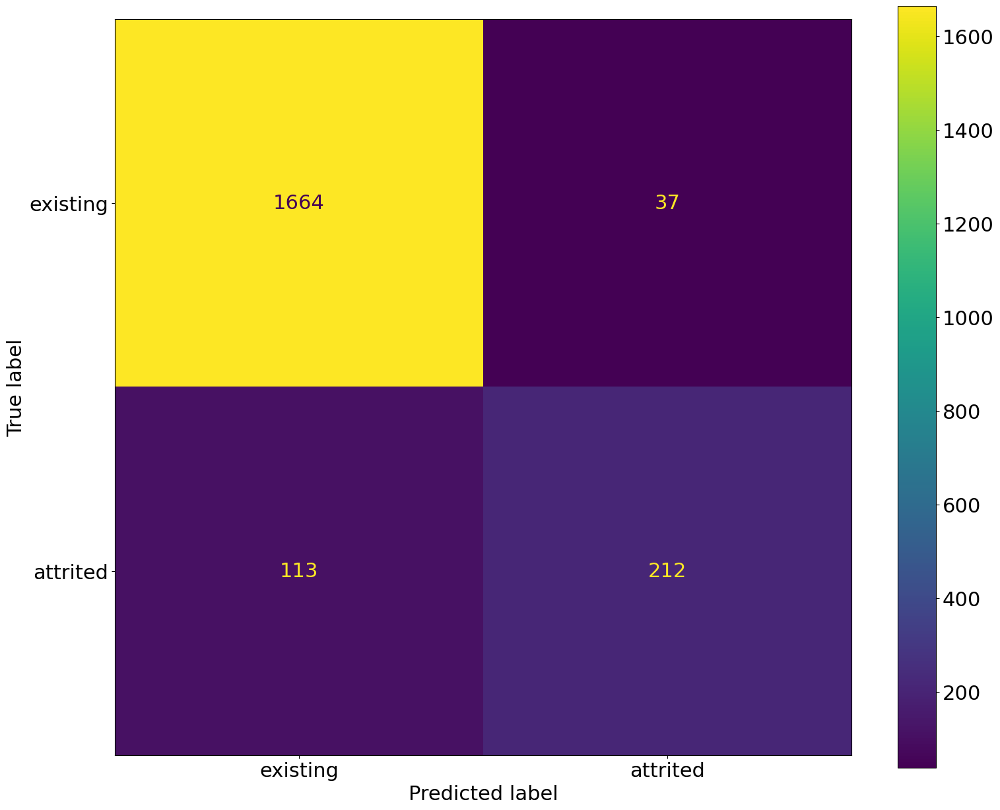

In [144]:
cm = confusion_matrix(y_test, preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['existing', 'attrited'])
disp.plot();

In [145]:
f1_score(y_train, knn_gridsearch.predict(X_train_sc))

0.7946963216424293

In [146]:
f1_score(y_test, preds)

0.7386759581881532

/Users/jerometan/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


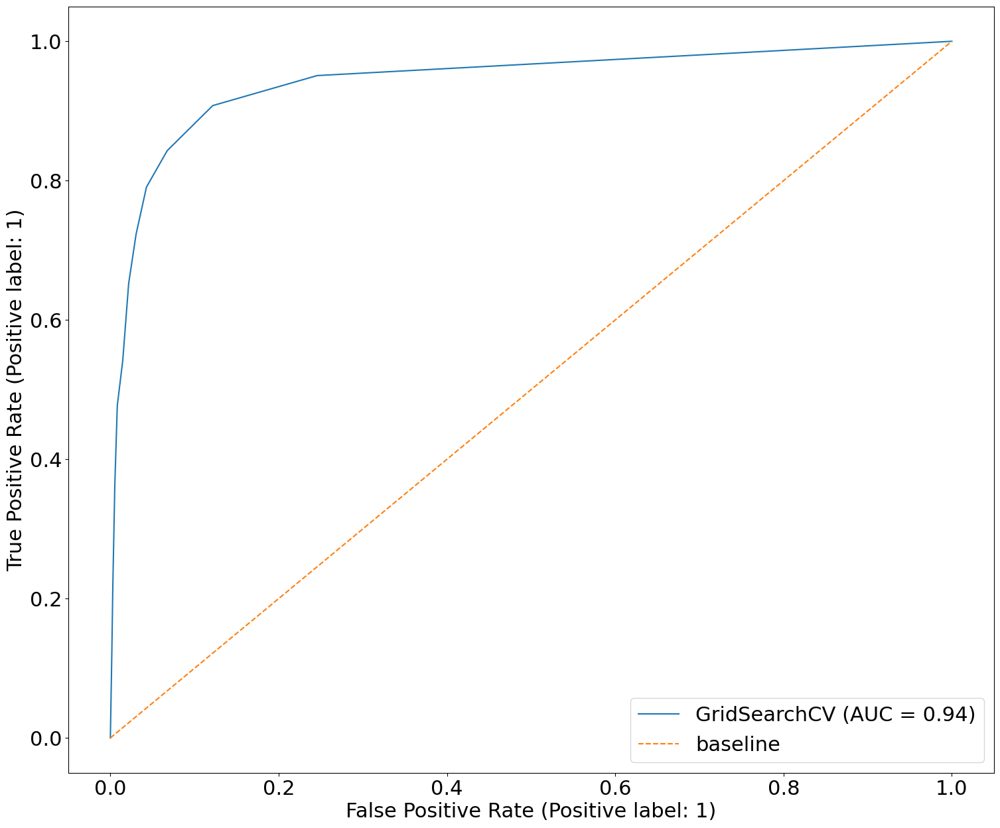

In [147]:
# from sklearn metrics
plot_roc_curve(knn_gridsearch, X_test_sc, y_test)
plt.plot([0, 1], [0, 1],
         label='baseline', linestyle='--') # to simulate prediction of constant class of data points 
plt.legend();

In [148]:
roc_auc_score(y_test, knn_gridsearch.predict_proba(X_test_sc)[:,1])

0.943619590286257

### Bagging Classifier

In [149]:
bc_params = {'n_estimators': [200, 400, 600, 800], 
             'max_features': [1, 2, 5, 10]}

In [150]:
bc_gridsearch = GridSearchCV(BaggingClassifier(random_state=42), # estimator: What is the model we want to fit?
                              bc_params, # param_grid: What is the dictionary of hyperparameters?
                              cv=5, # What number of folds in CV will we use?
                              verbose=1, # Display limited output post grid searching
                              n_jobs=-1 # Use all CPU cores on your computer to speed up the fit
                             )

#### Original dataset

In [151]:
bc_gridsearch.fit(X_train_ori_sc, y_train_ori);

Fitting 5 folds for each of 16 candidates, totalling 80 fits


In [152]:
bc_gridsearch.score(X_train_ori_sc, y_train_ori)

1.0

In [153]:
bc_gridsearch.score(X_test_ori_sc, y_test_ori)

0.9057255676209279

In [154]:
print(bc_gridsearch.best_score_)

0.9076660497635205


In [155]:
bc_gridsearch.best_params_

{'max_features': 10, 'n_estimators': 600}

In [156]:
preds = bc_gridsearch.predict(X_test_ori_sc)

In [157]:
confusion_matrix(y_test_ori, preds) 

array([[1700,    1],
       [ 190,  135]])

In [158]:
tn, fp, fn, tp = confusion_matrix(y_test_ori, preds).ravel()

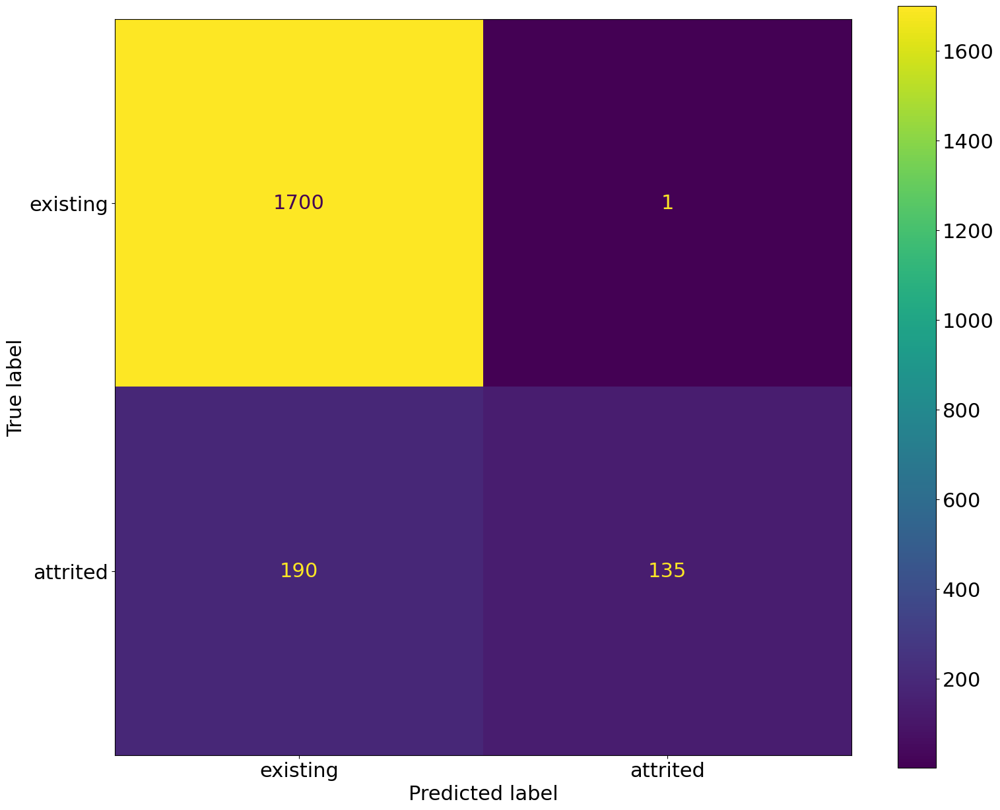

In [159]:
cm = confusion_matrix(y_test_ori, preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['existing', 'attrited'])
disp.plot();

In [160]:
f1_score(y_train_ori, bc_gridsearch.predict(X_train_ori_sc))

1.0

In [161]:
f1_score(y_test_ori, preds)

0.5856832971800434

/Users/jerometan/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


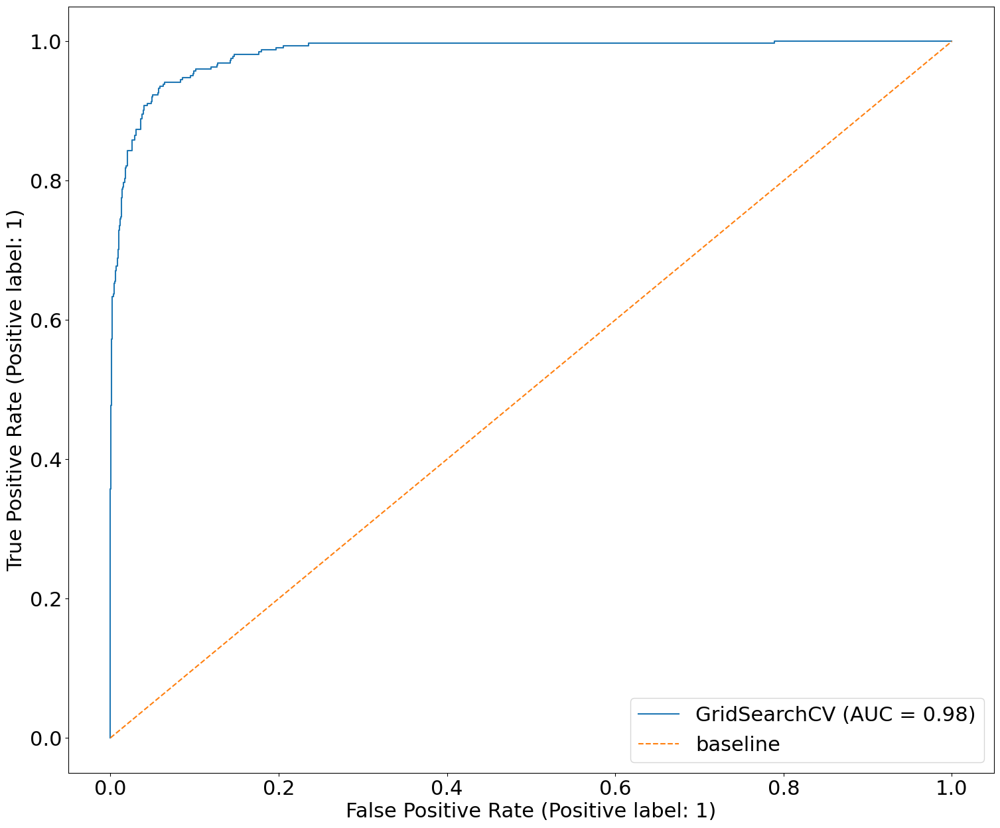

In [162]:
# from sklearn metrics
plot_roc_curve(bc_gridsearch, X_test_ori_sc, y_test_ori)
plt.plot([0, 1], [0, 1],
         label='baseline', linestyle='--') # to simulate prediction of constant class of data points 
plt.legend();

In [163]:
roc_auc_score(y_test_ori, bc_gridsearch.predict_proba(X_test_ori_sc)[:,1])

0.9830705919594809

#### Filtered dataset

In [164]:
bc_gridsearch.fit(X_train_sc, y_train);

Fitting 5 folds for each of 16 candidates, totalling 80 fits


In [165]:
bc_gridsearch.score(X_train_sc, y_train)

1.0

In [166]:
bc_gridsearch.score(X_test_sc, y_test)

0.9545903257650543

In [167]:
print(bc_gridsearch.best_score_)

0.96309060860161


In [168]:
bc_gridsearch.best_params_

{'max_features': 10, 'n_estimators': 400}

In [169]:
preds = bc_gridsearch.predict(X_test_sc)

In [170]:
confusion_matrix(y_test, preds) 

array([[1664,   37],
       [  55,  270]])

In [171]:
tn, fp, fn, tp = confusion_matrix(y_test, preds).ravel()

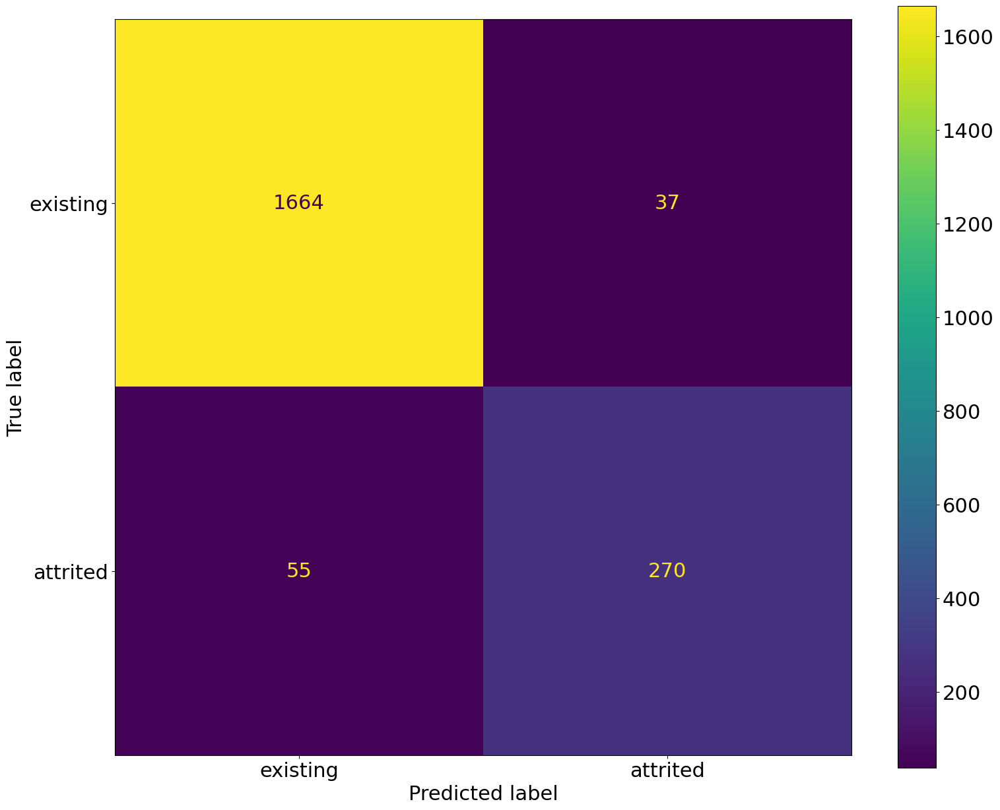

In [172]:
cm = confusion_matrix(y_test, preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['existing', 'attrited'])
disp.plot();

In [173]:
f1_score(y_train, bc_gridsearch.predict(X_train_sc))

1.0

In [174]:
f1_score(y_test, preds)

0.8544303797468353

/Users/jerometan/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


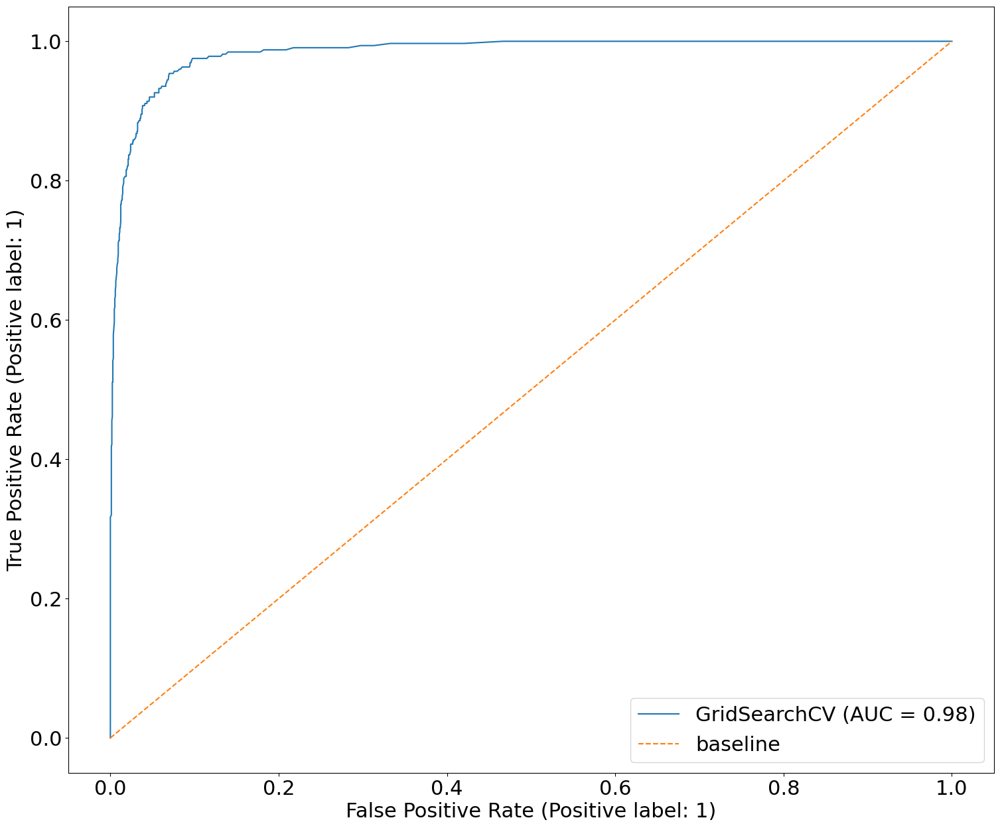

In [175]:
# from sklearn metrics
plot_roc_curve(bc_gridsearch, X_test_sc, y_test)
plt.plot([0, 1], [0, 1],
         label='baseline', linestyle='--') # to simulate prediction of constant class of data points 
plt.legend();

In [176]:
roc_auc_score(y_test, bc_gridsearch.predict_proba(X_test_sc)[:,1])

0.9843196309862977

### Random Forest

In [177]:
rf_params = {'n_estimators': [200, 400, 600, 800], 
             'max_depth': [1, 2, 5, 10, 15]}

In [178]:
rf_gridsearch = GridSearchCV(RandomForestClassifier(random_state=42), # estimator: What is the model we want to fit?
                              rf_params, # param_grid: What is the dictionary of hyperparameters?
                              cv=5, # What number of folds in CV will we use?
                              verbose=1, # Display limited output post grid searching
                              n_jobs=-1 # Use all CPU cores on your computer to speed up the fit
                             )

#### Original dataset

In [179]:
rf_gridsearch.fit(X_train_ori_sc, y_train_ori);

Fitting 5 folds for each of 20 candidates, totalling 100 fits


In [180]:
rf_gridsearch.score(X_train_ori_sc, y_train_ori)

0.9988890260461671

In [181]:
rf_gridsearch.score(X_test_ori_sc, y_test_ori)

0.9555774925962488

In [182]:
print(rf_gridsearch.best_score_)

0.9566722264110709


In [183]:
rf_gridsearch.best_params_

{'max_depth': 15, 'n_estimators': 600}

In [184]:
preds = rf_gridsearch.predict(X_test_ori_sc)

In [185]:
confusion_matrix(y_test_ori, preds) 

array([[1687,   14],
       [  76,  249]])

In [186]:
tn, fp, fn, tp = confusion_matrix(y_test_ori, preds).ravel()

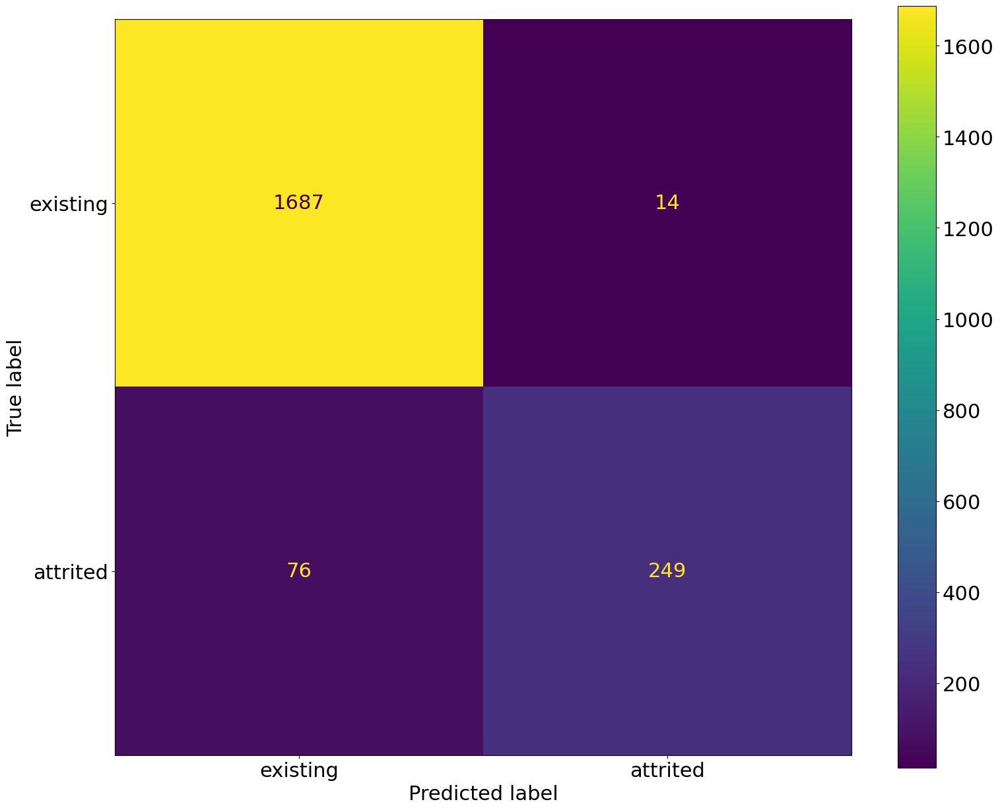

In [187]:
cm = confusion_matrix(y_test_ori, preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['existing', 'attrited'])
disp.plot();

In [188]:
f1_score(y_train_ori, rf_gridsearch.predict(X_train_ori_sc))

0.9965317919075144

In [189]:
f1_score(y_test_ori, preds)

0.8469387755102041

/Users/jerometan/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


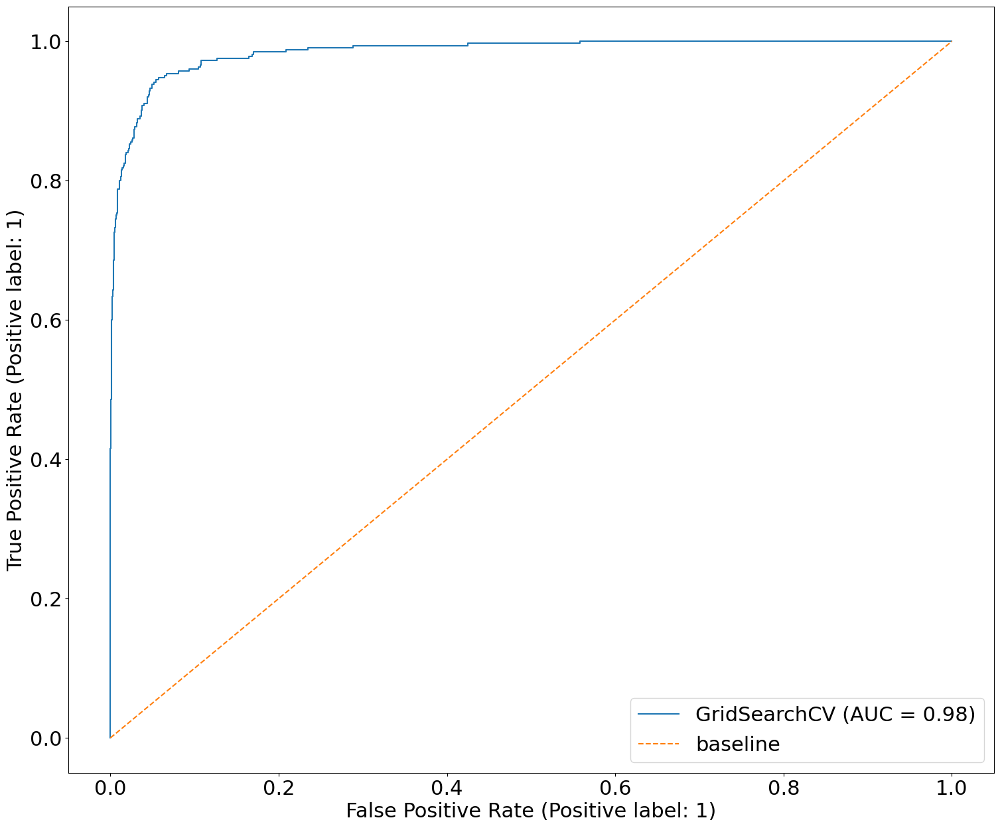

In [190]:
# from sklearn metrics
plot_roc_curve(rf_gridsearch, X_test_ori_sc, y_test_ori)
plt.plot([0, 1], [0, 1],
         label='baseline', linestyle='--') # to simulate prediction of constant class of data points 
plt.legend();

In [191]:
roc_auc_score(y_test_ori, rf_gridsearch.predict_proba(X_test_ori_sc)[:,1])

0.9847944647944649

#### Filtered dataset

In [192]:
rf_gridsearch.fit(X_train_sc, y_train);

Fitting 5 folds for each of 20 candidates, totalling 100 fits


In [193]:
rf_gridsearch.score(X_train_sc, y_train)

0.9992593506974448

In [194]:
rf_gridsearch.score(X_test_sc, y_test)

0.956071076011846

In [195]:
print(rf_gridsearch.best_score_)

0.9618561168612578


In [196]:
rf_gridsearch.best_params_

{'max_depth': 15, 'n_estimators': 200}

In [197]:
preds = rf_gridsearch.predict(X_test_sc)

In [198]:
confusion_matrix(y_test, preds) 

array([[1673,   28],
       [  61,  264]])

In [199]:
tn, fp, fn, tp = confusion_matrix(y_test, preds).ravel()

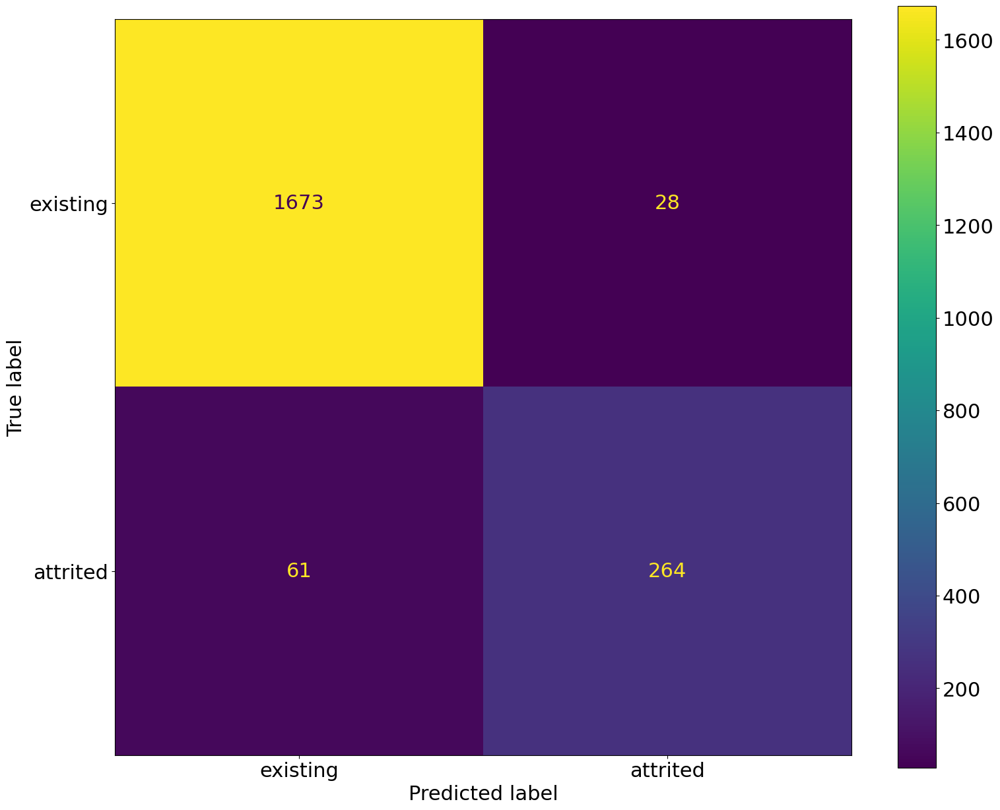

In [200]:
cm = confusion_matrix(y_test, preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['existing', 'attrited'])
disp.plot();

In [201]:
f1_score(y_train, rf_gridsearch.predict(X_train_sc))

0.997690531177829

In [202]:
f1_score(y_test, preds)

0.8557536466774717

/Users/jerometan/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


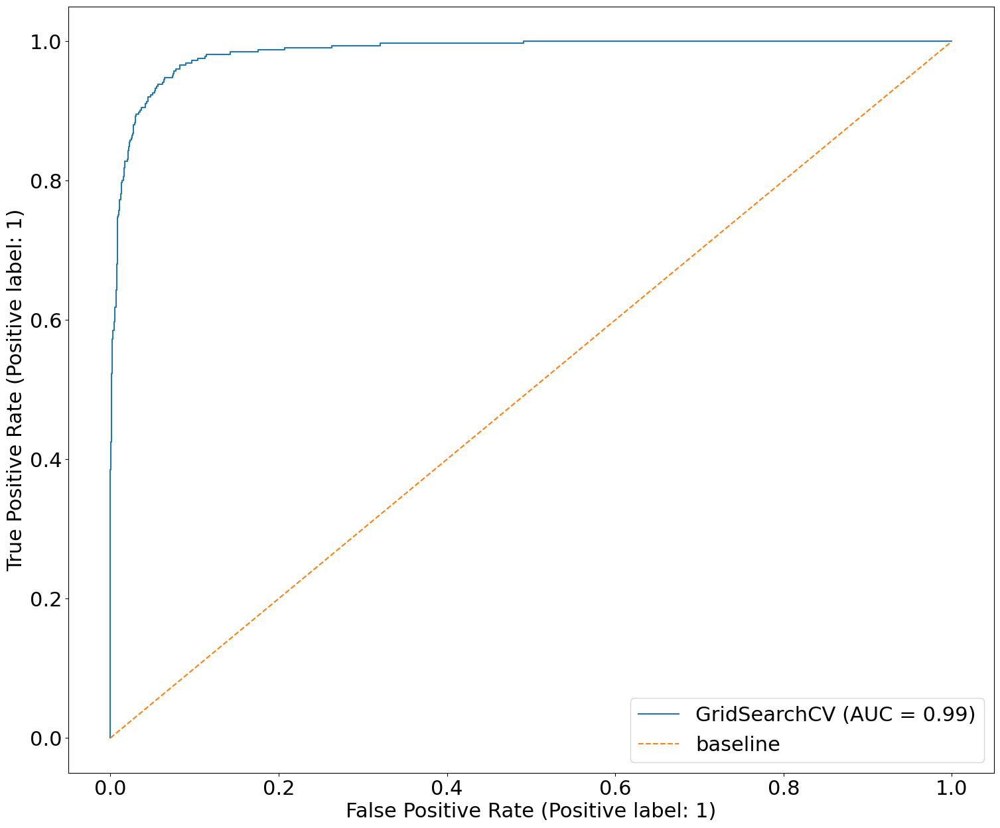

In [203]:
# from sklearn metrics
plot_roc_curve(rf_gridsearch, X_test_sc, y_test)
plt.plot([0, 1], [0, 1],
         label='baseline', linestyle='--') # to simulate prediction of constant class of data points 
plt.legend();

In [204]:
roc_auc_score(y_test, rf_gridsearch.predict_proba(X_test_sc)[:,1])

0.9852828652828652

### AdaBoost Classifier

In [205]:
ada_params = {
    'n_estimators': [50,100,150,200], # maximum number of estimators at which boosting is terminated. in this case, max no. of DTs
    'learning_rate': [.9, 1., 1.1],
}

In [206]:
ada_gridsearch = GridSearchCV(AdaBoostClassifier(random_state=42), # estimator: What is the model we want to fit?
                              ada_params, # param_grid: What is the dictionary of hyperparameters?
                              cv=5, # What number of folds in CV will we use?
                              verbose=1, # Display limited output post grid searching
                              n_jobs=-1 # Use all CPU cores on your computer to speed up the fit
                             )

#### Orginal dataset

In [207]:
ada_gridsearch.fit(X_train_ori_sc, y_train_ori);

Fitting 5 folds for each of 12 candidates, totalling 60 fits


In [208]:
ada_gridsearch.score(X_train_ori_sc, y_train_ori)

0.9721022096037526

In [209]:
ada_gridsearch.score(X_test_ori_sc, y_test_ori)

0.9570582428430404

In [210]:
print(ada_gridsearch.best_score_)

0.963090913245139


In [211]:
ada_gridsearch.best_params_

{'learning_rate': 1.1, 'n_estimators': 200}

In [212]:
preds = ada_gridsearch.predict(X_test_ori_sc)

In [213]:
confusion_matrix(y_test_ori, preds) 

array([[1669,   32],
       [  55,  270]])

In [214]:
tn, fp, fn, tp = confusion_matrix(y_test_ori, preds).ravel()

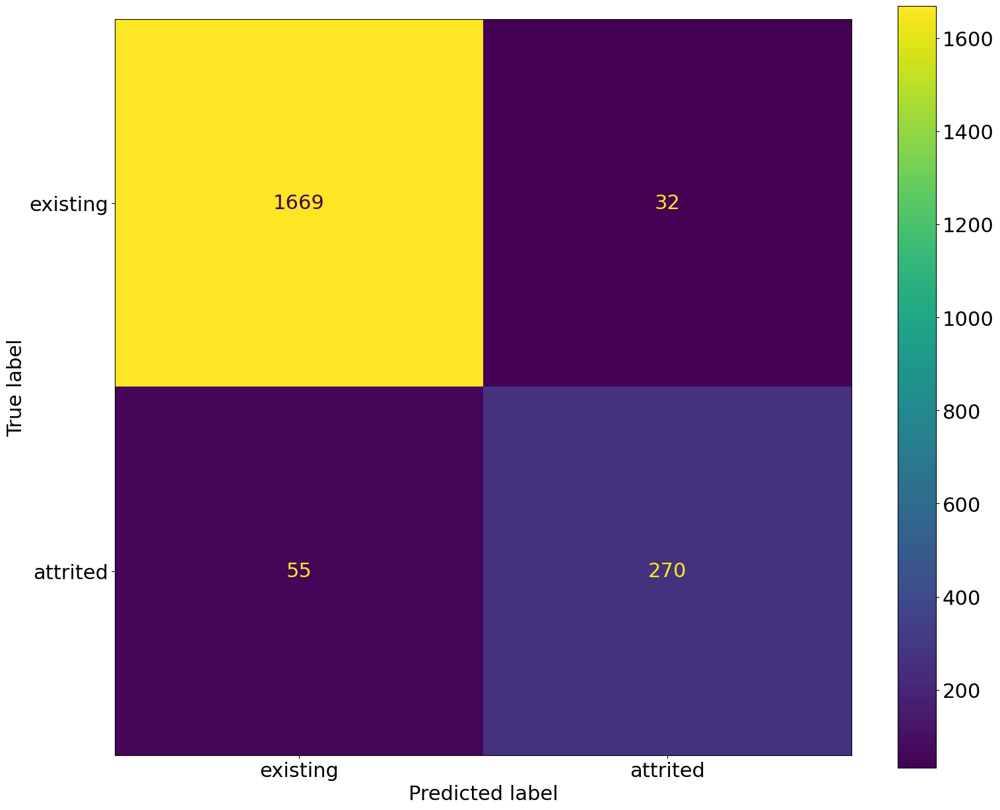

In [215]:
cm = confusion_matrix(y_test_ori, preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['existing', 'attrited'])
disp.plot();

In [216]:
f1_score(y_train_ori, ada_gridsearch.predict(X_train_ori_sc))

0.9116497263487099

In [217]:
f1_score(y_test_ori, preds)

0.8612440191387559

/Users/jerometan/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


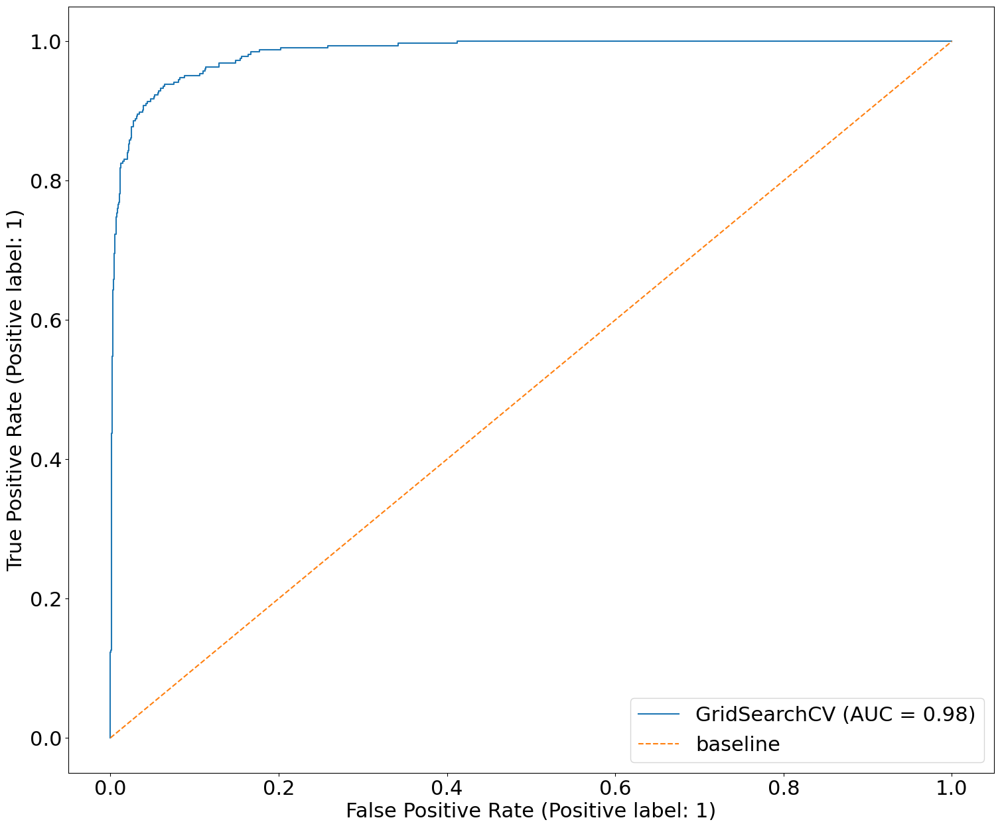

In [218]:
# from sklearn metrics
plot_roc_curve(ada_gridsearch, X_test_ori_sc, y_test)
plt.plot([0, 1], [0, 1],
         label='baseline', linestyle='--') # to simulate prediction of constant class of data points 
plt.legend();

In [219]:
roc_auc_score(y_test_ori, ada_gridsearch.predict_proba(X_test_ori_sc)[:,1])

0.9841161307827974

#### Filtered dataset

In [220]:
ada_gridsearch.fit(X_train_sc, y_train);

Fitting 5 folds for each of 12 candidates, totalling 60 fits


In [221]:
ada_gridsearch.score(X_train_sc, y_train)

0.9644488334773484

In [222]:
ada_gridsearch.score(X_test_sc, y_test)

0.9555774925962488

In [223]:
print(ada_gridsearch.best_score_)

0.9595105901706766


In [224]:
ada_gridsearch.best_params_

{'learning_rate': 0.9, 'n_estimators': 100}

In [225]:
preds = ada_gridsearch.predict(X_test_sc)

In [226]:
confusion_matrix(y_test, preds) 

array([[1668,   33],
       [  57,  268]])

In [227]:
tn, fp, fn, tp = confusion_matrix(y_test, preds).ravel()

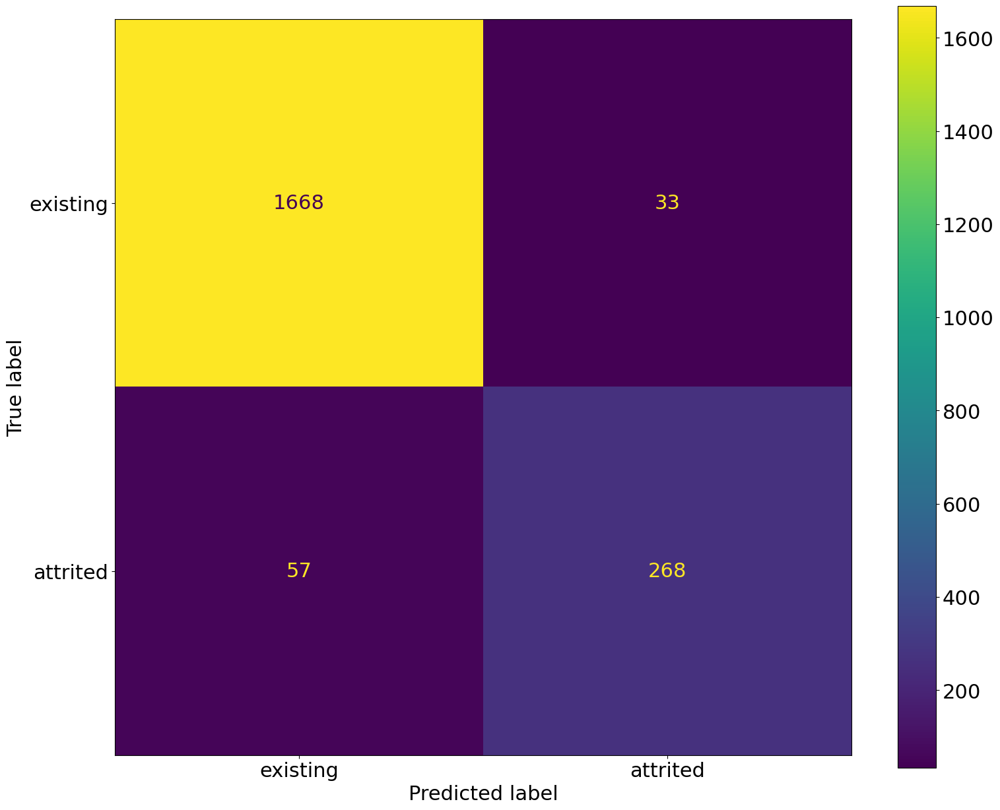

In [228]:
cm = confusion_matrix(y_test, preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['existing', 'attrited'])
disp.plot();

In [229]:
f1_score(y_train, ada_gridsearch.predict(X_train_sc))

0.8867033831628638

In [230]:
f1_score(y_test, preds)

0.8562300319488817

/Users/jerometan/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


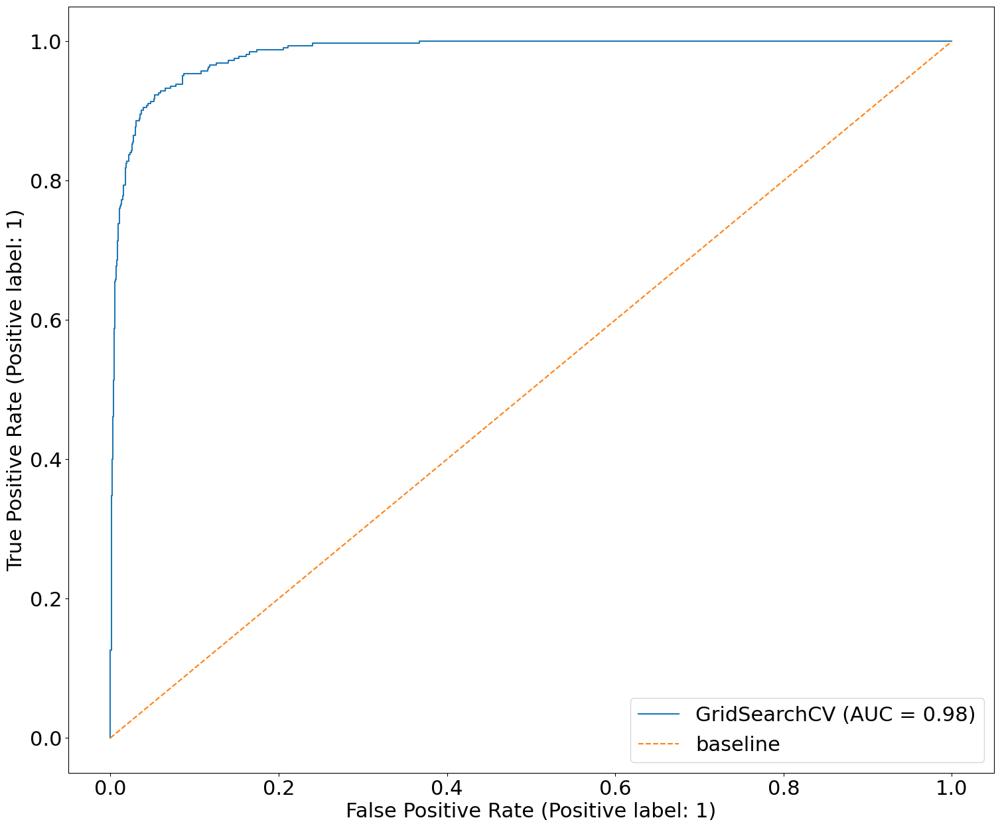

In [231]:
# from sklearn metrics
plot_roc_curve(ada_gridsearch, X_test_sc, y_test)
plt.plot([0, 1], [0, 1],
         label='baseline', linestyle='--') # to simulate prediction of constant class of data points 
plt.legend();

In [232]:
roc_auc_score(y_test, ada_gridsearch.predict_proba(X_test_sc)[:,1])

0.9832731877176322

### Support Vector Model

In [233]:
svc_params = {
    'C': [0.1, 0.5, 1, 10],
    'kernel': ['linear','poly','rbf'],
    'probability': [True],
}

In [234]:
svc_gridsearch = GridSearchCV(SVC(random_state=42), # estimator: What is the model we want to fit?
                              svc_params, # param_grid: What is the dictionary of hyperparameters?
                              cv=5, # What number of folds in CV will we use?
                              verbose=1, # Display limited output post grid searching
                              n_jobs=-1 # Use all CPU cores on your computer to speed up the fit
                             )

#### Original dataset

In [235]:
svc_gridsearch.fit(X_train_ori_sc, y_train_ori);

Fitting 5 folds for each of 12 candidates, totalling 60 fits


In [236]:
svc_gridsearch.score(X_train_ori_sc, y_train_ori)

0.9807431181335637

In [237]:
svc_gridsearch.score(X_test_ori_sc, y_test_ori)

0.9146100691016782

In [238]:
print(svc_gridsearch.best_score_)

0.9163068826589287


In [239]:
svc_gridsearch.best_params_

{'C': 10, 'kernel': 'rbf', 'probability': True}

In [240]:
preds = svc_gridsearch.predict(X_test_ori_sc)

In [241]:
confusion_matrix(y_test_ori, preds) 

array([[1642,   59],
       [ 114,  211]])

In [242]:
tn, fp, fn, tp = confusion_matrix(y_test_ori, preds).ravel()

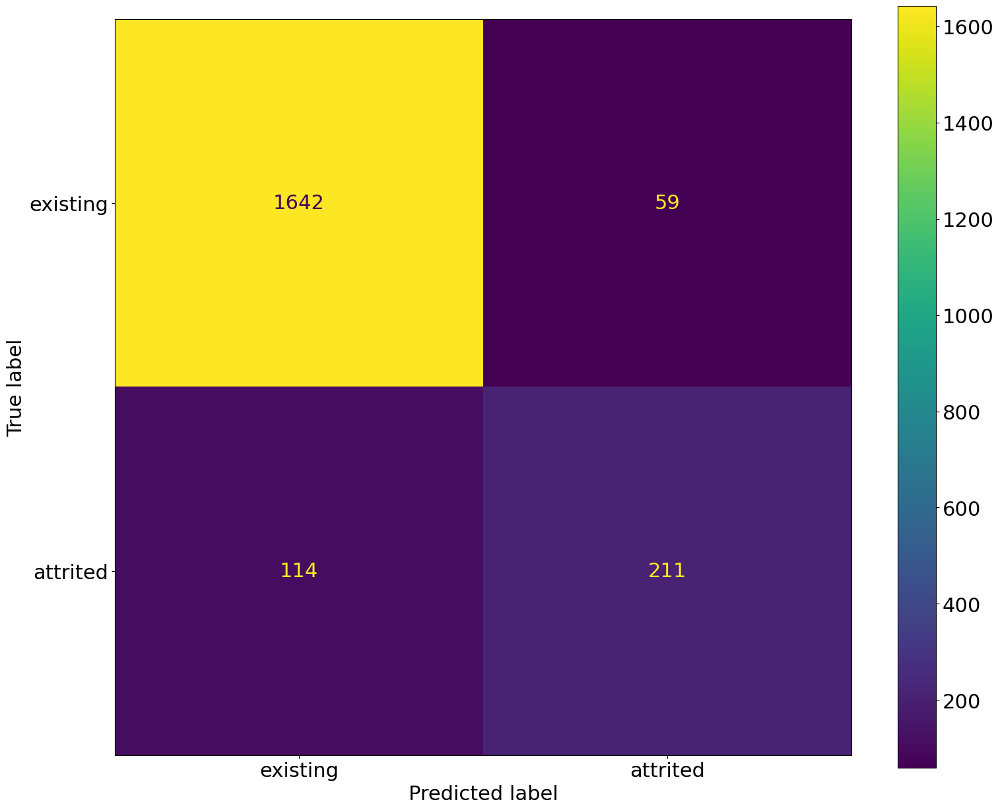

In [243]:
cm = confusion_matrix(y_test_ori, preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['existing', 'attrited'])
disp.plot();

In [244]:
f1_score(y_train_ori, svc_gridsearch.predict(X_train_ori_sc))

0.9380460683081812

In [245]:
f1_score(y_test_ori, preds)

0.7092436974789915

/Users/jerometan/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


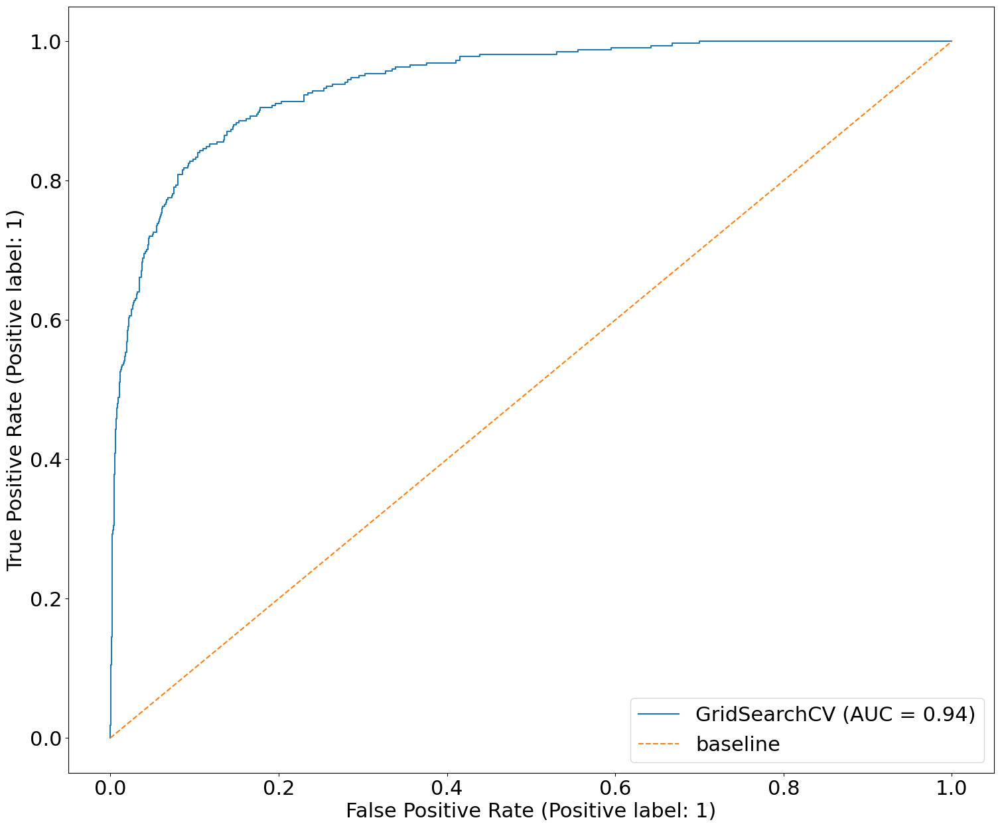

In [246]:
# from sklearn metrics
plot_roc_curve(svc_gridsearch, X_test_ori_sc, y_test)
plt.plot([0, 1], [0, 1],
         label='baseline', linestyle='--') # to simulate prediction of constant class of data points 
plt.legend();

In [247]:
roc_auc_score(y_test_ori, svc_gridsearch.predict_proba(X_test_ori_sc)[:,1])

0.9403210780988558

#### Filtered dataset

In [248]:
svc_gridsearch.fit(X_train_sc, y_train);

Fitting 5 folds for each of 12 candidates, totalling 60 fits


In [249]:
svc_gridsearch.score(X_train_sc, y_train)

0.9645722750277743

In [250]:
svc_gridsearch.score(X_test_sc, y_test)

0.9397828232971372

In [251]:
print(svc_gridsearch.best_score_)

0.9423523811699835


In [252]:
svc_gridsearch.best_params_

{'C': 10, 'kernel': 'rbf', 'probability': True}

In [253]:
preds = svc_gridsearch.predict(X_test_sc)

In [254]:
confusion_matrix(y_test, preds) 

array([[1662,   39],
       [  83,  242]])

In [255]:
tn, fp, fn, tp = confusion_matrix(y_test, preds).ravel()

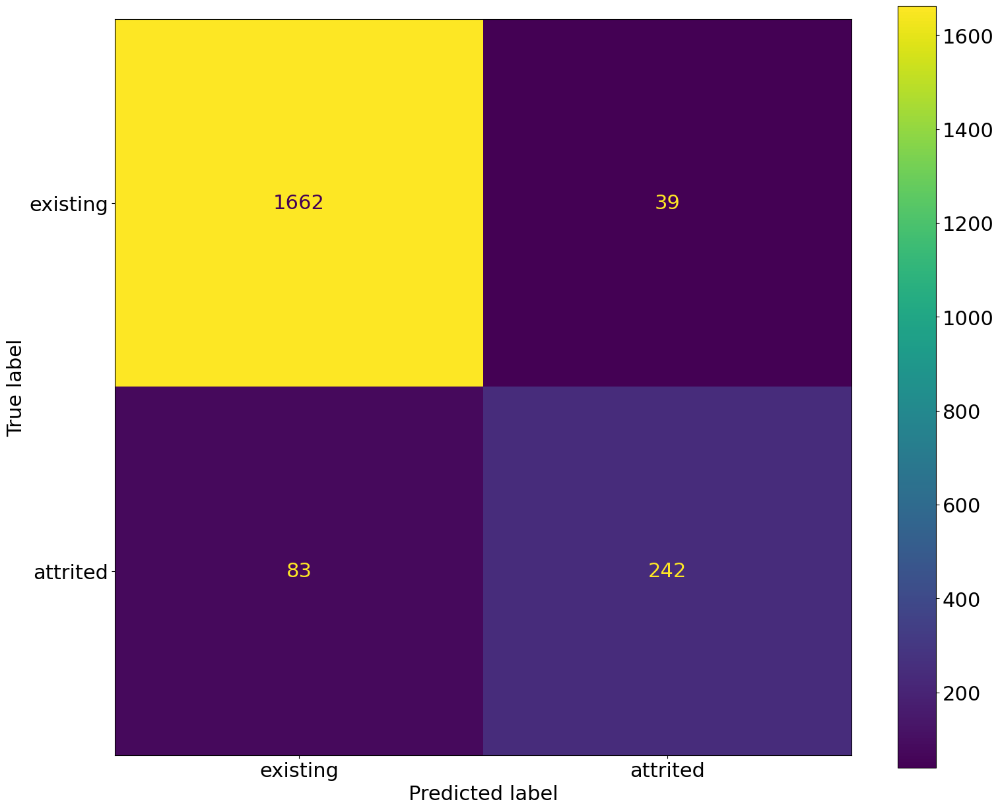

In [256]:
cm = confusion_matrix(y_test, preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['existing', 'attrited'])
disp.plot();

In [257]:
f1_score(y_train, svc_gridsearch.predict(X_train_sc))

0.8858846918489065

In [258]:
f1_score(y_test, preds)

0.7986798679867987

/Users/jerometan/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


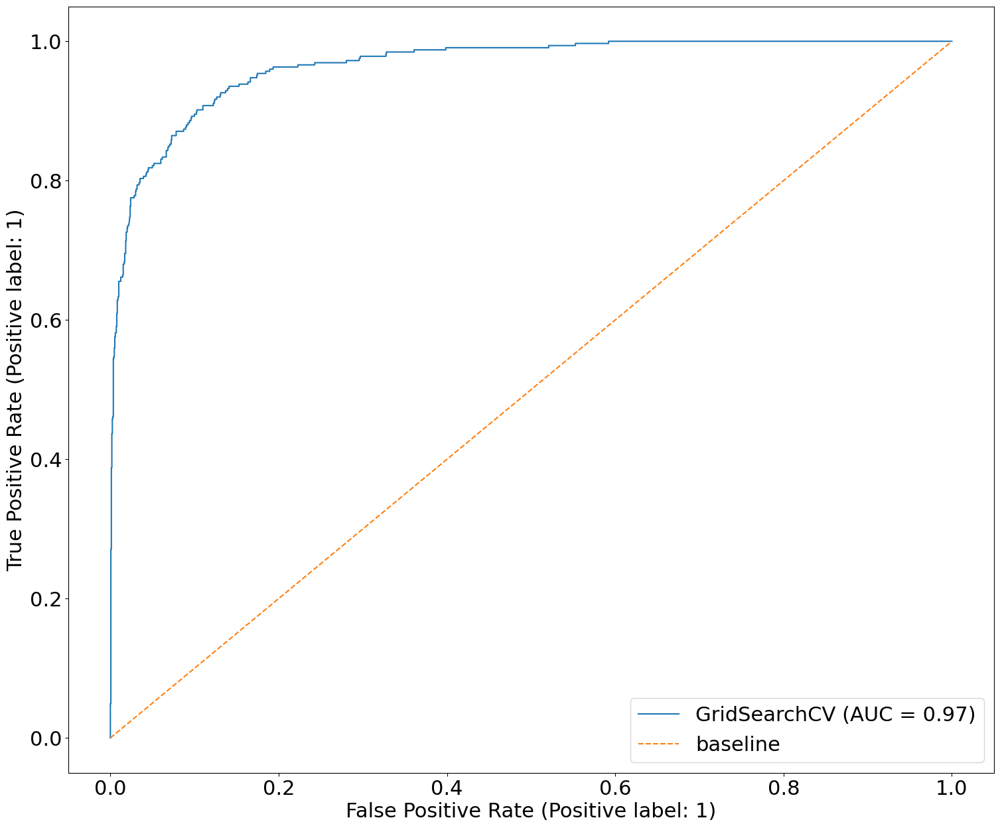

In [259]:
# from sklearn metrics
plot_roc_curve(svc_gridsearch, X_test_sc, y_test)
plt.plot([0, 1], [0, 1],
         label='baseline', linestyle='--') # to simulate prediction of constant class of data points 
plt.legend();

In [260]:
roc_auc_score(y_test, svc_gridsearch.predict_proba(X_test_sc)[:,1])

0.9654972188305521

#### Model Evaluation

|Model|Dataset|Accuracy (train data set)|Accuracy (test data set)|F1 score (train data set)|F1 score (test data set)|ROC AUC|
|---|---|---|---|---|---|---|
|K-nearest neighbor|Original|0.897|0.876|0.554|0.419|0.856|
|K-nearest neighbor|Filtered|0.941|0.926|0.795|0.739|0.944|
|Bagging Classifier|Original|1.0|0.906|1.0|0.586|0.983|
|Bagging Classifier|Filtered|1.0|0.955|1.0|0.854|0.985|
|Random Forest|Original|0.999|0.956|0.997|0.847|0.985|
|Random Forest|Filtered|0.999|0.956|0.998|0.856|0.985|
|Ada Boost Classifier|Original|0.972|0.957|0.912|0.861|0.984|
|Ada Boost Classifier|Filtered|0.964|0.956|0.887|0.856|0.983|
|Support Vector Model|Original|0.981|0.915|0.938|0.709|0.940|
|Support Vector Model|Filtered|0.965|0.940|0.886|0.799|0.965|

We noted that all of the fitted models are performing much better than the baseline model (predicting majority class). The baseline accuracy was only 83.93% in which everything was predicted as the majority class. The fitted models all have a higher accuracy as compared to the baseline accuracy. Based on the table above with the accuracy scores (comparing train and test data set) and the F1 score (comparing train and test data set), we noted that all of the models appear to overfit. For the K-nearest neighbor, bagging classifier and random forest models, the filtered dataset performs better than the original dataset. For the support vector model, we noted that the accuracy and F1 score of the train data is higher for the original dataset as compared to the filtered dataset. However, the accuracy and F1 score for the test data fares better for the filtered dataset, which means that it is less of an overfit. For the ada boost classifier model, we noted that all the classification metric scores in the table fare slightly better for the original dataset as compared to the filtered dataset. However, we will select ada boost classifer model with filtered dataset as our final choice as it is slightly less overfit and still provides very close accuracy and F1 score on the test data as well as the ROC AUC value.

## Feature Importance

In [261]:
ada = AdaBoostClassifier(random_state=42, n_estimators = 100, learning_rate = 0.9)
ada.fit(X_train_sc, y_train)

AdaBoostClassifier(learning_rate=0.9, n_estimators=100, random_state=42)

In [262]:
importance = ada.feature_importances_

In [263]:
# Output importances 
imp_list = []
for i,v in enumerate(importance):
    imp_list.append((i, v))
sorted_list = sorted(imp_list, key=lambda x: x[1], reverse=True)
print('The top 10 Feature importances are:' '\n')
for f, i in sorted_list[:10]:
    print(f'{X_train.columns[f]}, Score: {round(i, 3)}')

The top 10 Feature importances are:

total_trans_amt, Score: 0.32
total_trans_ct, Score: 0.16
total_amt_chng_q4_q1, Score: 0.14
total_revolving_bal, Score: 0.07
total_ct_chng_q4_q1, Score: 0.07
months_inactive_12_mon, Score: 0.06
contacts_count_12_mon, Score: 0.05
total_relationship_count, Score: 0.04
credit_limit, Score: 0.04
avg_utilization_ratio, Score: 0.04


In [264]:
feature_importance_10 = pd.DataFrame({'feature':['total_trans_amt','total_trans_ct','total_amt_chng_q4_q1',
                                 'total_revolving_bal','total_ct_chng_q4_q1','months_inactive_12_mon', 'contacts_count_12_mon',
                                  'total_relationship_count', 'credit_limit', 'avg_utilization_ratio'], 'score':[0.32, 0.16, 0.14, 0.07, 0.07, 0.06, 0.05, 0.04, 0.04, 0.04]})

In [265]:
feature_importance_10 = feature_importance_10.sort_values('score')

<BarContainer object of 10 artists>

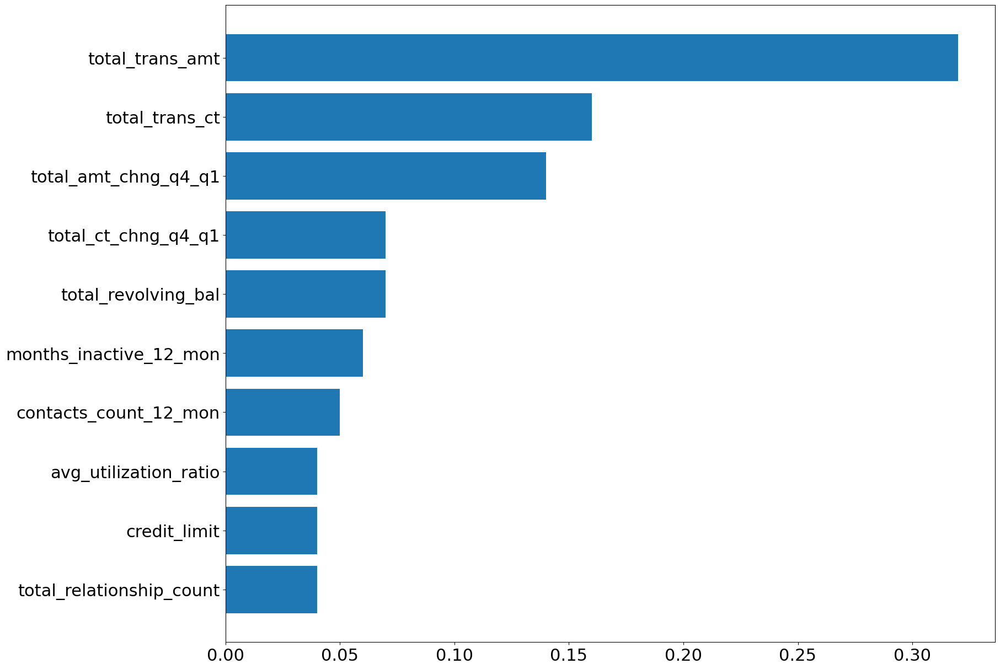

In [266]:
plt.barh(feature_importance_10['feature'], feature_importance_10['score'])

Based on the selected model (Ada Boost Classifier on the filtered dataset), we obtain the top 10 features that are being utilized by the model in classifying on whether the customer will attrite. We noted that there are 3 features which seems to have a larger effect on the model that is being used to predict the target variable (i.e. attrition) as compared to the other features. These 3 features are total transaction amount (last 12 months), total trasaction count (last 12 months) and total amount change (Q4 over Q1). 

### Threshold > 0.05 for feature selection

In [267]:
dep_model = combined_data.loc[:, ['attrition_flag','total_trans_amt','total_trans_ct','total_amt_chng_q4_q1',
                                 'total_revolving_bal','total_ct_chng_q4_q1','months_inactive_12_mon']]

In [268]:
dep_model.head()

,attrition_flag,total_trans_amt,total_trans_ct,total_amt_chng_q4_q1,total_revolving_bal,total_ct_chng_q4_q1,months_inactive_12_mon
0,0,1144,42,1.335,777,1.625,1
1,0,1291,33,1.541,864,3.714,1
2,0,1887,20,2.594,0,2.333,1
3,0,1171,20,1.405,2517,2.333,4
4,0,816,28,2.175,0,2.500,1


In [269]:
X_dep = dep_model.drop('attrition_flag', axis=1)
y_dep = dep_model['attrition_flag']

In [270]:
X_train_dep, X_test_dep, y_train_dep, y_test_dep = train_test_split(X_dep,y_dep,test_size=0.2,stratify=y_dep,random_state=42)

In [271]:
# Instantiate.
ss = StandardScaler()

# Fit and transform train.
X_train_dep_sc = ss.fit_transform(X_train_dep)

# Transform test.
X_test_dep_sc = ss.transform(X_test_dep)

In [272]:
ada.fit(X_train_dep_sc, y_train_dep);

In [273]:
ada.score(X_train_dep_sc, y_train_dep)

0.9567954573509443

In [274]:
ada.score(X_test_dep_sc, y_test_dep)

0.9417571569595261

In [275]:
preds = ada.predict(X_test_dep_sc)

In [276]:
confusion_matrix(y_test_dep, preds) 

array([[1660,   41],
       [  77,  248]])

In [277]:
tn, fp, fn, tp = confusion_matrix(y_test_dep, preds).ravel()

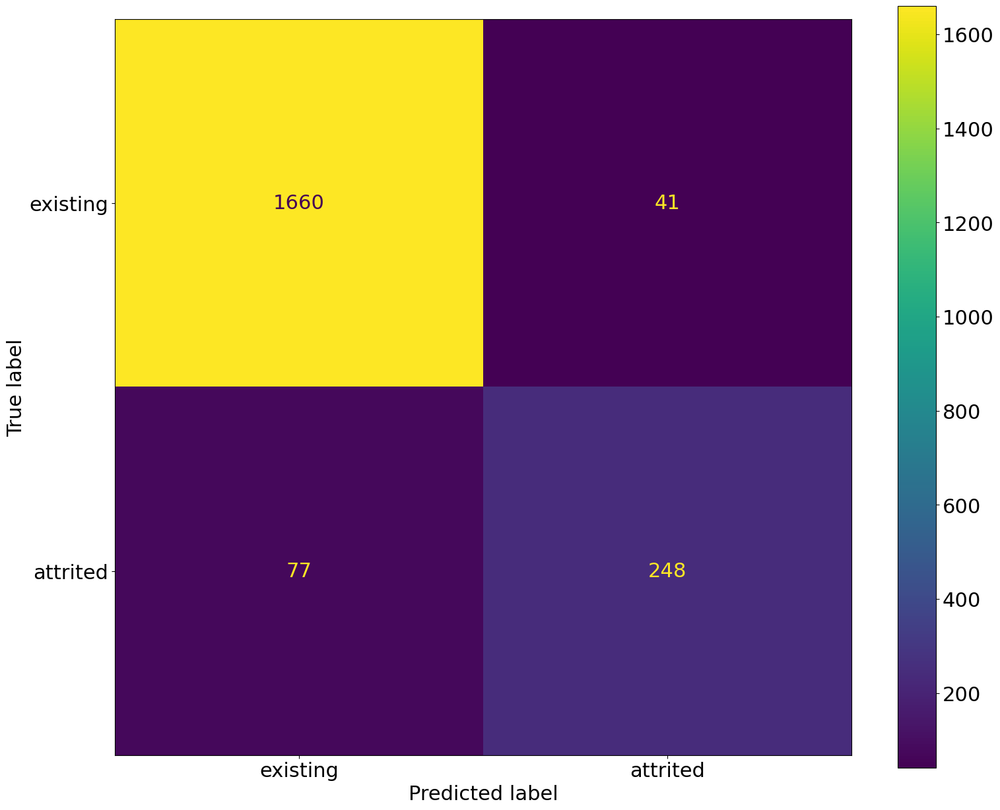

In [278]:
cm = confusion_matrix(y_test_dep, preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['existing', 'attrited'])
disp.plot();

In [279]:
f1_score(y_train_dep, ada.predict(X_train_dep_sc))

0.8610007942811755

In [280]:
f1_score(y_test_dep, preds)

0.8078175895765474

/Users/jerometan/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


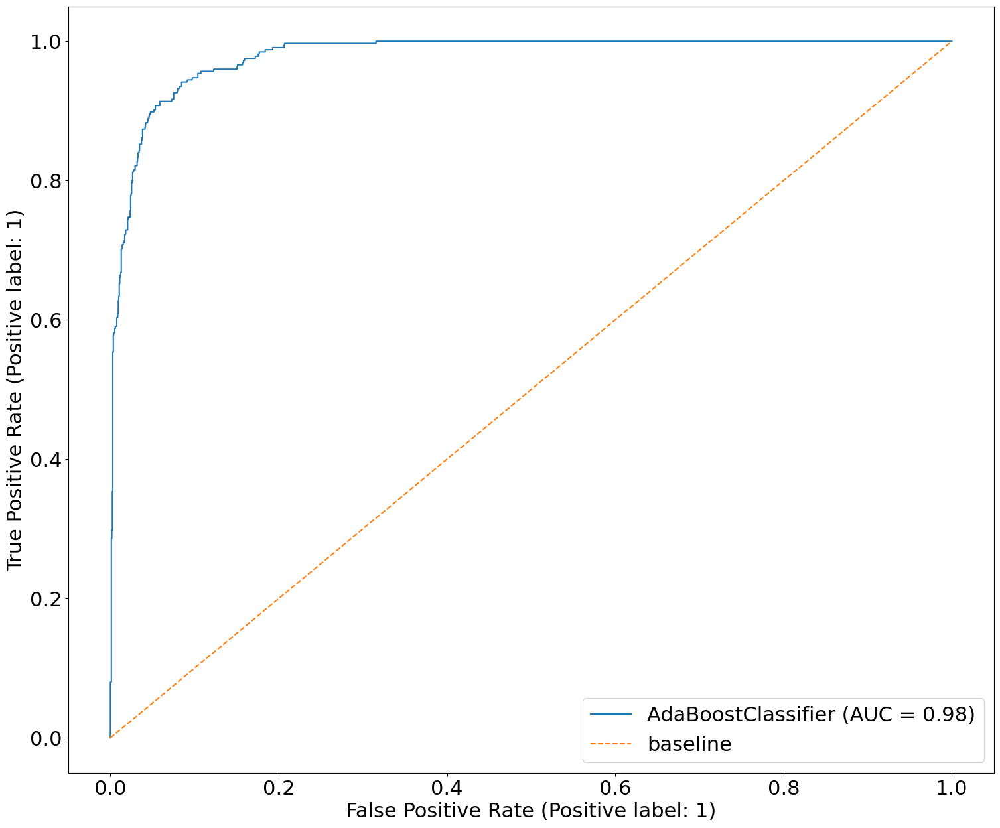

In [281]:
# from sklearn metrics
plot_roc_curve(ada, X_test_dep_sc, y_test_dep)
plt.plot([0, 1], [0, 1],
         label='baseline', linestyle='--') # to simulate prediction of constant class of data points 
plt.legend();

In [282]:
roc_auc_score(y_test_dep, ada.predict_proba(X_test_dep_sc)[:,1])

0.9796707818930042

### Threshold > 0.04 for feature selection

In [283]:
dep_model_1 = combined_data.loc[:, ['attrition_flag','total_trans_amt','total_trans_ct','total_amt_chng_q4_q1',
                                 'total_revolving_bal','total_ct_chng_q4_q1','months_inactive_12_mon', 
                                    'contacts_count_12_mon']]

In [284]:
X_dep_1 = dep_model_1.drop('attrition_flag', axis=1)
y_dep_1 = dep_model_1['attrition_flag']

In [285]:
X_train_dep_1, X_test_dep_1, y_train_dep_1, y_test_dep_1 = train_test_split(X_dep_1,y_dep_1,test_size=0.2,stratify=y_dep_1,random_state=42)

In [286]:
# Instantiate.
ss = StandardScaler()

# Fit and transform train.
X_train_dep_1_sc = ss.fit_transform(X_train_dep_1)

# Transform test.
X_test_dep_1_sc = ss.transform(X_test_dep_1)

In [287]:
ada.fit(X_train_dep_1_sc, y_train_dep_1);

In [288]:
ada.score(X_train_dep_1_sc, y_train_dep_1)

0.957042340451796

In [289]:
ada.score(X_test_dep_1_sc, y_test_dep_1)

0.9471865745310958

In [290]:
preds = ada.predict(X_test_dep_1_sc)

In [291]:
confusion_matrix(y_test_dep_1, preds) 

array([[1662,   39],
       [  68,  257]])

In [292]:
tn, fp, fn, tp = confusion_matrix(y_test_dep_1, preds).ravel()

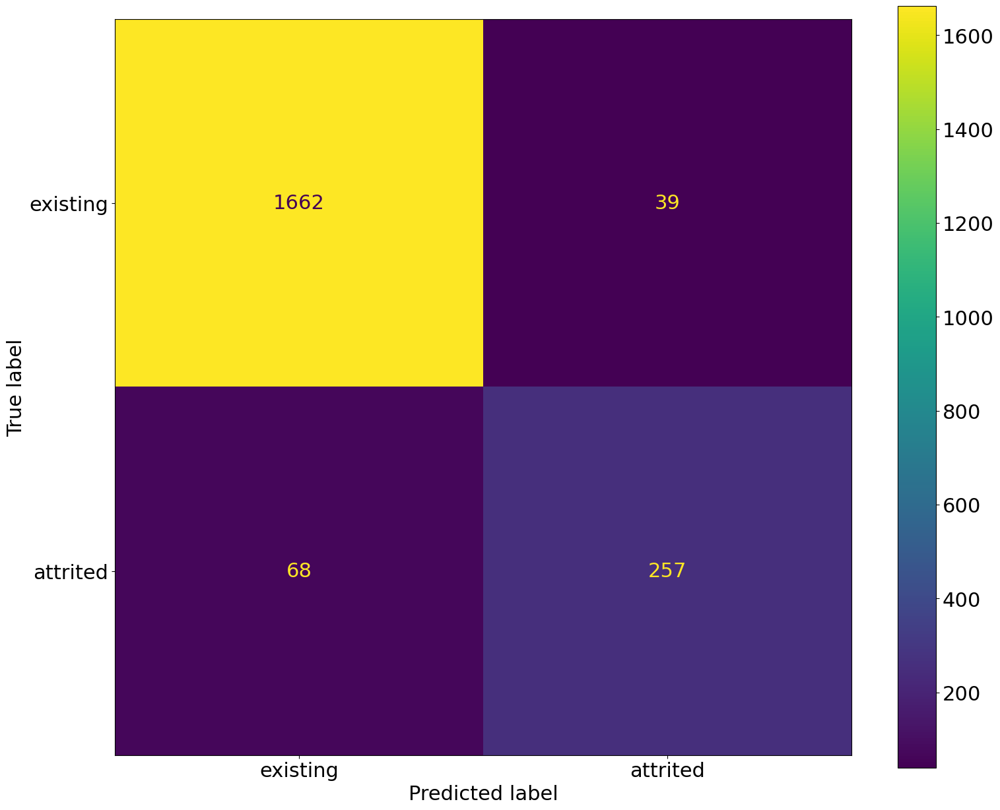

In [293]:
cm = confusion_matrix(y_test_dep_1, preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['existing', 'attrited'])
disp.plot();

In [294]:
f1_score(y_train_dep_1, ada.predict(X_train_dep_1_sc))

0.8624505928853755

In [295]:
f1_score(y_test_dep_1, preds)

0.8276972624798713

/Users/jerometan/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


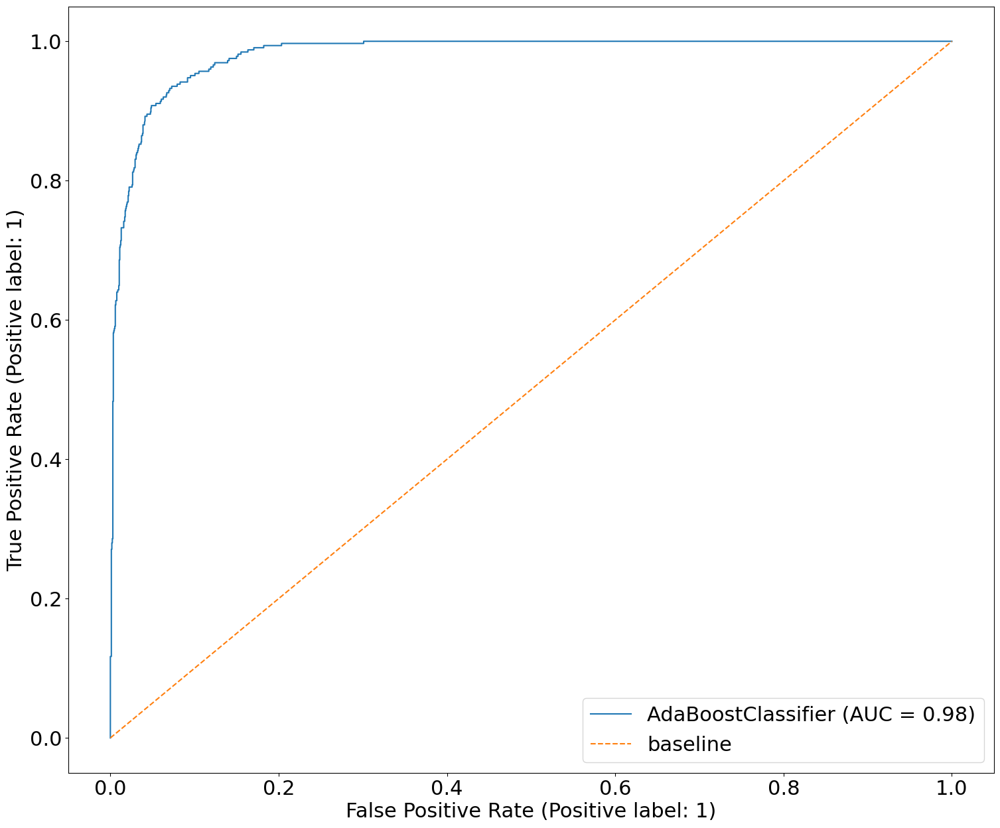

In [296]:
# from sklearn metrics
plot_roc_curve(ada, X_test_dep_1_sc, y_test_dep_1)
plt.plot([0, 1], [0, 1],
         label='baseline', linestyle='--') # to simulate prediction of constant class of data points 
plt.legend();

In [297]:
roc_auc_score(y_test_dep_1, ada.predict_proba(X_test_dep_1_sc)[:,1])

0.9815990593768372

### Model with top 10 features

In [298]:
dep_model_2 = combined_data.loc[:, ['attrition_flag','total_trans_amt','total_trans_ct','total_amt_chng_q4_q1',
                                 'total_revolving_bal','total_ct_chng_q4_q1','months_inactive_12_mon', 'contacts_count_12_mon',
                                  'total_relationship_count', 'credit_limit', 'avg_utilization_ratio']]

In [299]:
X_dep_2 = dep_model_2.drop('attrition_flag', axis=1)
y_dep_2 = dep_model_2['attrition_flag']

In [300]:
X_train_dep_2, X_test_dep_2, y_train_dep_2, y_test_dep_2 = train_test_split(X_dep_2,y_dep_2,test_size=0.2,stratify=y_dep_2,random_state=42)

In [301]:
# Instantiate.
ss = StandardScaler()

# Fit and transform train.
X_train_dep_2_sc = ss.fit_transform(X_train_dep_2)

# Transform test.
X_test_dep_2_sc = ss.transform(X_test_dep_2)

In [302]:
ada.fit(X_train_dep_2_sc, y_train_dep_2);

In [303]:
ada.score(X_train_dep_2_sc, y_train_dep_2)

0.9640785088260708

In [304]:
ada.score(X_test_dep_2_sc, y_test_dep_2)

0.9550839091806516

In [305]:
preds = ada.predict(X_test_dep_2_sc)

In [306]:
confusion_matrix(y_test_dep_2, preds) 

array([[1667,   34],
       [  57,  268]])

In [307]:
tn, fp, fn, tp = confusion_matrix(y_test_dep_2, preds).ravel()

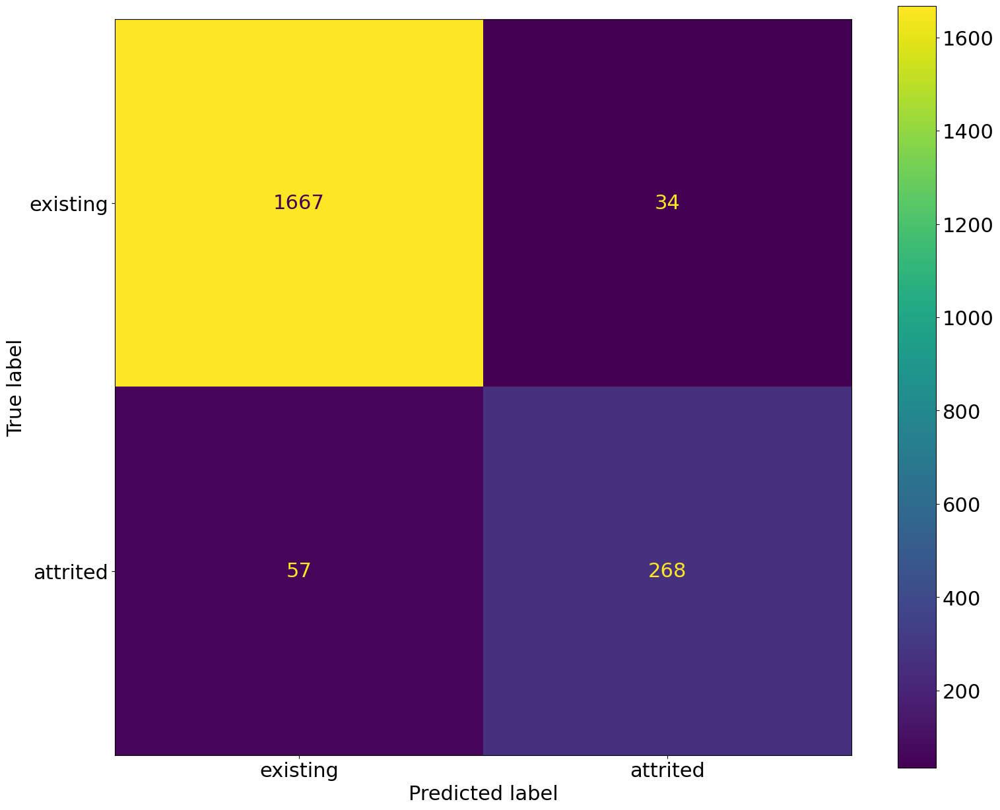

In [308]:
cm = confusion_matrix(y_test_dep_2, preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['existing', 'attrited'])
disp.plot();

In [309]:
f1_score(y_train_dep_2, ada.predict(X_train_dep_2_sc))

0.8859270874166993

In [310]:
f1_score(y_test_dep_2, preds)

0.8548644338118022

/Users/jerometan/mambaforge/envs/dsi-sg/lib/python3.8/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metrics.RocCurveDisplay.from_predictions` or :meth:`sklearn.metrics.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


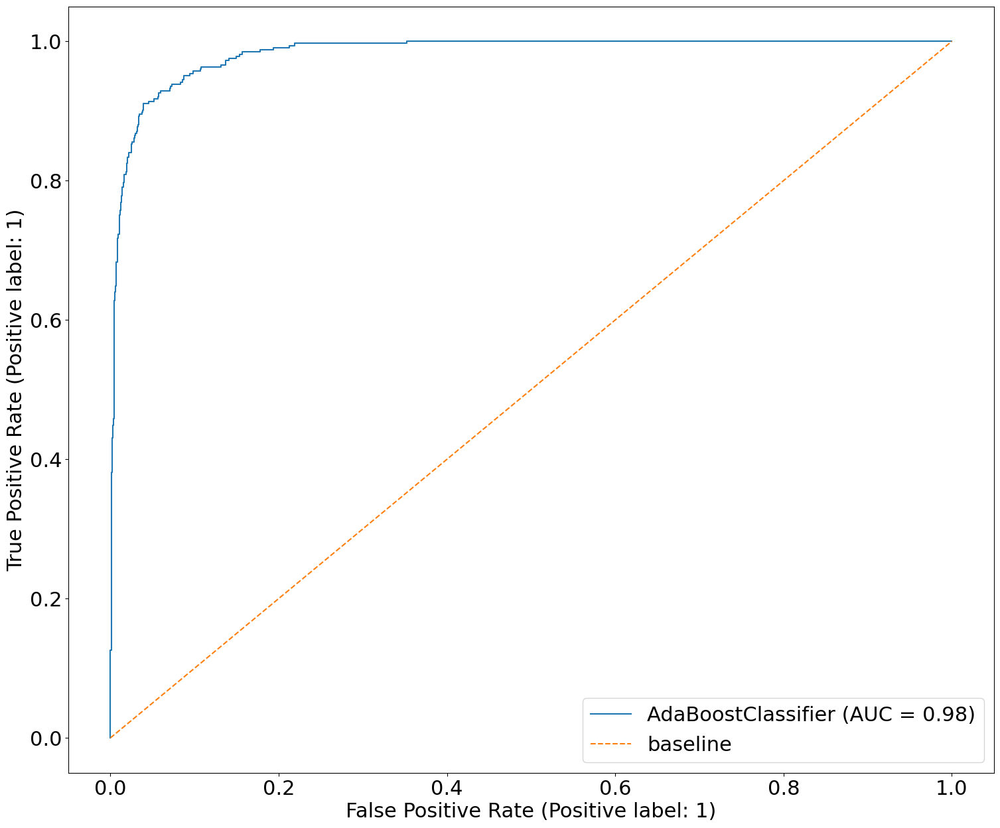

In [311]:
# from sklearn metrics
plot_roc_curve(ada, X_test_dep_2_sc, y_test_dep_2)
plt.plot([0, 1], [0, 1],
         label='baseline', linestyle='--') # to simulate prediction of constant class of data points 
plt.legend();

In [312]:
roc_auc_score(y_test_dep_2, ada.predict_proba(X_test_dep_2_sc)[:,1])

0.9834992990548546

## Further Evaluation, Conclusion and Recommendations

|Number of features (Threshold)|Accuracy (train data set)|Accuracy (test data set)|F1 score (train data set)|F1 score (test data set)|ROC AUC|
|---|---|---|---|---|---|
|6 (>0.05)|0.957|0.942|0.861|0.808|0.980|
|7 (>0.04)|0.957|0.947|0.862|0.828|0.982|
|10 (>0.01)|0.964|0.955|0.886|0.855|0.983|
|11 (no threshold)|0.964|0.956|0.887|0.856|0.983|

Based on the thresholds which we have set above to further do feature selection to see if we are able to reduce the number of features without compromising too much of the evaluation metrics of the ada boost classification model, we noted that the model with the top 10 features have very similar evaluation metrics scores with the model, which we have earlier selected, that was fitted on the filtered dataset (containing 11 features). Therefore, our final selection of model will be the ada boost classifier with the top 10 features (based on feature importance). 

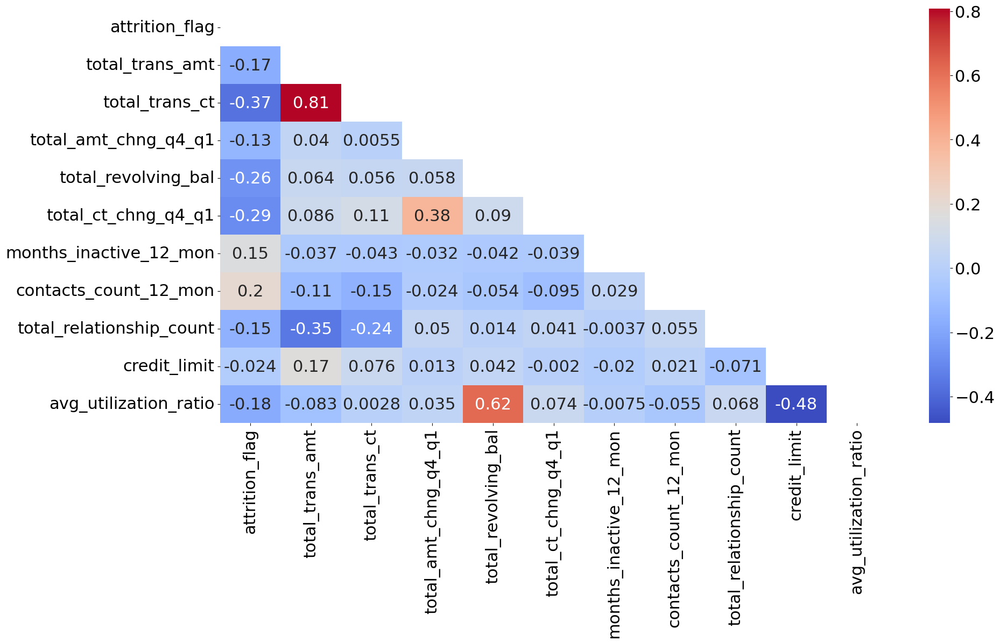

In [313]:
# Plotting heatmap to find the correlation between each feature with attrition
mask = np.zeros_like(dep_model_2.corr())
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize=(20, 10))
sns.heatmap(
    dep_model_2.corr(),
    cmap='coolwarm',
    annot=True,
    mask = mask
);

Based on the correlation heat map with attrition flag, we noted that only 2 features (months inactive in the past 12 months and number of contacts in the past 12 months) are positively correlated with attrition flag. This means that the higher the values for these 2 features, the higher the chances for the customer to attrite. For the remaining 8 features, they are negatively correlated with attrition flag. This means that the lower the values for these 8 features, the higher the chances for the customer to attrite.

Banks can try to understand the needs of the customer so that they can recommend credit cards with specific purposes which the customer would want (i.e. cash back, air miles, etc.) so that the customer will use the card more often and thereby, having the possibility of increasing both the transaction amount and transaction count.

Banks can also try to provide credit card offers and discounts to potential attriting customers to entice them to stay with the Bank.

With our classification model, the bank will be able to predict which are the customers which are likely to attrite and the bank will be able to take action and reach out to those customers to discuss on what can be done so as to be able to retain those customers with the Bank moving forward.

#### Saving the model on joblib

In [314]:
import joblib

In [315]:
filename = 'model.sav'

In [316]:
joblib.dump(ada, filename)

['model.sav']

#### Creating 2 test datasets for streamlit app

In [317]:
streamlit_test = X_test_dep_2.iloc[11:25, :]

In [318]:
streamlit_test.to_csv('../capstone/streamlit_test.csv', index = False)

In [319]:
streamlit_test

,total_trans_amt,total_trans_ct,total_amt_chng_q4_q1,total_revolving_bal,total_ct_chng_q4_q1,months_inactive_12_mon,contacts_count_12_mon,total_relationship_count,credit_limit,avg_utilization_ratio
2720,3103,65,0.985,2517,0.625,3,4,6,26566.0,0.095
8964,8440,102,0.801,2097,0.700,1,3,1,9070.0,0.231
7106,4220,79,0.716,2201,0.612,4,2,3,2713.0,0.811
5375,4326,74,0.791,0,0.721,1,1,5,4370.0,0.000
8226,4644,79,0.810,1896,0.612,3,3,1,2953.0,0.642
1066,2510,44,0.607,1514,0.294,3,2,3,2174.0,0.696
9552,7866,63,1.052,2517,0.750,3,3,6,34516.0,0.073
1467,1371,38,0.615,1536,0.407,3,4,3,1942.0,0.791
1107,1888,43,0.879,2145,0.433,1,4,3,5335.0,0.402
2634,3561,73,0.576,2016,0.622,3,2,4,4852.0,0.415


In [320]:
streamlit_test_2 = X_test_dep_2.iloc[11:35, :]

In [321]:
streamlit_test_2.to_csv('../capstone/streamlit_test_2.csv', index = False)

In [322]:
streamlit_test_2

,total_trans_amt,total_trans_ct,total_amt_chng_q4_q1,total_revolving_bal,total_ct_chng_q4_q1,months_inactive_12_mon,contacts_count_12_mon,total_relationship_count,credit_limit,avg_utilization_ratio
2720,3103,65,0.985,2517,0.625,3,4,6,26566.0,0.095
8964,8440,102,0.801,2097,0.700,1,3,1,9070.0,0.231
7106,4220,79,0.716,2201,0.612,4,2,3,2713.0,0.811
5375,4326,74,0.791,0,0.721,1,1,5,4370.0,0.000
8226,4644,79,0.810,1896,0.612,3,3,1,2953.0,0.642
1066,2510,44,0.607,1514,0.294,3,2,3,2174.0,0.696
9552,7866,63,1.052,2517,0.750,3,3,6,34516.0,0.073
1467,1371,38,0.615,1536,0.407,3,4,3,1942.0,0.791
1107,1888,43,0.879,2145,0.433,1,4,3,5335.0,0.402
2634,3561,73,0.576,2016,0.622,3,2,4,4852.0,0.415


#### Saving dataset for the standard scalar function in streamlit

In [323]:
X_train_dep_2

,total_trans_amt,total_trans_ct,total_amt_chng_q4_q1,total_revolving_bal,total_ct_chng_q4_q1,months_inactive_12_mon,contacts_count_12_mon,total_relationship_count,credit_limit,avg_utilization_ratio
2856,1755,42,0.686,2230,0.448,3,2,4,2570.0,0.868
6515,2282,38,0.849,0,0.583,2,3,5,25276.0,0.000
7141,4277,89,0.892,915,0.854,3,1,6,11670.0,0.078
632,1652,41,0.869,1593,0.367,1,3,3,3124.0,0.510
3496,3874,72,0.725,1185,0.714,2,3,4,34516.0,0.034
...,...,...,...,...,...,...,...,...,...,...
6147,5103,83,0.852,0,0.844,1,3,3,5869.0,0.000
8858,7847,65,0.780,1022,0.857,3,3,1,1959.0,0.522
3284,2260,46,0.826,0,1.000,3,4,3,9721.0,0.000
7551,4430,66,0.482,2517,0.692,2,1,6,2725.0,0.924


In [324]:
X_train_dep_2.to_csv('../capstone/X_train_dep_2.csv', index = False)